## Import packages

In [27]:
import os
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import copy
import sys

## Read fluorescence dFF structure data

In [28]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515red_dFFStructuresrun4.mat')
mat_data = scipy.io.loadmat(path_)
fluo_dFF_run4 = mat_data['Master_dFF']
fluo_dFF_run4 = fluo_dFF_run4[:, :-1] # delete the last column (49th)
# print(type(fluo_dFF_run4))
# print(fluo_dFF_run4.shape)
# print(fluo_dFF_run4[0,0].shape)

conca_dFF_run4 = np.empty((0,fluo_dFF_run4[0,0].shape[2]))
index_record = []
action = True
while action:
    action = False
    for index, value in np.ndenumerate(fluo_dFF_run4):
        value = np.squeeze(value)
        # print(value.shape)
        # print(value[-31:, :].shape)
        if conca_dFF_run4.shape[0] == 0:
            conca_dFF_run4 = np.concatenate((conca_dFF_run4, value), axis=0)
            index_record = index_record + [index]
            action = True
            break
        if np.array_equal(conca_dFF_run4[:31, :], value[-31:, :]):
            conca_dFF_run4 = np.concatenate((value[:-31, :], conca_dFF_run4), axis=0)
            index_record = [index] + index_record
            action = True
            break
        if np.array_equal(conca_dFF_run4[-31:, :], value[:31, :]):
            conca_dFF_run4 = np.concatenate((conca_dFF_run4, value[31:, :]), axis=0)
            index_record = index_record + [index]
            action = True
            break
print(conca_dFF_run4.shape)

# arr[:31, :]
# arr[-31:, :]
# [0:31, :]
# [62:93, :]
# data_squeeze = np.squeeze(fluo_dFF_run4[0,0])
# print(data_squeeze.shape)
# empty_array = np.concatenate((empty_array, array1, array2), axis=0)

(93, 10)


## Read pupil data

In [29]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

### Read pupil F

In [30]:
# fucntion for calculate pre 2s mean, stimulation 2s mean, and post 2s mean
def calculate_means_by_ranges(arr): # input shape is (93, 1, 10)
    range1_mean = np.mean(arr[0:31], axis=0)
    range2_mean = np.mean(arr[31:62], axis=0)
    range3_mean = np.mean(arr[62:93], axis=0)

    # Transpose
    range1_mean = np.transpose(range1_mean)
    range2_mean = np.transpose(range2_mean)
    range3_mean = np.transpose(range3_mean)

    # Combine means into a 10x3 array
    combined_means = np.concatenate((range1_mean, range2_mean, range3_mean), axis=1)

    return combined_means

#### sum/mean along conditions

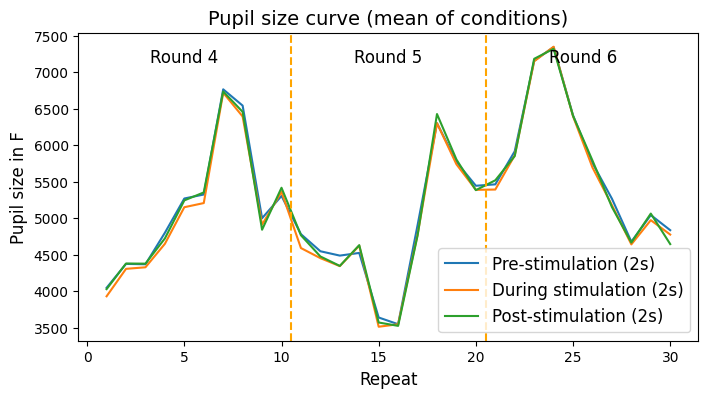

In [31]:
### read dFF values for pupil size for each run (round)

## run 4

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_f']
pupil_area_run4 = pupil_area_run4[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run4):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run4
    pupil_area_run4[index] = value # change original pupil_area_run4
# print(pupil_area_run4.shape)
# print(type(pupil_area_run4))
# print(type(pupil_area_run4[0,1]))
# print(pupil_area_run4[0,1].shape)

# sum and average red data to see the decay
sum_mat_pupil_run4 = np.zeros((pupil_area_run4.shape[0], 1), dtype=np.ndarray)
mean_mat_pupil_run4 = np.zeros((pupil_area_run4.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run4.shape[0]):
    sum = np.zeros((pupil_area_run4[0,0].shape[0], 1))
    for j in range(pupil_area_run4.shape[1]):
        sum = sum + pupil_area_run4[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run4[i, 0] = sum
    mean_mat_pupil_run4[i, 0] = sum / pupil_area_run4.shape[1]


## run 5

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_f']
pupil_area_run5 = pupil_area_run5[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run5):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run5
    pupil_area_run5[index] = value # change original pupil_area_run5
# print(pupil_area_run5.shape)
# print(type(pupil_area_run5))
# print(type(pupil_area_run5[0,1]))
# print(pupil_area_run5[0,1].shape)

# sum and average red data to see the decay
sum_mat_pupil_run5 = np.zeros((pupil_area_run5.shape[0], 1), dtype=np.ndarray)
mean_mat_pupil_run5 = np.zeros((pupil_area_run5.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run5.shape[0]):
    sum = np.zeros((pupil_area_run5[0,0].shape[0], 1))
    for j in range(pupil_area_run5.shape[1]):
        sum = sum + pupil_area_run5[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run5[i, 0] = sum
    mean_mat_pupil_run5[i, 0] = sum / pupil_area_run5.shape[1]


## run 6

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_f']
pupil_area_run6 = pupil_area_run6[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run6):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run6
    pupil_area_run6[index] = value # change original pupil_area_run6
# print(pupil_area_run6.shape)
# print(type(pupil_area_run6))
# print(type(pupil_area_run6[0,1]))
# print(pupil_area_run6[0,1].shape)

# sum and average red data to see the decay
sum_mat_pupil_run6 = np.zeros((pupil_area_run6.shape[0], 1), dtype=np.ndarray)
mean_mat_pupil_run6 = np.zeros((pupil_area_run6.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run6.shape[0]):
    sum = np.zeros((pupil_area_run6[0,0].shape[0], 1))
    for j in range(pupil_area_run6.shape[1]):
        sum = sum + pupil_area_run6[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run6[i, 0] = sum
    mean_mat_pupil_run6[i, 0] = sum / pupil_area_run6.shape[1]


# print(sum_mat_pupil_run4)
# print(sum_mat_pupil_run5)
# print(sum_mat_pupil_run6)
sum_mat_pupil = np.concatenate((sum_mat_pupil_run4[0,0], sum_mat_pupil_run5[0,0], sum_mat_pupil_run6[0,0]), axis=0)
mean_mat_pupil = np.concatenate((mean_mat_pupil_run4[0,0], mean_mat_pupil_run5[0,0], mean_mat_pupil_run6[0,0]), axis=0)
# print(sum_mat_pupil.T)
# print(mean_mat_pupil.T)


# plot
data = mean_mat_pupil
x = np.arange(1, 31)
fig, ax = plt.subplots(figsize=(8, 4))  # Adjust the figure size as desired
ax.plot(x,data[:, 0], label='Pre-stimulation (2s)')
ax.plot(x,data[:, 1], label='During stimulation (2s)')
ax.plot(x,data[:, 2], label='Post-stimulation (2s)')
ax.legend(fontsize='medium')
ax.set_xlabel('Repeat', fontsize=12)  # Adjust the label size as desired
ax.set_ylabel('Pupil size in F', fontsize=12)  # Adjust the label size as desired
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 7200, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 7200, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 7200, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Pupil size curve (mean of conditions)', fontsize=14)  # Adjust the title size as desired
ax.tick_params(axis='both', labelsize=10)  # Adjust the tick size as desired
plt.show()


#### sum/mean along repeats

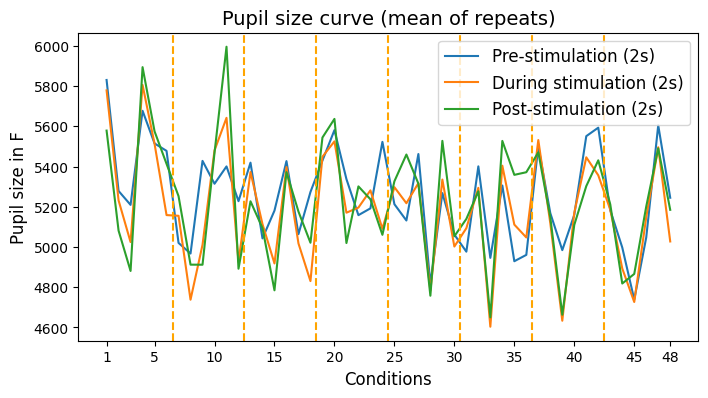

In [32]:
### read dFF values for pupil size for each run (round)

## run 4

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_f']
pupil_area_run4 = pupil_area_run4[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run4):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run4
    pupil_area_run4[index] = value # change original pupil_area_run4
# print(pupil_area_run4.shape)
# print(type(pupil_area_run4))
# print(type(pupil_area_run4[0,1]))
# print(pupil_area_run4[0,1].shape)

## run 5

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_f']
pupil_area_run5 = pupil_area_run5[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run5):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run5
    pupil_area_run5[index] = value # change original pupil_area_run5
# print(pupil_area_run5.shape)
# print(type(pupil_area_run5))
# print(type(pupil_area_run5[0,1]))
# print(pupil_area_run5[0,1].shape)

## run 6

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_f']
pupil_area_run6 = pupil_area_run6[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run6):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run6
    pupil_area_run6[index] = value # change original pupil_area_run6
# print(pupil_area_run6.shape)
# print(type(pupil_area_run6))
# print(type(pupil_area_run6[0,1]))
# print(pupil_area_run6[0,1].shape)

# stack/concatenate all conditions

# satstackck elements in pupil_area_run4 along the 0th axis
concatenated_run4 = np.stack(pupil_area_run4[0,:], axis=2)
# stack elements in pupil_area_run5 along the 0th axis
concatenated_run5 = np.stack(pupil_area_run5[0,:], axis=2)
# stack elements in pupil_area_run6 along the 0th axis
concatenated_run6 = np.stack(pupil_area_run6[0,:], axis=2)
# Concatenate the results from all three runs along the 1st axis
result = np.concatenate((concatenated_run4, concatenated_run5, concatenated_run6), axis=0)
# print(concatenated_run4.shape)
# print(result.shape)


# plot
data = np.mean(result, axis=0)
x = np.arange(1, 49)
fig, ax = plt.subplots(figsize=(8, 4))  # Adjust the figure size as desired
ax.plot(x,data[0, :], label='Pre-stimulation (2s)')
ax.plot(x,data[1, :], label='During stimulation (2s)')
ax.plot(x,data[2, :], label='Post-stimulation (2s)')
ax.legend(fontsize='medium')
ax.set_xlabel('Conditions', fontsize=12)  # Adjust the label size as desired
ax.set_ylabel('Pupil size in F', fontsize=12)  # Adjust the label size as desired
ax.axvline(x=6.5, color='orange', linestyle='--')
ax.axvline(x=12.5, color='orange', linestyle='--')
ax.axvline(x=18.5, color='orange', linestyle='--')
ax.axvline(x=24.5, color='orange', linestyle='--')
ax.axvline(x=30.5, color='orange', linestyle='--')
ax.axvline(x=36.5, color='orange', linestyle='--')
ax.axvline(x=42.5, color='orange', linestyle='--')
ax.set_title('Pupil size curve (mean of repeats)', fontsize=14)  # Adjust the title size as desired
ax.tick_params(axis='both', labelsize=10)  # Adjust the tick size as desired
# Customize x-axis ticks
tick_positions = [1,5,10,15,20,25,30,35,40,45,48]
plt.xticks(tick_positions)
plt.show()


#### mean for each (condition, repeat)

In [33]:
### read dFF values for pupil size for each run (round)

## run 4

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_f']
pupil_area_run4 = pupil_area_run4[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run4):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run4
    pupil_area_run4[index] = value # change original pupil_area_run4
# print(pupil_area_run4.shape)
# print(type(pupil_area_run4))
# print(type(pupil_area_run4[0,1]))
# print(pupil_area_run4[0,1].shape)
fine_mean_mat_pupil_run4 = copy.deepcopy(pupil_area_run4)

## run 5

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_f']
pupil_area_run5 = pupil_area_run5[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run5):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run5
    pupil_area_run5[index] = value # change original pupil_area_run5
# print(pupil_area_run5.shape)
# print(type(pupil_area_run5))
# print(type(pupil_area_run5[0,1]))
# print(pupil_area_run5[0,1].shape)
fine_mean_mat_pupil_run5 = copy.deepcopy(pupil_area_run5)

## run 6

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_f']
pupil_area_run6 = pupil_area_run6[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run6):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run6
    pupil_area_run6[index] = value # change original pupil_area_run6
# print(pupil_area_run6.shape)
# print(type(pupil_area_run6))
# print(type(pupil_area_run6[0,1]))
# print(pupil_area_run6[0,1].shape)
fine_mean_mat_pupil_run6 = copy.deepcopy(pupil_area_run6)

# concatenate
fine_mean_mat_pupil = np.concatenate((fine_mean_mat_pupil_run4,
                    fine_mean_mat_pupil_run5,
                    fine_mean_mat_pupil_run6),
                    axis = 0)
print(fine_mean_mat_pupil.shape)
print(fine_mean_mat_pupil[0,1].shape)

(3, 48)
(10, 3)


### Read pupil dFF

<class 'numpy.ndarray'>
(10, 1)
<class 'numpy.ndarray'>
(10, 1)
<class 'numpy.ndarray'>
(10, 1)
[[-1.05138376 -0.13521511  0.22459265 -1.30045993 -0.88000986 -0.73014825
  -0.23684986 -0.75100413 -0.24845973  0.99998111 -1.71898365 -0.59187931
  -0.79403246  1.68797097 -1.13479677  1.79954027 -0.81404467  0.29317292
   0.05337399 -0.22734424 -0.60822942 -0.07015685  0.01182725  0.10699081
   0.14049484 -0.31848347 -0.430526    0.32631886 -0.39290653  0.08752607]]


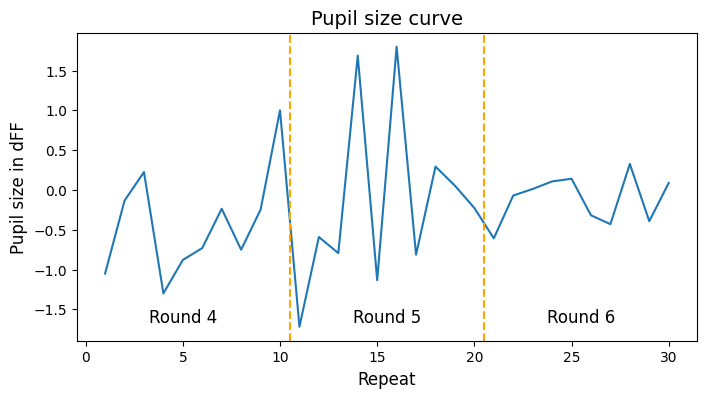

In [34]:
### read dFF values for pupil size for each run (round)

# run 4
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_dFF_mean']
pupil_area_run4 = pupil_area_run4[:, :-1]
print(type(pupil_area_run4[0,1]))
print(pupil_area_run4[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run4 = np.zeros((pupil_area_run4.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run4.shape[0]):
    sum = np.zeros((pupil_area_run4[0,0].shape[0], 1))
    for j in range(pupil_area_run4.shape[1]):
        sum = sum + pupil_area_run4[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run4[i, 0] = sum

# run 5
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_dFF_mean']
pupil_area_run5 = pupil_area_run5[:, :-1]
print(type(pupil_area_run5[0,1]))
print(pupil_area_run5[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run5 = np.zeros((pupil_area_run5.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run5.shape[0]):
    sum = np.zeros((pupil_area_run5[0,0].shape[0], 1))
    for j in range(pupil_area_run5.shape[1]):
        sum = sum + pupil_area_run5[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run5[i, 0] = sum

# run 6
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_dFF_mean']
pupil_area_run6 = pupil_area_run6[:, :-1]
print(type(pupil_area_run6[0,1]))
print(pupil_area_run6[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run6 = np.zeros((pupil_area_run6.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run6.shape[0]):
    sum = np.zeros((pupil_area_run6[0,0].shape[0], 1))
    for j in range(pupil_area_run6.shape[1]):
        sum = sum + pupil_area_run6[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run6[i, 0] = sum


# print(sum_mat_pupil_run4)
# print(sum_mat_pupil_run5)
# print(sum_mat_pupil_run6)
sum_mat_pupil = np.concatenate((sum_mat_pupil_run4[0,0], sum_mat_pupil_run5[0,0], sum_mat_pupil_run6[0,0]), axis=0)
print(sum_mat_pupil.T)


data = sum_mat_pupil
x = np.arange(1, 31)
fig, ax = plt.subplots(figsize=(8, 4))  # Adjust the figure size as desired
ax.plot(x, data)
ax.set_xlabel('Repeat', fontsize=12)  # Adjust the label size as desired
ax.set_ylabel('Pupil size in dFF', fontsize=12)  # Adjust the label size as desired
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, -1.6, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, -1.6, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, -1.6, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Pupil size curve', fontsize=14)  # Adjust the title size as desired
ax.tick_params(axis='both', labelsize=10)  # Adjust the tick size as desired
plt.show()


## Read fluorescence dFF mean data into dicts

In [35]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

# Get a list of all the subdirectories: subfolders are viewed as cell names
cell_names = [f for f in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, f))]
# for cell in cell_names:
#     print(cell)

# Create a dictionary with default values
default_value = 0
cell_data_dict = {cell: default_value for cell in cell_names}
# print(cell_data_dict)

file_suffixes = ['green_Axon.mat', 'green_dFFMeanValues.mat', 'red_dFFMeanValues.mat']

for cell in cell_names:
    print(cell)
    file_names = [cell + suffix for suffix in file_suffixes]

    path_ = file_names[0] # green_Axon.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    axons = mat_data['Axons'] # array containing nested arrays/sub-arrays
    # Squeeze the outer array
    axons = np.squeeze(axons, axis=0)
    for i in range(len(axons)):
        # Squeeze the inner array and convert the data type to 'int'
        axons[i] = np.squeeze(axons[i].astype(int), axis=0)
    # final axons' length is the number of groups with
    # each elements being a nested array of components

    path_ = file_names[1] # green_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_green = mat_data['dFFMeanValues'] # 3 by 49

    path_ = file_names[2] # red_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_red = mat_data['dFFMeanValues'] # 3 by 49

    cell_data_dict[cell] = {'axons': axons,
                'green_dFFMeanValues': dFFMeanValues_green,
                'red_dFFMeanValues': dFFMeanValues_red}

# # Print keys and types
# for key, value in cell_data_dict.items():
#     print("-- * * * * * --")
#     print(key, type(value))
#     for key_, value_ in value.items():
#         print(key_, type(value_))
# print("-- * * * * * --")

CL090_230515
CL090_230518
CL083_230413
CL075_230303


## Decay restoration of red and trend visualization

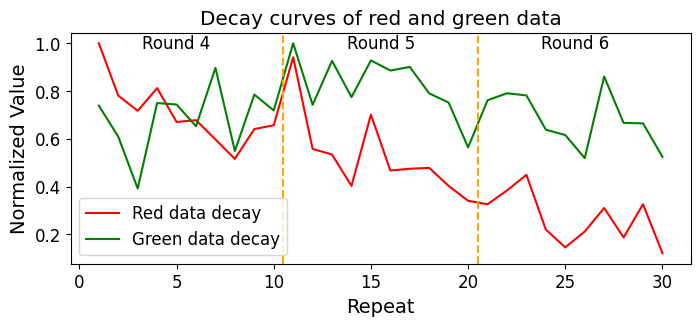

round 0, exponent in the exp func is -0.07472499699077181
round 1, exponent in the exp func is -0.12987990032231914
round 2, exponent in the exp func is -0.05409199709646579


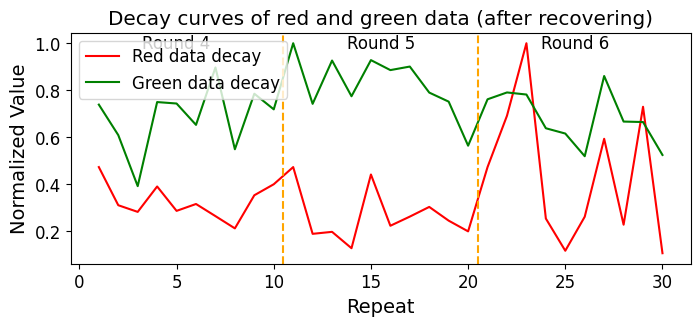

stacked_green.shape is (1440, 281) (compare with 48*3*10=1440)
group_satcked_green.shape, data_axons.shape are: (1440, 23) (23,)
stacked_red.shape is (1440, 1) (compare with 48*3*10=1440)
np.max(group_satcked_green), np.min(group_satcked_green) are: 21.283356459756824 -7.255084464343224
np.max(stacked_red), np.min(stacked_red) are: 1.1687414763592152 -0.46077202173483056


In [36]:
cell_data = copy.deepcopy(cell_data_dict['CL090_230515'])
# cell_data = copy.deepcopy(cell_data_dict['CL075_230303'])
# cell_data = cell_data_dict['CL090_230515']
# cell_data = cell_data_dict['CL075_230303']

# # the following 4 lines of code used for checking if cell_data and
# # cell_data_dict changed after running the code of this chunk; compare
# # with the printing at the end
# print(cell_data['red_dFFMeanValues'][1,1][0,-1])
# print(cell_data['green_dFFMeanValues'][1,1][0,-1])
# print(cell_data_dict['CL090_230515']['red_dFFMeanValues'][1,1][0,-1])
# print(cell_data_dict['CL090_230515']['green_dFFMeanValues'][1,1][0,-1])


delete_small_group = True # delete groups (axons) with less than 3 components

data_green = cell_data['green_dFFMeanValues'][:,:-1] # exclude 49th column
data_red = cell_data['red_dFFMeanValues'][:,:-1] # exclude 49th column
# data_red = cell_data['red_dFFMeanValues'][:,:-1].copy() # exclude 49th column
# the .copy() method is for a NumPy array. Using .copy() on a NumPy array,
# it creates a new copied array but it is a separate and independent object.
# Modifying the copied array will not affect the original array.
# # here uses .copy() to avoid cell_data and cell_data['red_dFFMeanValues'] be changed in
# # the later code line data_red[i,j] = red_recover_factor[i,0] * data_red[i,j], or we can use
# # cell_data = copy.deepcopy(cell_data_dict['CL090_230515']) to guarantee cell_data['red_dFFMeanValues']
# # will not be changed (cell_data will be changed).
# # copy.deepcopy will recursively copy all nested objects; copy.copy cannot do this.
data_axons = cell_data['axons']

# sum red data to see the decay
sum_mat_red = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_red[0,0].shape[0], 1))
    for j in range(data_red.shape[1]):
        sum = sum + data_red[i,j]
    # print(np.sum(sum))
    sum_mat_red[i, 0] = sum
# print(sum_mat_red)

# Normalization of red
sum_mat_red_n = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_red[i, j])))
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        element = sum_mat_red[i, j]
        sum_mat_red_n[i, j] = element / max_value
# print(sum_mat_red_n.shape)

# vstack sum_mat_red_n
stacked_sum_mat_red_n = np.empty((0, sum_mat_red_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_red_n):
    stacked_sum_mat_red_n = np.vstack((stacked_sum_mat_red_n, value))
stacked_sum_mat_red_n = np.squeeze(stacked_sum_mat_red_n)
# print(stacked_sum_mat_red_n.shape)


# sum green data to see the decay
sum_mat_green = np.zeros((data_green.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_green[0,0].shape[0], 1))
    for j in range(data_green.shape[1]):
        sum = sum + np.sum(data_green[i,j], axis=1, keepdims=True)
    # print(np.sum(sum))
    sum_mat_green[i, 0] = sum
# print(sum_mat_green)

# Normalization of green
sum_mat_green_n = np.zeros((data_green.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_green.shape[0]):
    for j in range(sum_mat_green.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_green[i, j])))
for i in range(sum_mat_green.shape[0]):
    for j in range(sum_mat_green.shape[1]):
        element = sum_mat_green[i, j]
        sum_mat_green_n[i, j] = element / max_value
# print(sum_mat_green_n.shape)

# vstack sum_mat_green_n
stacked_sum_mat_green_n = np.empty((0, sum_mat_green_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_green_n):
    stacked_sum_mat_green_n = np.vstack((stacked_sum_mat_green_n, value))
stacked_sum_mat_green_n = np.squeeze(stacked_sum_mat_green_n)
# print(stacked_sum_mat_green_n.shape)


# plot stacked_sum_mat_red_n and stacked_sum_mat_green_n
x = np.arange(1, stacked_sum_mat_green_n.shape[0] + 1)
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust the figure size as desired
ax.plot(x, stacked_sum_mat_red_n, color='red', label='Red data decay')
ax.plot(x, stacked_sum_mat_green_n, color='green', label='Green data decay')
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 1, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 1, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 1, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Decay curves of red and green data')
ax.tick_params(axis='both', labelsize=12)  # Adjust the tick size as desired
ax.set_xlabel('Repeat', fontsize=14)  # Adjust the label size as desired
ax.set_ylabel('Normalized Value', fontsize=14)  # Adjust the label size as desired
ax.legend()
plt.show()


# Define the exponential function for regression of decay
def exponential_func(x, lambda_):
    return np.exp(lambda_ * x)
red_recover_factor = sum_mat_red_n.copy()
for i in range(sum_mat_red_n.shape[0]):
    for j in range(sum_mat_red_n.shape[1]): # sum_mat_red_n.shape[1] = 1
        y = sum_mat_red_n[i, j].copy()
        y = np.squeeze(y)
        multiplier = 1 / y[0]
        y = y * multiplier
        x = np.arange(10)
        popt, pcov = curve_fit(exponential_func, x, y)
        lambda_ = popt[0]
        print(f"round {i}, exponent in the exp func is {lambda_}")
        y_fit = exponential_func(x, lambda_)
        y = y.reshape(-1, 1)
        y_fit = y_fit.reshape(-1, 1)
        red_recover_factor[i, j] = (y / y_fit) * multiplier
# print(red_recover_factor.shape)

for i in range(data_red.shape[0]):
    for j in range(data_red.shape[1]):
        data_red[i,j] = red_recover_factor[i,0] * data_red[i,j]

# sum red data to see the decay
sum_mat_red = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_red[0,0].shape[0], 1))
    for j in range(data_red.shape[1]):
        sum = sum + data_red[i,j]
    # print(np.sum(sum))
    sum_mat_red[i, 0] = sum
# print(sum_mat_red)

# Normalization of red
sum_mat_red_n = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_red[i, j])))
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        element = sum_mat_red[i, j]
        sum_mat_red_n[i, j] = element / max_value
# print(sum_mat_red_n.shape)

# vstack sum_mat_red_n
stacked_sum_mat_red_n = np.empty((0, sum_mat_red_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_red_n):
    stacked_sum_mat_red_n = np.vstack((stacked_sum_mat_red_n, value))
stacked_sum_mat_red_n = np.squeeze(stacked_sum_mat_red_n)
# print(stacked_sum_mat_red_n.shape)


# plot stacked_sum_mat_red_n and stacked_sum_mat_green_n
x = np.arange(1, stacked_sum_mat_green_n.shape[0] + 1)
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust the figure size as desired
ax.plot(x, stacked_sum_mat_red_n, color='red', label='Red data decay')
ax.plot(x, stacked_sum_mat_green_n, color='green', label='Green data decay')
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 1, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 1, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 1, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Decay curves of red and green data (after recovering)')
ax.tick_params(axis='both', labelsize=12)  # Adjust the tick size as desired
ax.set_xlabel('Repeat', fontsize=14)  # Adjust the label size as desired
ax.set_ylabel('Normalized Value', fontsize=14)  # Adjust the label size as desired
ax.legend()
plt.show()


# at most one of the following options is True
mean_pupil_size_along_conditions_multiply = True
mean_pupil_size_each_condition_each_repeat_multiply = False

if mean_pupil_size_along_conditions_multiply:
    for i in range(data_green.shape[0]):
        if i == 0:
            mul_mat = mean_mat_pupil[:10,[1]] / np.mean(mean_mat_pupil)
        if i == 1:
            mul_mat = mean_mat_pupil[10:20,[1]] / np.mean(mean_mat_pupil)
        if i == 2:
            mul_mat = mean_mat_pupil[20:30,[1]] / np.mean(mean_mat_pupil)
        for j in range(data_green.shape[1]):
            data_green[i,j] = data_green[i,j] * mul_mat
if mean_pupil_size_each_condition_each_repeat_multiply:
    for i in range(data_green.shape[0]):
        for j in range(data_green.shape[1]):
            data_green[i,j] = data_green[i,j] * fine_mean_mat_pupil[i,j][:,[1]] / np.mean(mean_mat_pupil)


### the following is stacking opearion to make green and red data both 2-D
### so that thery are prepared for later regression

# print(data_axons)
# print(type(data_axons),len(data_axons))
if delete_small_group:
    data_axons = np.array([axons_ for axons_ in data_axons if len(axons_) >= 3], dtype=object)
# print(data_axons)
# print(type(data_axons),len(data_axons))

# vstack green data
stacked_green = np.empty((0, data_green[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_green):
    stacked_green = np.vstack((stacked_green, value))
print(f"stacked_green.shape is {stacked_green.shape} (compare with 48*3*10={48*3*10})")

# group columns of green data
group_num = data_axons.shape[0]
group_satcked_green = np.zeros((stacked_green.shape[0], group_num))
for i, cols in enumerate(data_axons):
    group_satcked_green[:, i] = np.sum(stacked_green[:, cols-1], axis=1)
print("group_satcked_green.shape, data_axons.shape are:", group_satcked_green.shape, data_axons.shape)

# vstack red data
stacked_red = np.empty((0, data_red[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_red):
    stacked_red = np.vstack((stacked_red, value))
print(f"stacked_red.shape is {stacked_red.shape} (compare with 48*3*10={48*3*10})")

print("np.max(group_satcked_green), np.min(group_satcked_green) are:", np.max(group_satcked_green), np.min(group_satcked_green))
print("np.max(stacked_red), np.min(stacked_red) are:", np.max(stacked_red), np.min(stacked_red))

# # the following 4 lines of code used for checking if cell_data and
# # cell_data_dict changed after running the code of this chunk; compare
# # with the beginning printing
# print(cell_data['red_dFFMeanValues'][1,1][0,-1])
# print(cell_data['green_dFFMeanValues'][1,1][0,-1])
# print(cell_data_dict['CL090_230515']['red_dFFMeanValues'][1,1][0,-1])
# print(cell_data_dict['CL090_230515']['green_dFFMeanValues'][1,1][0,-1])


## Regression

### Logistic regression

In [37]:
import os
import numpy as np
import scipy.io
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, r2_score
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from IPython.display import clear_output
import random
import sys

In [38]:
def plot_comparison(y_test, y_pred, subtitle = ''):
    # Sort y_pred and y_test based on y_test
    sorted_indices = np.argsort(y_test)
    sorted_y_pred = y_pred[sorted_indices]
    sorted_y_test = y_test[sorted_indices]
    # Plot sorted_y_pred and sorted_y_test
    plt.plot(sorted_y_pred, label='Sorted Predictions')
    plt.plot(sorted_y_test, label='Sorted Ground Truth')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparison of Sorted Predictions and Sorted Ground Truth \n ({subtitle})')
    plt.legend()
    plt.savefig(f'Comparison ({subtitle}).png', bbox_inches='tight')
    # bbox_inches='tight' will adjust the figure's bounding box to fit all the content, ensuring that
    # the complete words are visible in the saved figure. Otherwise, the saved figure may not show the
    # complete words, e.g., for x-label, or for the long title.
    # The default setting can sometimes result in cutoff or clipped text. It tries to include the entire
    # figure within the saved image, but there may be cases where the default behavior is not sufficient
    # to capture all the content. The default behavior assumes the figure content fits within the predefined
    # margins and padding.
    plt.show()

#### Divide train and val datasets

In [39]:
# independent data
x = group_satcked_green

class_num = 480

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))


x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
Unique elements: [  0  14  25  41  42  45  49  50  51  53  58  63  67  69  72  73  74  75
  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  92  93  94
  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 112
 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130
 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148
 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166
 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184
 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202
 203 204 205 206 207 208 209 210 211 213 214 215 216 217 218 219 220 221
 222 223 224 225 227 228 229 230 231 232 233 234 235 236 237 238 239 241
 242 243 244 245 246 247 248 249 250 251 253 254 255 256 257 258 260 261
 263 264 265 267 272 273 276 277 278 280 281 283 284 285 287 288 292 298
 300 302 314 31

#### Fit and predict

'multinomial' (default option for multi-calss) achieves better performance than 'ovr'.

In [40]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
# model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='ovr')

fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)
# print("Coefficients:", model.coef_[0,:])
# print("Intercept:", model.intercept_[0])
print('--- --- ---')

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)

print('y_prob.shape:', y_prob.shape)
print(np.sum(y_prob, axis = 1))
# print(y_prob[0,:])

# Print the predicted class labels
print('y_pred:', y_pred)
print('y_test:', y_test)
print('y_pred shape:', y_pred.shape, 'y_test shape:', y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(231,) (231, 23)
--- --- ---
y_prob.shape: (72, 231)
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
y_pred: [126 179 287 157 148 204 134 202 193 260 129 248 124 125 112 123 134 176
 176 141 150 198 131 127 140 139 155 138 133 128 124 103 186 128 157 100
 287 127 145 121 119 172 128 128 133 128 220 159 128 136 199 126 134 181
 139 169 135 112 264 117 134 149 136  69 168 149 169 170 149 133 145 141]
y_test: [180 138 226 261 138 223  99 286 188 214 157 165  71 158 126  77 126 136
 203 233 195 262 138 156 128 157 145 144 121 169 154 145 201 137 128 116
 265 153 152 133 133 131 233 134 134 147 159 223 109 162  95 153 115 169
 156 202 177 108 186 107 182 120 129 119 186 142  64 184 164 115 148 156]
y_pred shape: (72,) y_test shape: (72,)


#### Evaluate

##### Evaluate (normal)

In previous data division, I classify data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results with the same number of classes (e.g., class_num = 160).

Accuracy: 0.0
Mean squared error: 1822.6944444444443
Correlation coefficient: 0.523761955248249
Coefficient of determination (R-squared score, R2 score): 0.11075725287048677


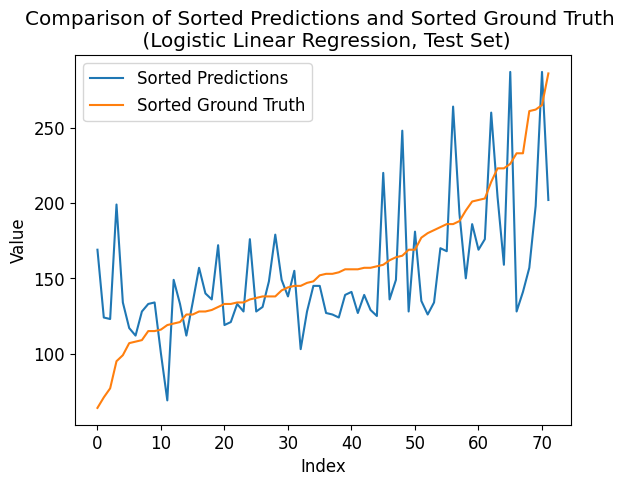

In [41]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:") # y_test doesn't include all classes, so confusion matrix is less than num_class by num_class
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)


# Sort y_pred and y_test based on y_test
plot_comparison(y_test, y_pred, 'Logistic Linear Regression, Test Set')

Accuracy: 0.21783625730994152
Mean squared error: 1015.0752923976609
Correlation coefficient: 0.7500287860383303
Coefficient of determination (R-squared score, R2 score): 0.5282096568841331


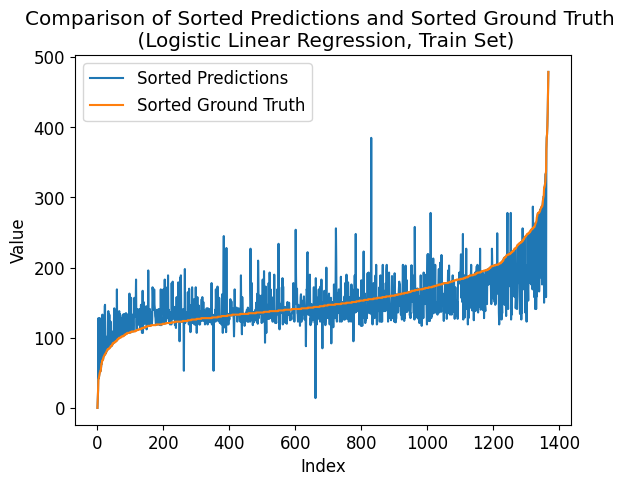

In [42]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Logistic Linear Regression, Train Set')

##### Evaluate (reduced)

The model is based on classifying data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results a smaller number of classes (e.g., reduced_class_num = 16), that is, for the example of class_num = 160 and reduced_class_num = 16, classes 0, 1, ..., 15 become one class, i.e., 0; ...; classes 144, 145, ..., 159 become one class, i.e., 15.

In [43]:
print("---- ---- ----")
# Define the boundaries for digitization
reduced_class_num = 16
intervals = np.arange(0, class_num + 1, class_num / reduced_class_num)
print(intervals)

y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
[126 179 287 157 148 204 134 202 193 260 129 248 124 125 112 123 134 176
 176 141 150 198 131 127 140 139 155 138 133 128 124 103 186 128 157 100
 287 127 145 121 119 172 128 128 133 128 220 159 128 136 199 126 134 181
 139 169 135 112 264 117 134 149 136  69 168 149 169 170 149 133 145 141]
[4 5 9 5 4 6 4 6 6 8 4 8 4 4 3 4 4 5 5 4 5 6 4 4 4 4 5 4 4 4 4 3 6 4 5 3 9
 4 4 4 3 5 4 4 4 4 7 5 4 4 6 4 4 6 4 5 4 3 8 3 4 4 4 2 5 4 5 5 4 4 4 4]
Mean squared error: 1.875
Correlation coefficient: 0.5468048167428698
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
Mean squared error: 1.2236842105263157
Correlation coefficient: 0.7345560276065263
Coefficient of determination (R-squared score, R2 score): 0.5047636101060549


Fixing the reduced class number, I enumerate the original class number to see what a original class number is better.

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
---- ---- ----
class_num = 16
Number of unique elements: 16


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.5896878772177774
Coefficient of determination (R-squared score, R2 score): 0.2806880375293198
train eval:
Mean squared error: 1.5789473684210527
Correlation coefficient: 0.6263932881013808
Coefficient of determination (R-squared score, R2 score): 0.36098530336265144


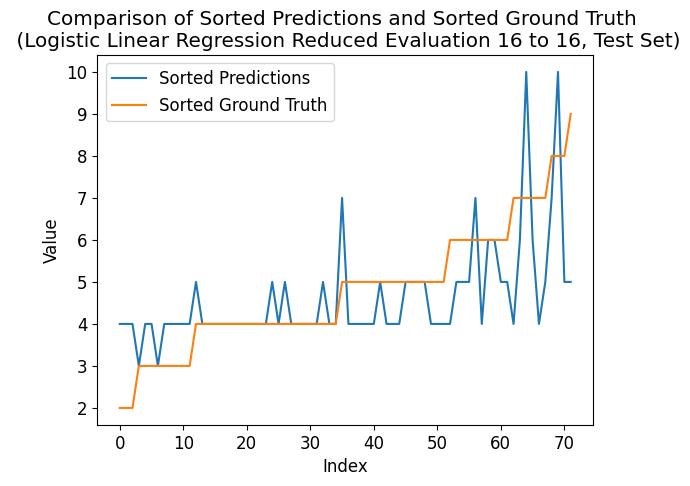

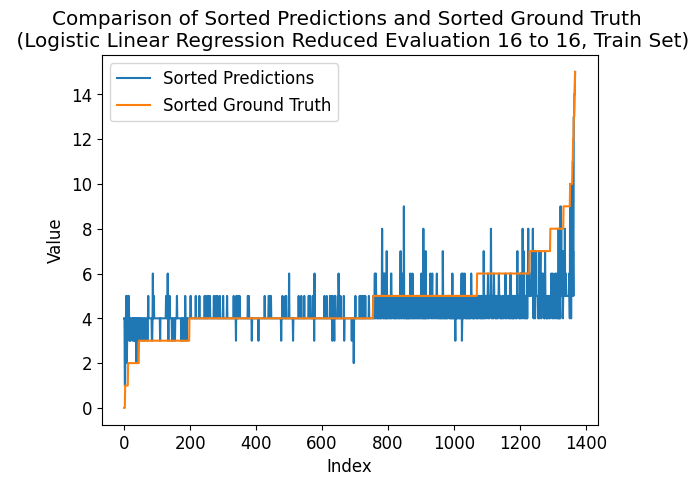

---- ---- ----
class_num = 32
Number of unique elements: 29


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24. 26. 28. 30. 32.]
test eval:
Mean squared error: 1.5
Correlation coefficient: 0.6234090980988731
Coefficient of determination (R-squared score, R2 score): 0.3244722439405786
train eval:
Mean squared error: 1.5584795321637428
Correlation coefficient: 0.6370584515852191
Coefficient of determination (R-squared score, R2 score): 0.3692688272079504


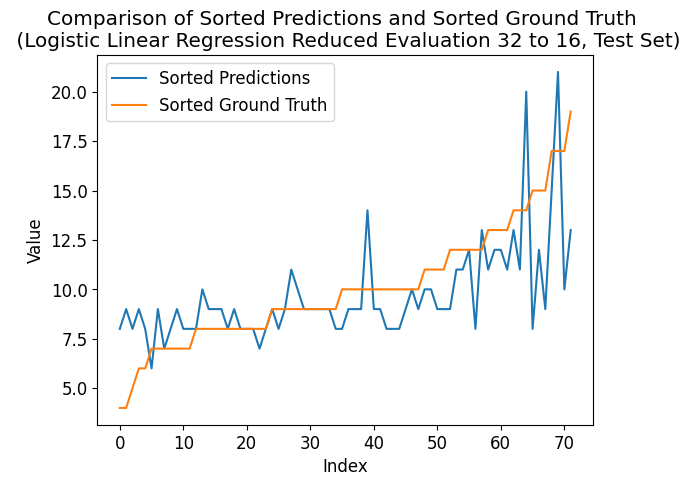

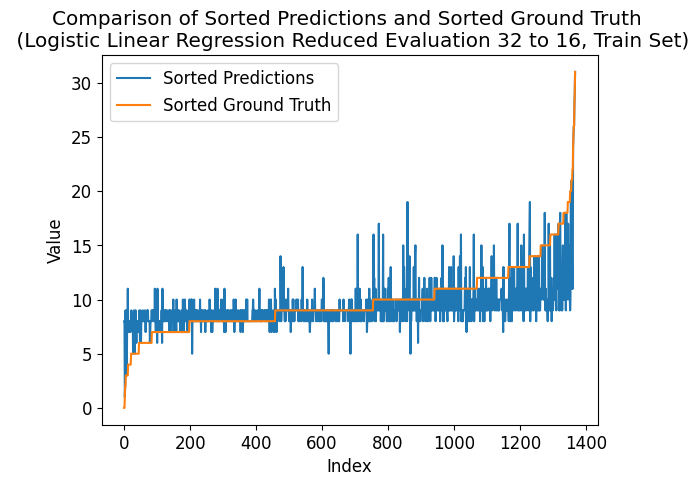

---- ---- ----
class_num = 48
Number of unique elements: 40


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[ 0.  3.  6.  9. 12. 15. 18. 21. 24. 27. 30. 33. 36. 39. 42. 45. 48.]
test eval:
Mean squared error: 1.6111111111111112
Correlation coefficient: 0.6503878772777116
Coefficient of determination (R-squared score, R2 score): 0.27443315089914
train eval:
Mean squared error: 1.5847953216374269
Correlation coefficient: 0.6304658681265182
Coefficient of determination (R-squared score, R2 score): 0.35861858226399457


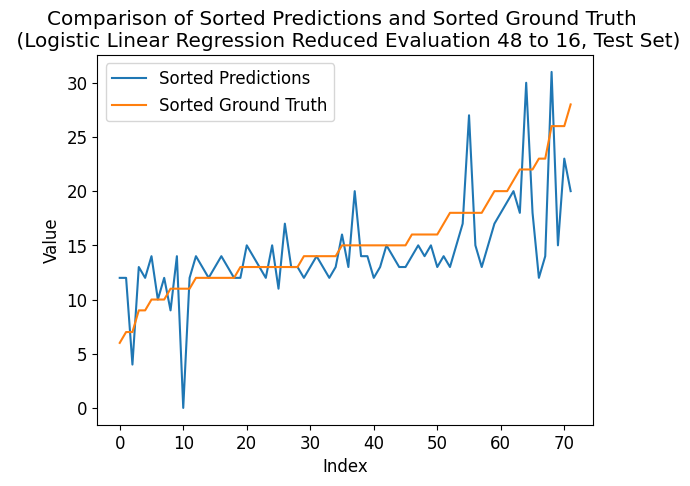

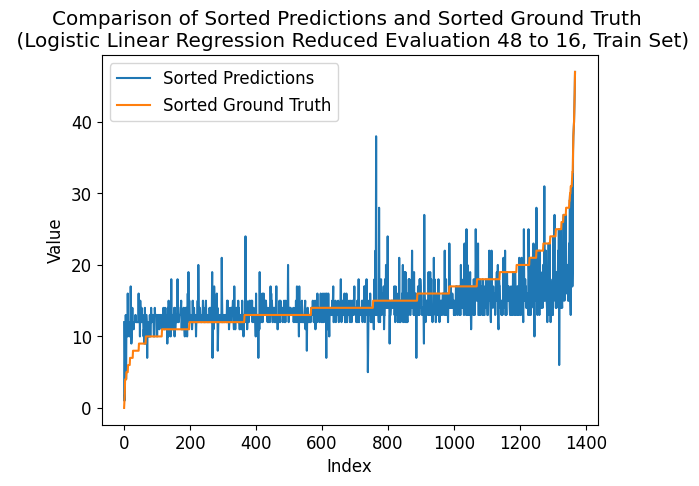

---- ---- ----
class_num = 64
Number of unique elements: 51


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[ 0.  4.  8. 12. 16. 20. 24. 28. 32. 36. 40. 44. 48. 52. 56. 60. 64.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5722581593776698
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 1.5190058479532165
Correlation coefficient: 0.6520069111926226
Coefficient of determination (R-squared score, R2 score): 0.38524419462388404


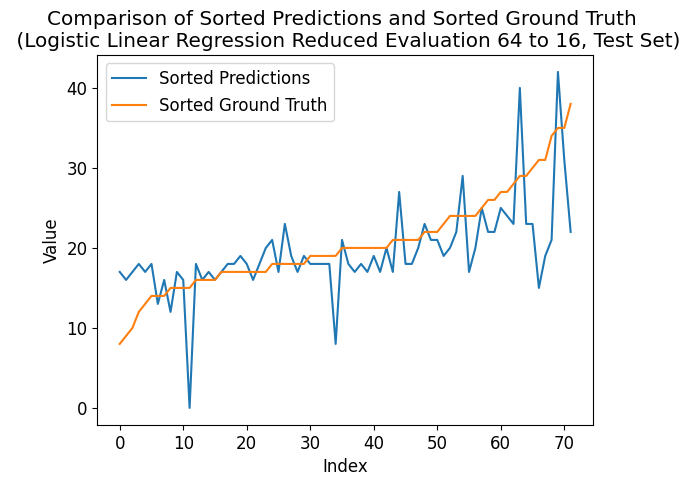

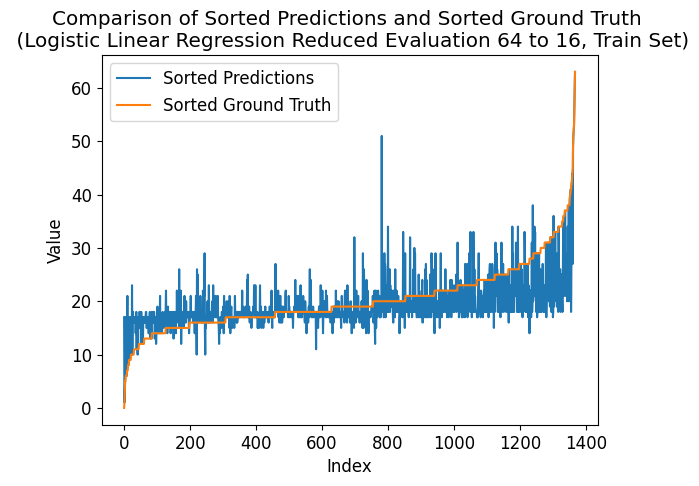

---- ---- ----
class_num = 80
Number of unique elements: 59
[ 0.  5. 10. 15. 20. 25. 30. 35. 40. 45. 50. 55. 60. 65. 70. 75. 80.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.600030158915722
Coefficient of determination (R-squared score, R2 score): 0.26192337763878026
train eval:
Mean squared error: 1.5358187134502923
Correlation coefficient: 0.6511983543912039
Coefficient of determination (R-squared score, R2 score): 0.3784398714652456


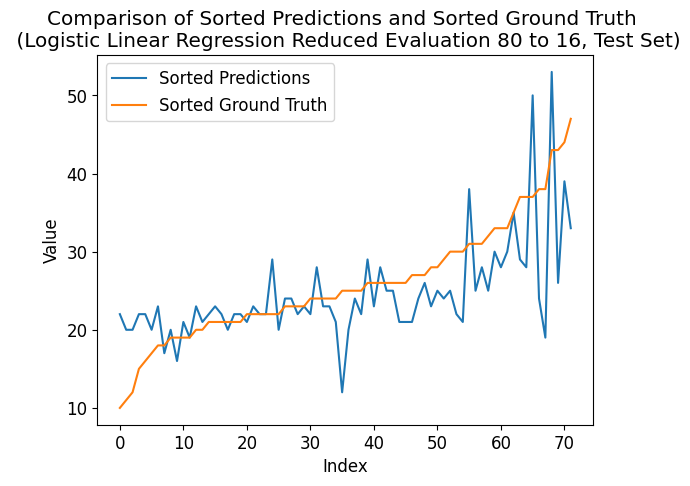

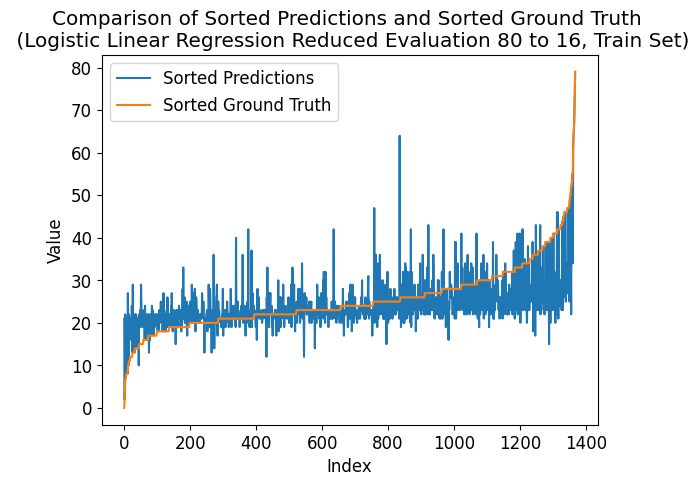

---- ---- ----
class_num = 96
Number of unique elements: 68
[ 0.  6. 12. 18. 24. 30. 36. 42. 48. 54. 60. 66. 72. 78. 84. 90. 96.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.5895478814779679
Coefficient of determination (R-squared score, R2 score): 0.24315871774824083
train eval:
Mean squared error: 1.4722222222222223
Correlation coefficient: 0.6640556646644822
Coefficient of determination (R-squared score, R2 score): 0.40417796341313883


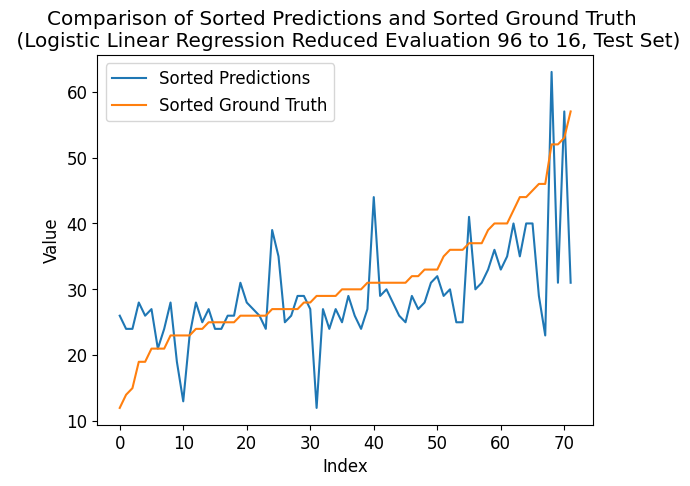

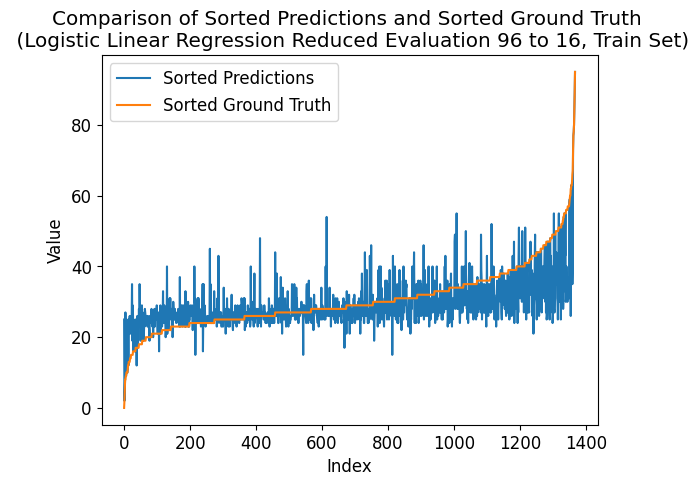

---- ---- ----
class_num = 112
Number of unique elements: 76
[  0.   7.  14.  21.  28.  35.  42.  49.  56.  63.  70.  77.  84.  91.
  98. 105. 112.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.537718990305799
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
train eval:
Mean squared error: 1.529970760233918
Correlation coefficient: 0.6525002477431502
Coefficient of determination (R-squared score, R2 score): 0.3808065925639025


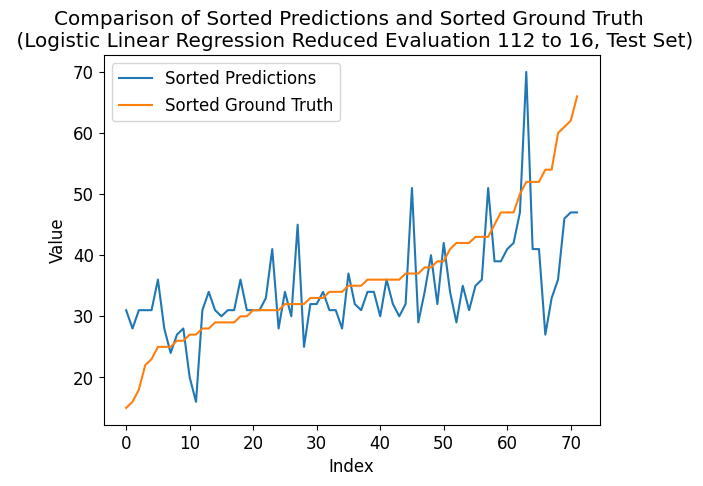

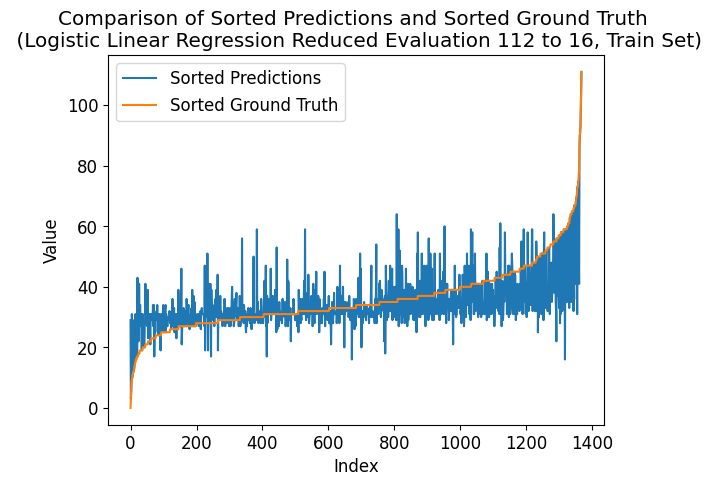

---- ---- ----
class_num = 128
Number of unique elements: 85
[  0.   8.  16.  24.  32.  40.  48.  56.  64.  72.  80.  88.  96. 104.
 112. 120. 128.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.5511433935609065
Coefficient of determination (R-squared score, R2 score): 0.19311962470680222
train eval:
Mean squared error: 1.5826023391812865
Correlation coefficient: 0.6426357109940063
Coefficient of determination (R-squared score, R2 score): 0.3595061026759908


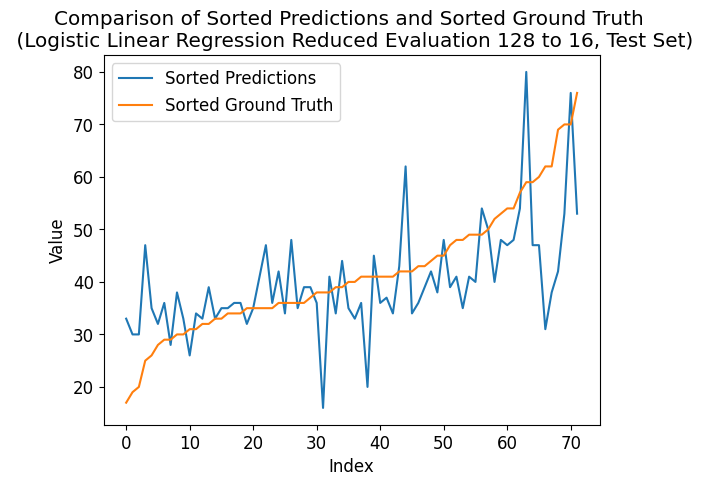

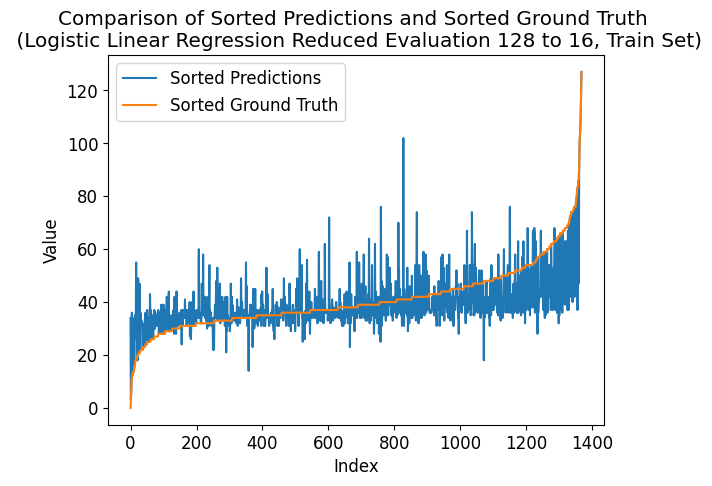

---- ---- ----
class_num = 144
Number of unique elements: 92
[  0.   9.  18.  27.  36.  45.  54.  63.  72.  81.  90.  99. 108. 117.
 126. 135. 144.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.4964274844666265
Coefficient of determination (R-squared score, R2 score): 0.1430805316653636
train eval:
Mean squared error: 1.534356725146199
Correlation coefficient: 0.6524840963132436
Coefficient of determination (R-squared score, R2 score): 0.3790315517399099


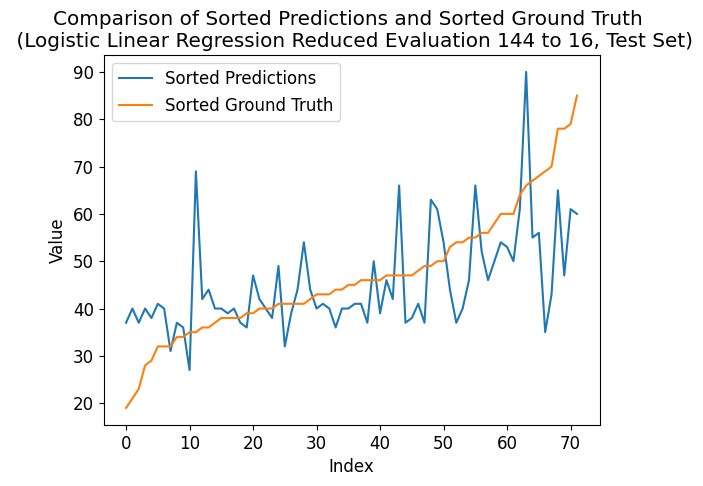

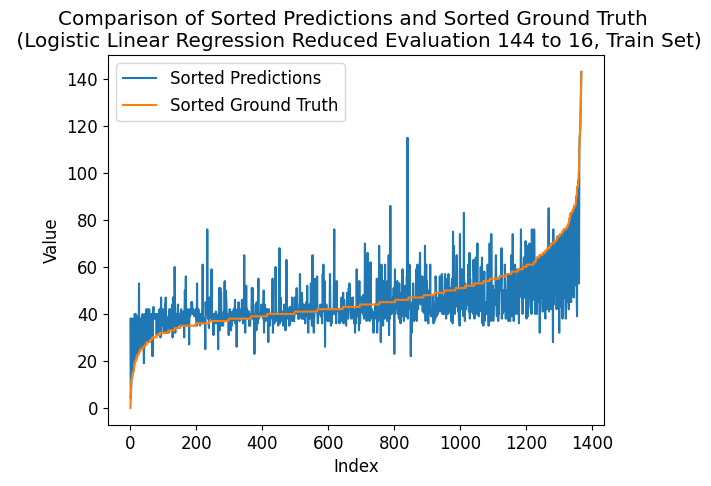

---- ---- ----
class_num = 160
Number of unique elements: 101
[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.5571290204335354
Coefficient of determination (R-squared score, R2 score): 0.13682564503518369
train eval:
Mean squared error: 1.4663742690058479
Correlation coefficient: 0.6777903625008472
Coefficient of determination (R-squared score, R2 score): 0.4065446845117957


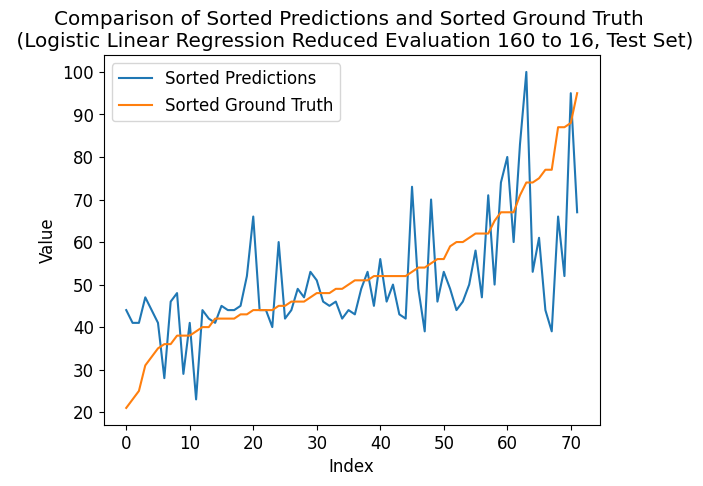

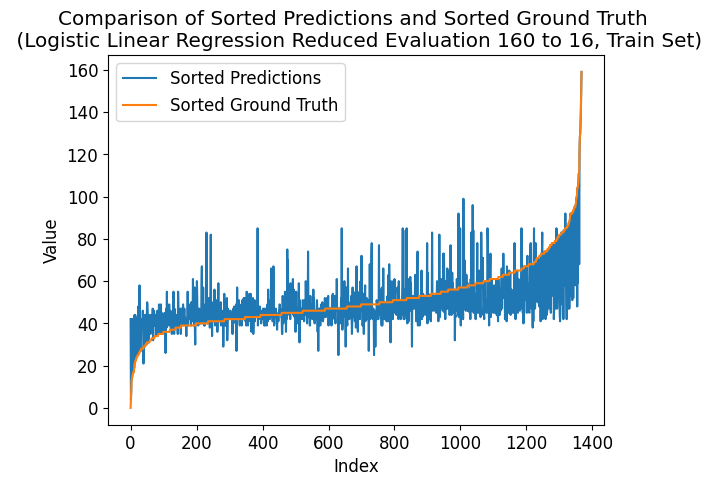

---- ---- ----
class_num = 176
Number of unique elements: 106
[  0.  11.  22.  33.  44.  55.  66.  77.  88.  99. 110. 121. 132. 143.
 154. 165. 176.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.5572149197665804
Coefficient of determination (R-squared score, R2 score): 0.16184519155590305
train eval:
Mean squared error: 1.513157894736842
Correlation coefficient: 0.6643698995438967
Coefficient of determination (R-squared score, R2 score): 0.3876109157225409


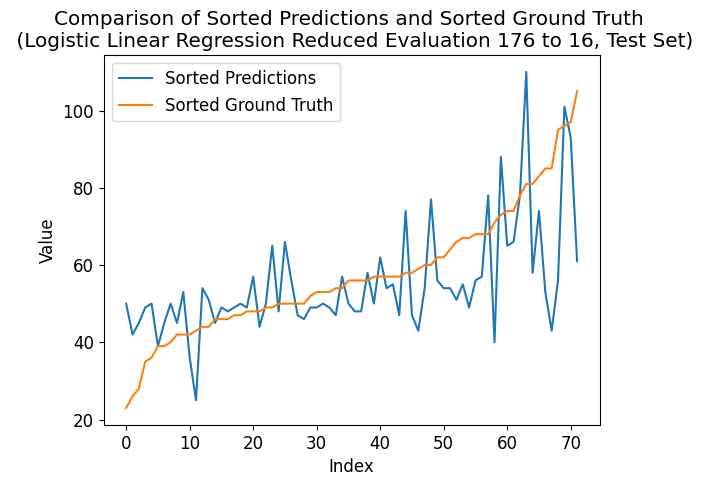

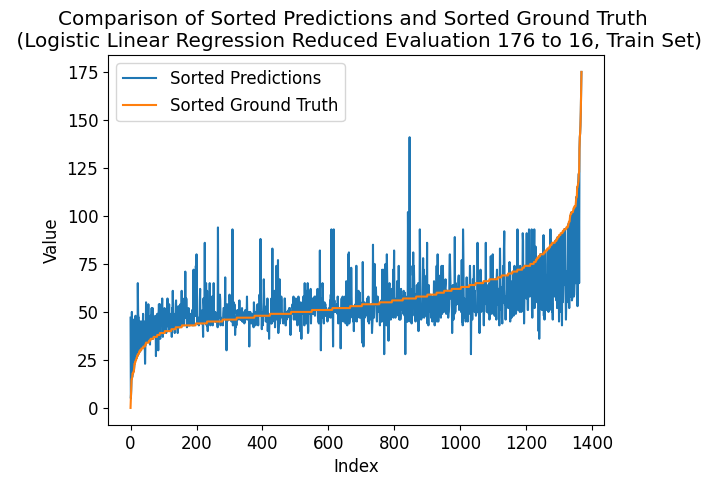

---- ---- ----
class_num = 192
Number of unique elements: 115
[  0.  12.  24.  36.  48.  60.  72.  84.  96. 108. 120. 132. 144. 156.
 168. 180. 192.]
test eval:
Mean squared error: 1.8472222222222223
Correlation coefficient: 0.5627307102231965
Coefficient of determination (R-squared score, R2 score): 0.16810007818608286
train eval:
Mean squared error: 1.4071637426900585
Correlation coefficient: 0.6868433590291952
Coefficient of determination (R-squared score, R2 score): 0.4305077356356962


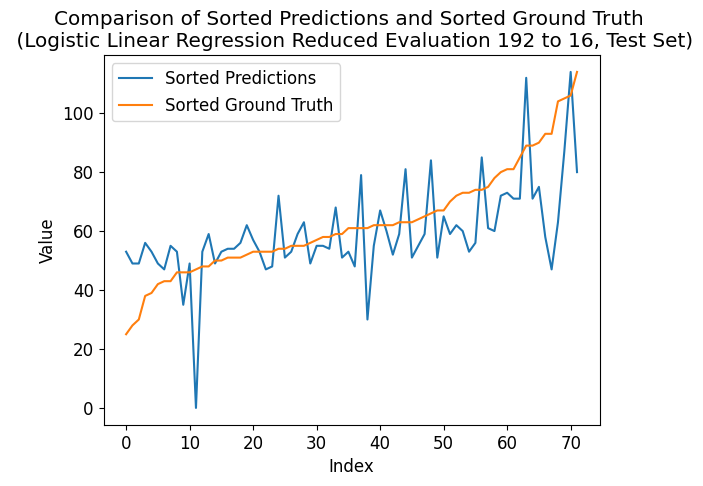

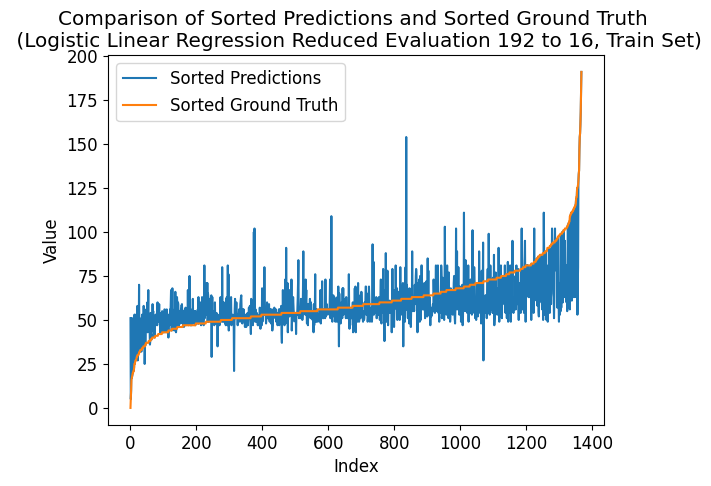

---- ---- ----
class_num = 208
Number of unique elements: 121
[  0.  13.  26.  39.  52.  65.  78.  91. 104. 117. 130. 143. 156. 169.
 182. 195. 208.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.5946949569373379
Coefficient of determination (R-squared score, R2 score): 0.19937451133698203
train eval:
Mean squared error: 1.3910818713450293
Correlation coefficient: 0.6923418920475141
Coefficient of determination (R-squared score, R2 score): 0.4370162186570026


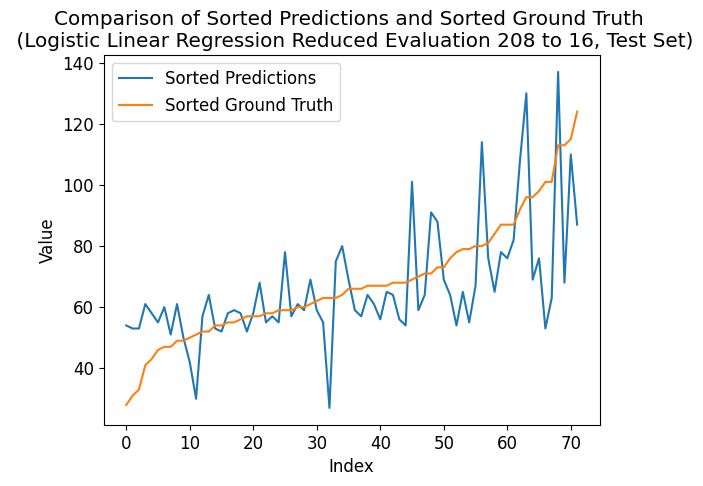

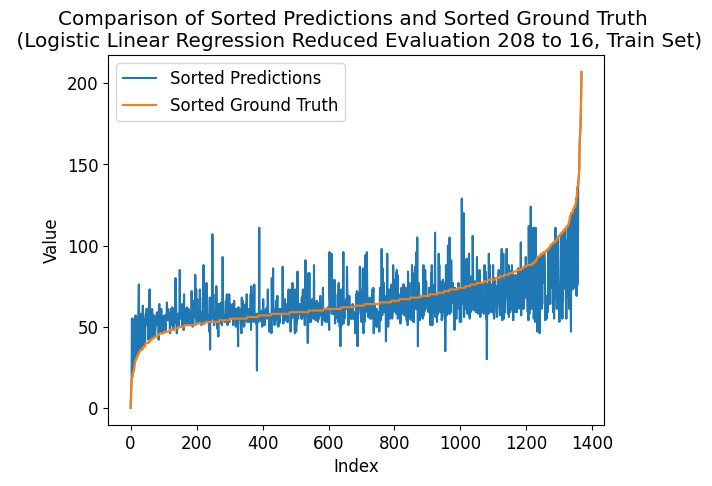

---- ---- ----
class_num = 224
Number of unique elements: 129
[  0.  14.  28.  42.  56.  70.  84.  98. 112. 126. 140. 154. 168. 182.
 196. 210. 224.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.5829599078562846
Coefficient of determination (R-squared score, R2 score): 0.26192337763878026
train eval:
Mean squared error: 1.3888888888888888
Correlation coefficient: 0.695935081875921
Coefficient of determination (R-squared score, R2 score): 0.43790373906899893


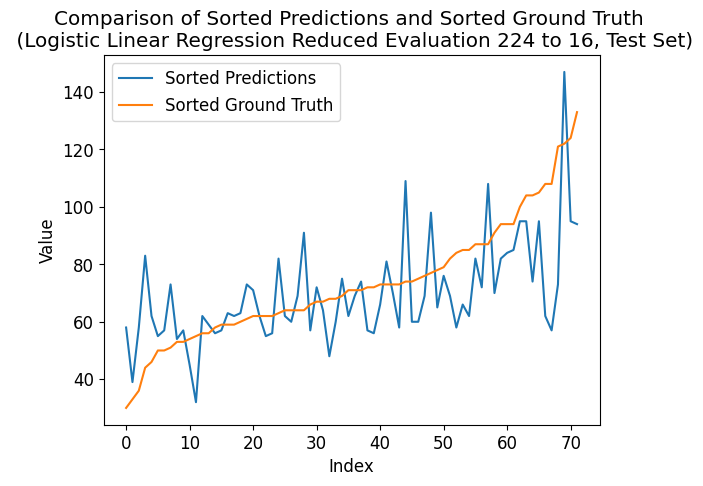

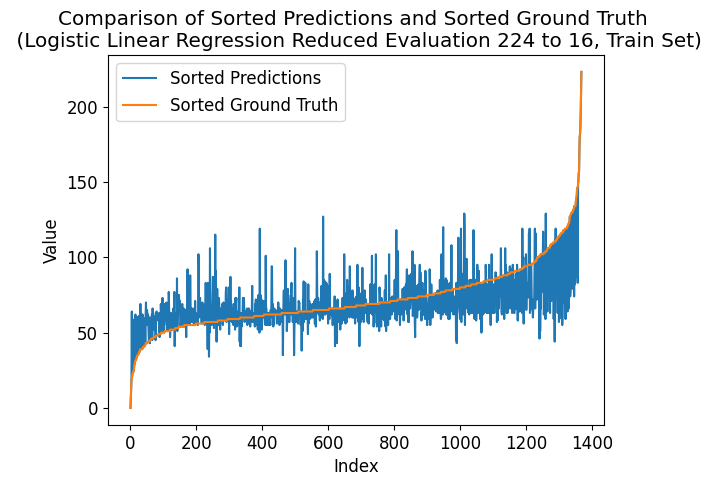

---- ---- ----
class_num = 240
Number of unique elements: 136
[  0.  15.  30.  45.  60.  75.  90. 105. 120. 135. 150. 165. 180. 195.
 210. 225. 240.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.5206768905055743
Coefficient of determination (R-squared score, R2 score): 0.13682564503518369
train eval:
Mean squared error: 1.4568713450292399
Correlation coefficient: 0.6824975225099432
Coefficient of determination (R-squared score, R2 score): 0.4103906062971131


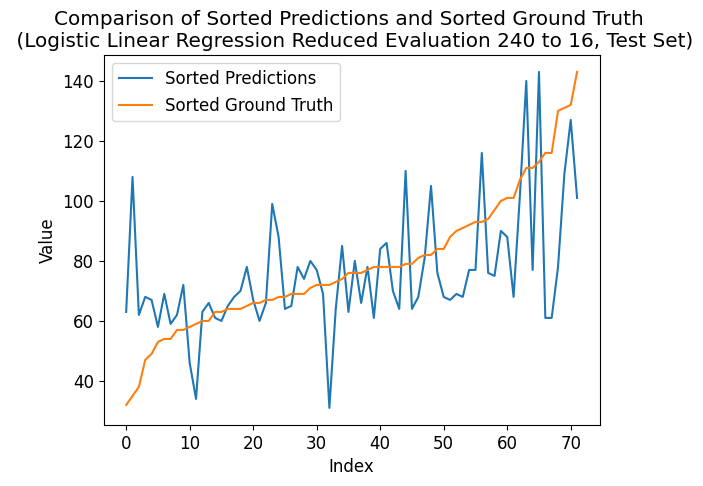

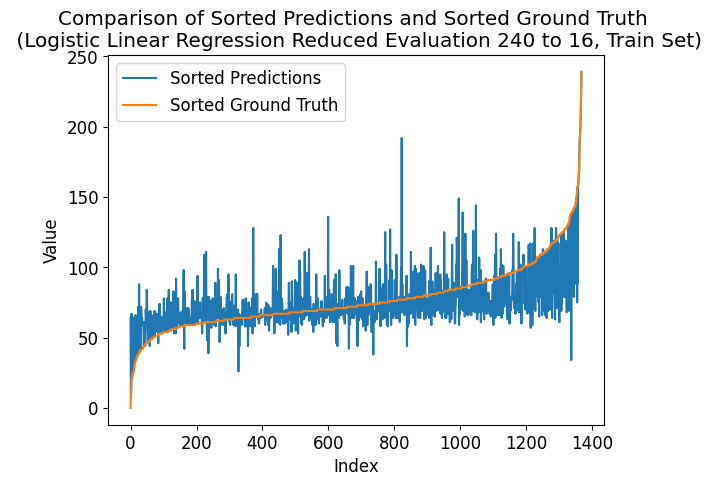

---- ---- ----
class_num = 256
Number of unique elements: 143
[  0.  16.  32.  48.  64.  80.  96. 112. 128. 144. 160. 176. 192. 208.
 224. 240. 256.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.6021994430331706
Coefficient of determination (R-squared score, R2 score): 0.2681782642689601
train eval:
Mean squared error: 1.3640350877192982
Correlation coefficient: 0.6987024781885189
Coefficient of determination (R-squared score, R2 score): 0.4479623037382905


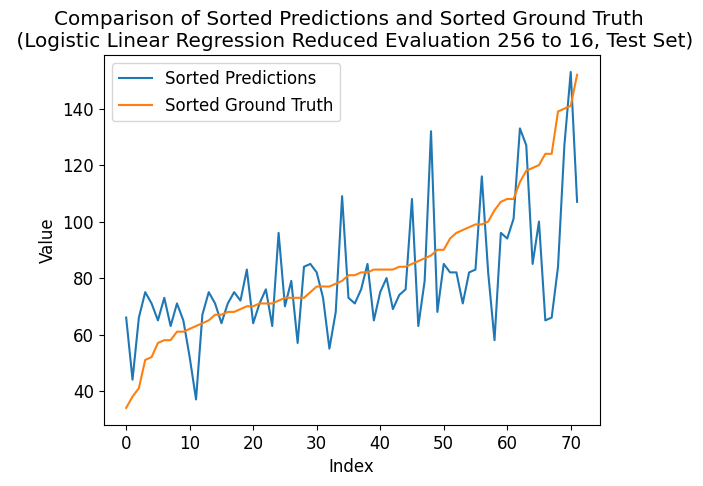

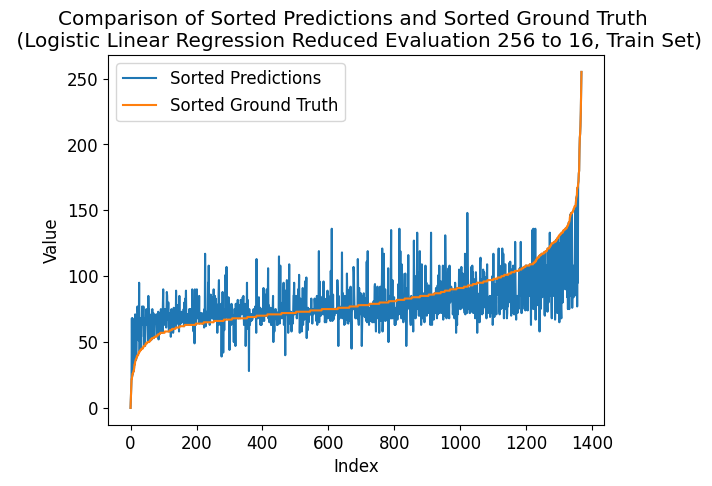

---- ---- ----
class_num = 272
Number of unique elements: 152
[  0.  17.  34.  51.  68.  85. 102. 119. 136. 153. 170. 187. 204. 221.
 238. 255. 272.]
test eval:
Mean squared error: 1.4166666666666667
Correlation coefficient: 0.646514598931986
Coefficient of determination (R-squared score, R2 score): 0.3620015637216576
train eval:
Mean squared error: 1.3764619883040936
Correlation coefficient: 0.6984975543671865
Coefficient of determination (R-squared score, R2 score): 0.44293302140364466


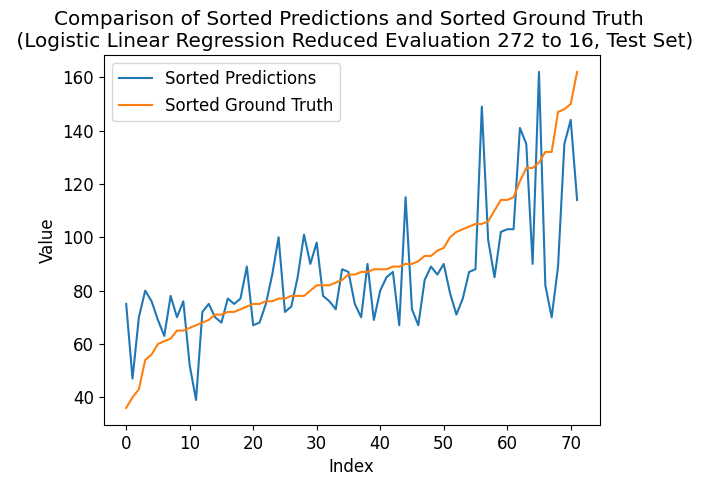

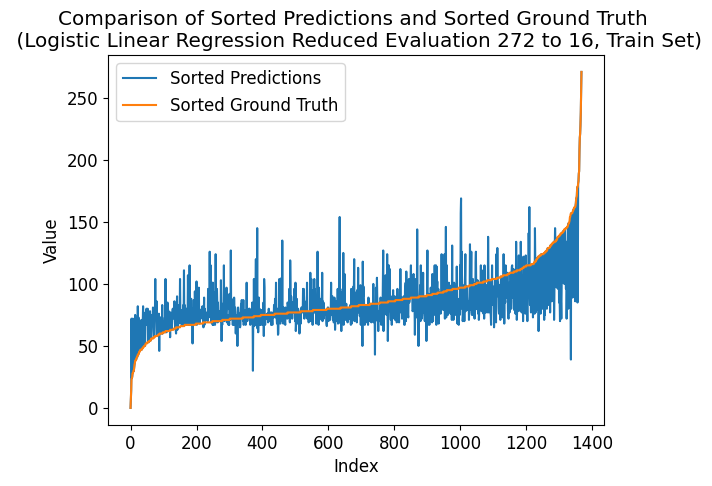

---- ---- ----
class_num = 288
Number of unique elements: 158
[  0.  18.  36.  54.  72.  90. 108. 126. 144. 162. 180. 198. 216. 234.
 252. 270. 288.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.507475577209041
Coefficient of determination (R-squared score, R2 score): 0.13057075840500387
train eval:
Mean squared error: 1.2755847953216375
Correlation coefficient: 0.719652885399707
Coefficient of determination (R-squared score, R2 score): 0.4837589603554753


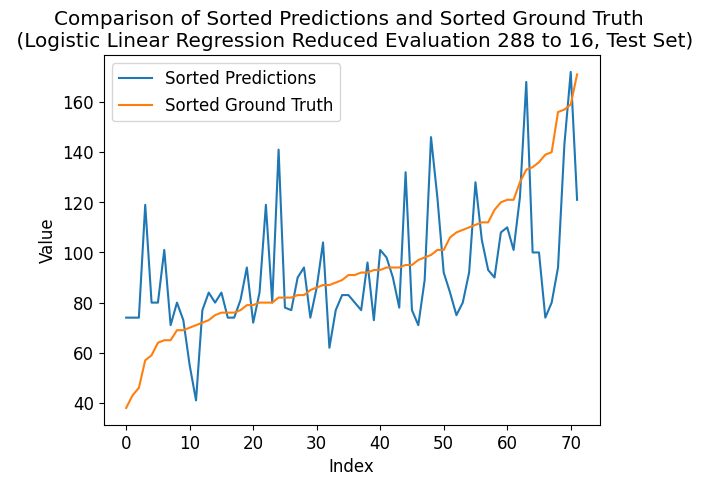

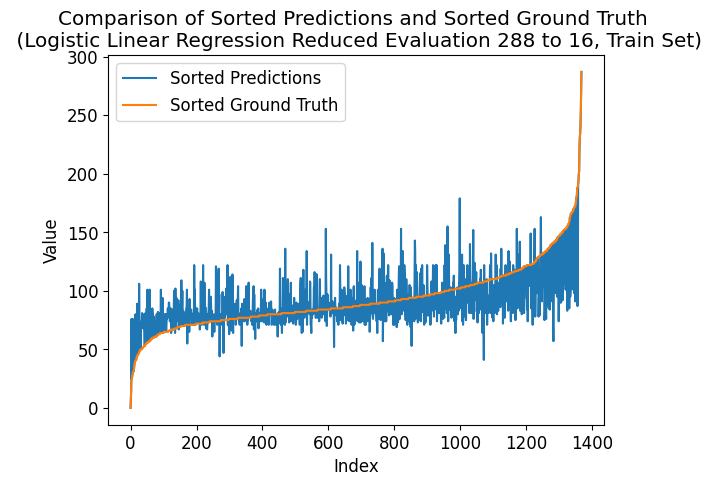

---- ---- ----
class_num = 304
Number of unique elements: 164
[  0.  19.  38.  57.  76.  95. 114. 133. 152. 171. 190. 209. 228. 247.
 266. 285. 304.]
test eval:
Mean squared error: 1.4861111111111112
Correlation coefficient: 0.6191188667336311
Coefficient of determination (R-squared score, R2 score): 0.3307271305707584
train eval:
Mean squared error: 1.3099415204678362
Correlation coefficient: 0.716413266807114
Coefficient of determination (R-squared score, R2 score): 0.4698544739008663


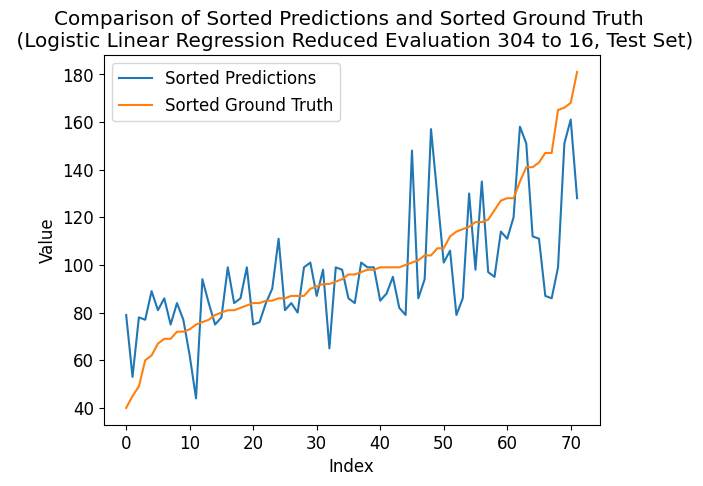

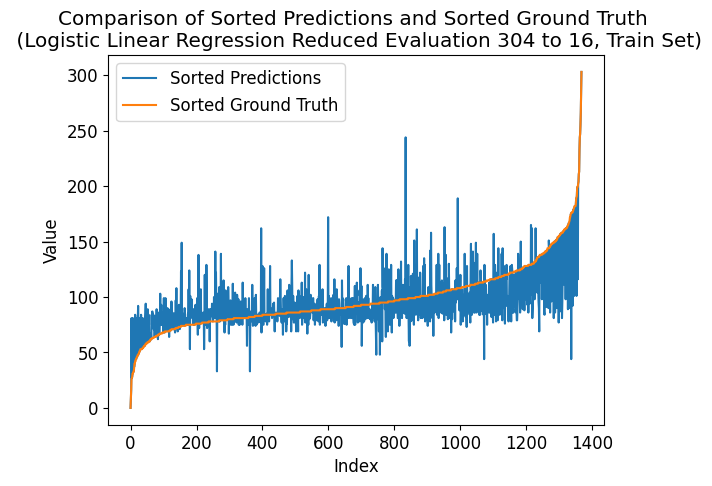

---- ---- ----
class_num = 320
Number of unique elements: 173
[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240. 260.
 280. 300. 320.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.5606232774326936
Coefficient of determination (R-squared score, R2 score): 0.22439405785770128
train eval:
Mean squared error: 1.3545321637426901
Correlation coefficient: 0.7106125331070812
Coefficient of determination (R-squared score, R2 score): 0.4518082255236079


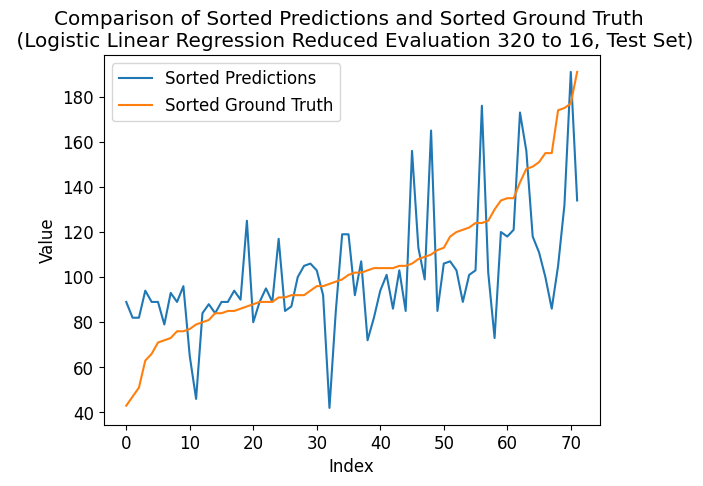

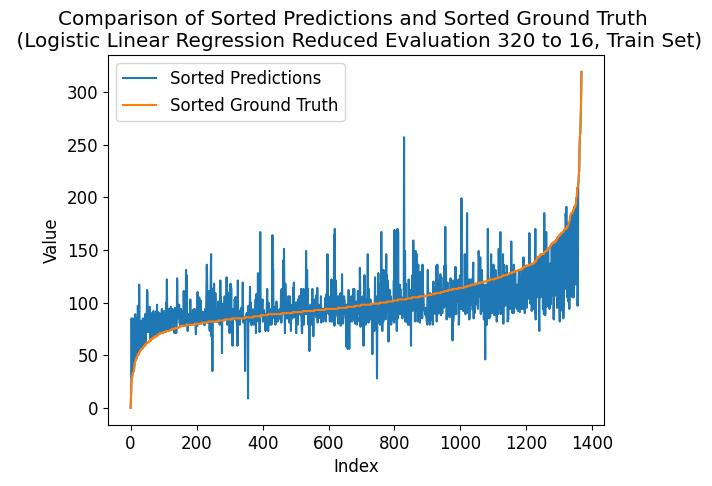

---- ---- ----
class_num = 336
Number of unique elements: 177
[  0.  21.  42.  63.  84. 105. 126. 147. 168. 189. 210. 231. 252. 273.
 294. 315. 336.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.5222123634056389
Coefficient of determination (R-squared score, R2 score): 0.13057075840500387
train eval:
Mean squared error: 1.3099415204678362
Correlation coefficient: 0.7206203594933631
Coefficient of determination (R-squared score, R2 score): 0.4698544739008663


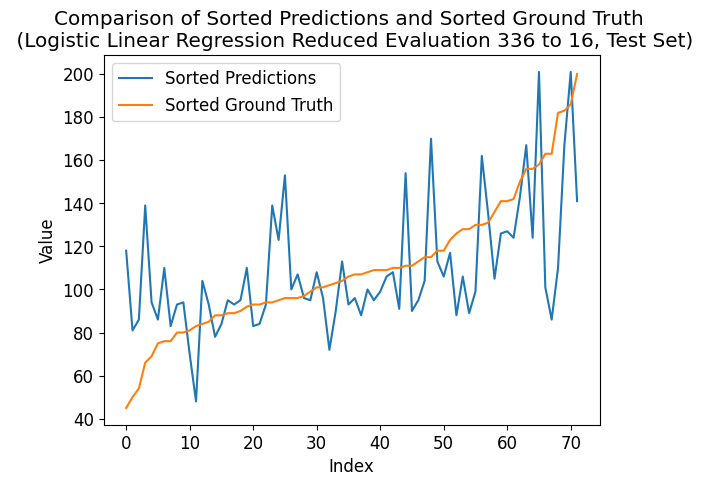

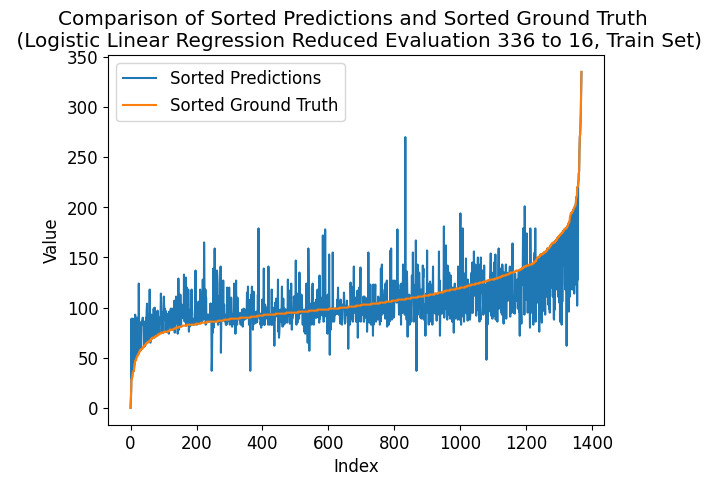

---- ---- ----
class_num = 352
Number of unique elements: 184
[  0.  22.  44.  66.  88. 110. 132. 154. 176. 198. 220. 242. 264. 286.
 308. 330. 352.]
test eval:
Mean squared error: 1.4444444444444444
Correlation coefficient: 0.6474615426519209
Coefficient of determination (R-squared score, R2 score): 0.34949179046129786
train eval:
Mean squared error: 1.2719298245614035
Correlation coefficient: 0.7280779472311245
Coefficient of determination (R-squared score, R2 score): 0.4852381610421358


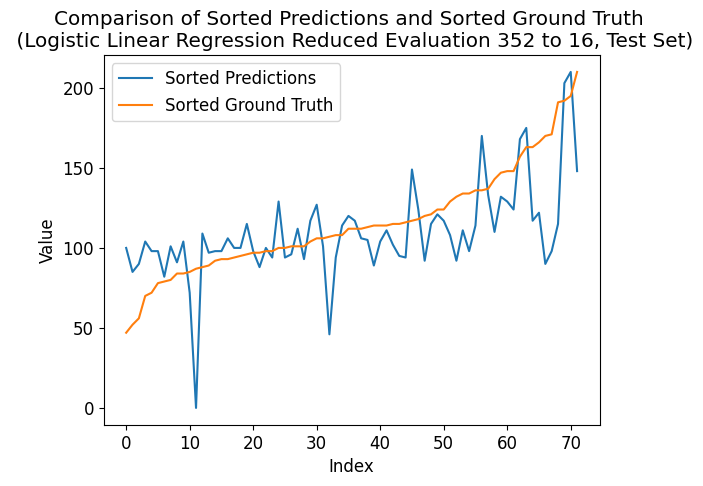

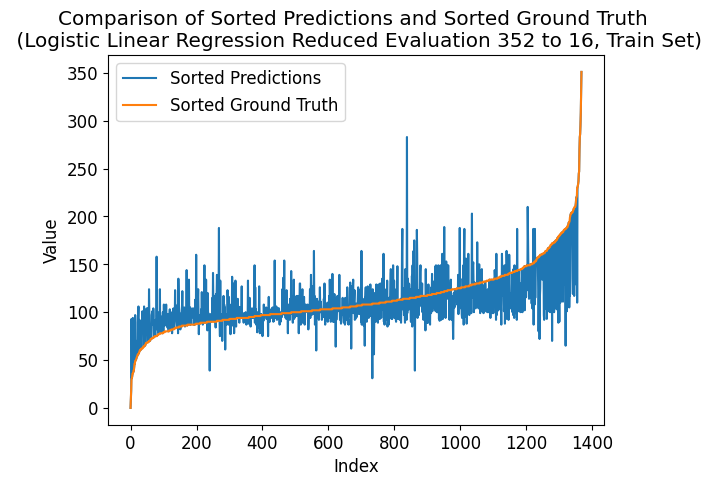

---- ---- ----
class_num = 368
Number of unique elements: 191
[  0.  23.  46.  69.  92. 115. 138. 161. 184. 207. 230. 253. 276. 299.
 322. 345. 368.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.5994807904021661
Coefficient of determination (R-squared score, R2 score): 0.24941360437842064
train eval:
Mean squared error: 1.2317251461988303
Correlation coefficient: 0.7318750988061977
Coefficient of determination (R-squared score, R2 score): 0.5015093685954017


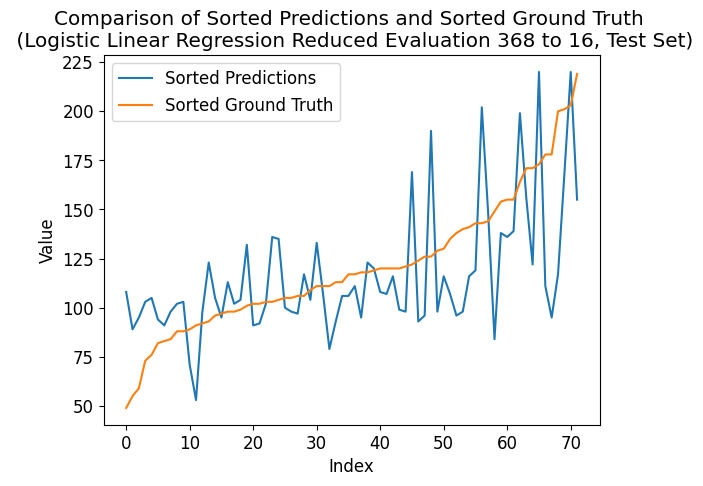

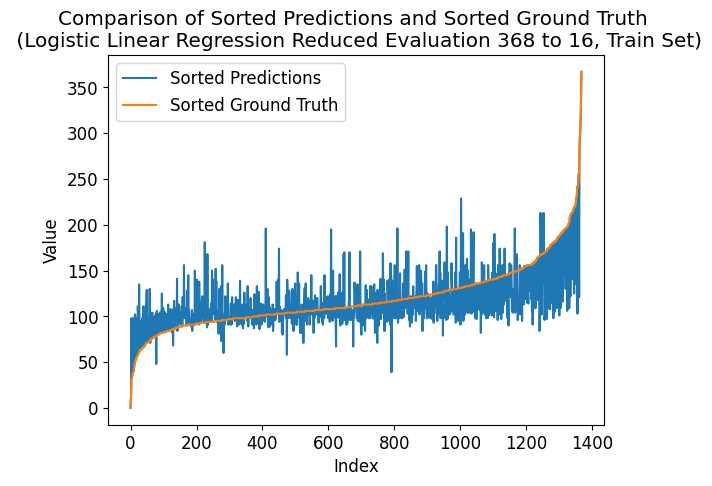

---- ---- ----
class_num = 384
Number of unique elements: 197
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240. 264. 288. 312.
 336. 360. 384.]
test eval:
Mean squared error: 2.013888888888889
Correlation coefficient: 0.49077975817633973
Coefficient of determination (R-squared score, R2 score): 0.09304143862392489
train eval:
Mean squared error: 1.2353801169590644
Correlation coefficient: 0.7359575845359666
Coefficient of determination (R-squared score, R2 score): 0.5000301679087411


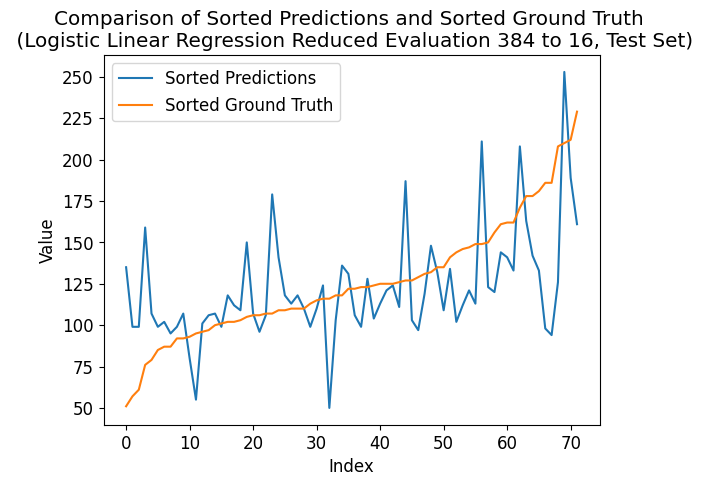

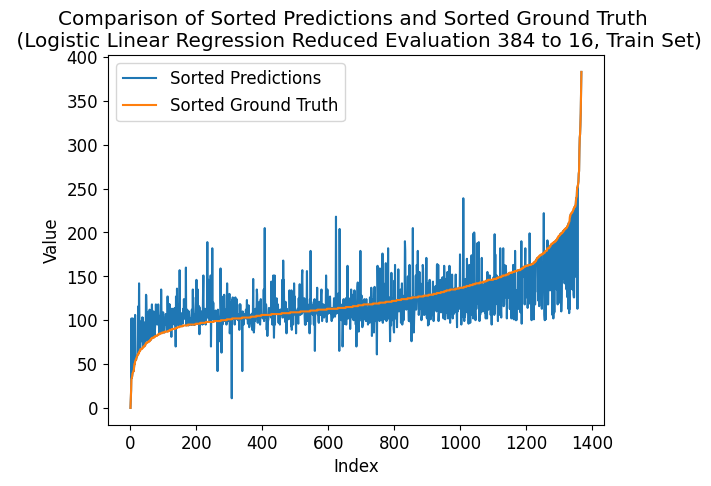

---- ---- ----
class_num = 400
Number of unique elements: 201
[  0.  25.  50.  75. 100. 125. 150. 175. 200. 225. 250. 275. 300. 325.
 350. 375. 400.]
test eval:
Mean squared error: 1.8472222222222223
Correlation coefficient: 0.5643765225428904
Coefficient of determination (R-squared score, R2 score): 0.16810007818608286
train eval:
Mean squared error: 1.2046783625730995
Correlation coefficient: 0.7386126968704086
Coefficient of determination (R-squared score, R2 score): 0.5124554536766897


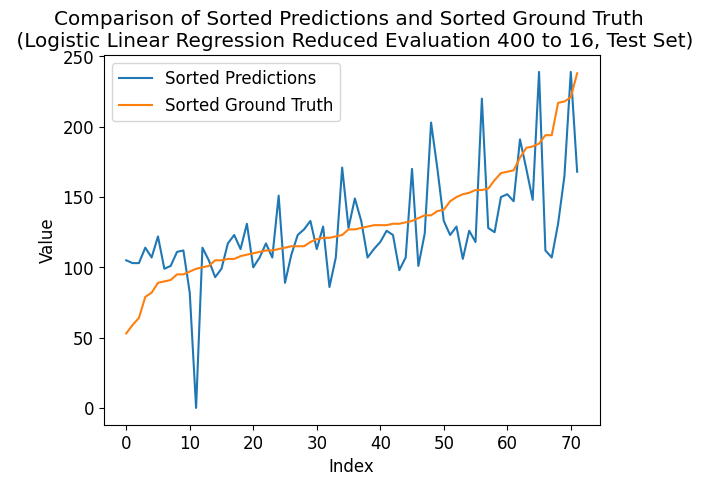

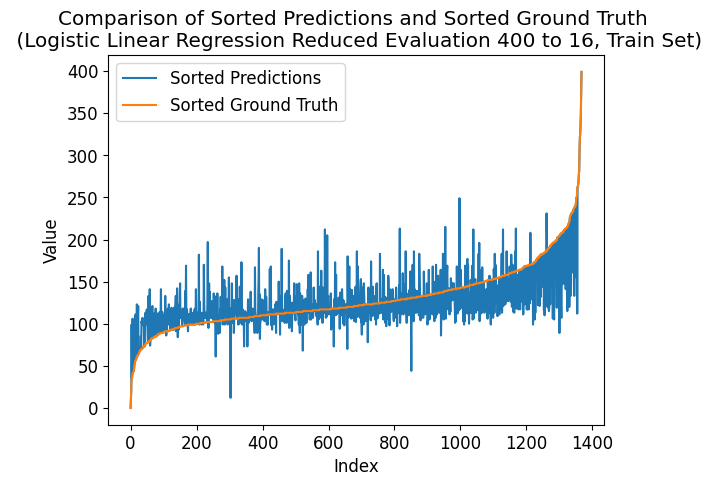

---- ---- ----
class_num = 416
Number of unique elements: 204
[  0.  26.  52.  78. 104. 130. 156. 182. 208. 234. 260. 286. 312. 338.
 364. 390. 416.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.5848724090291167
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.269736842105263
Correlation coefficient: 0.7256050649345688
Coefficient of determination (R-squared score, R2 score): 0.48612568145413215


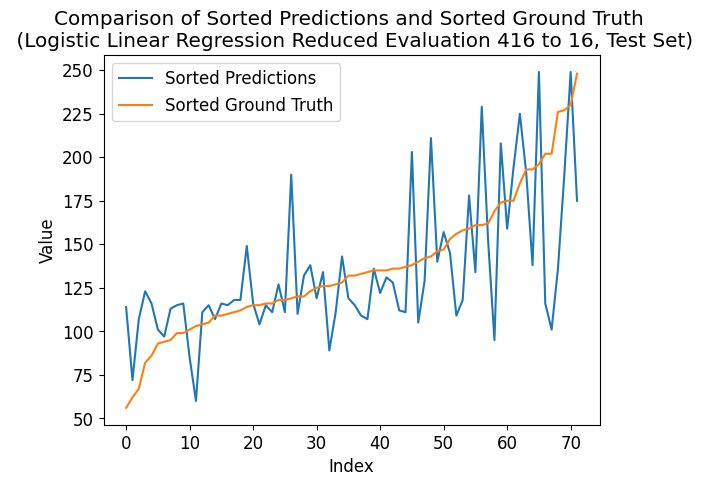

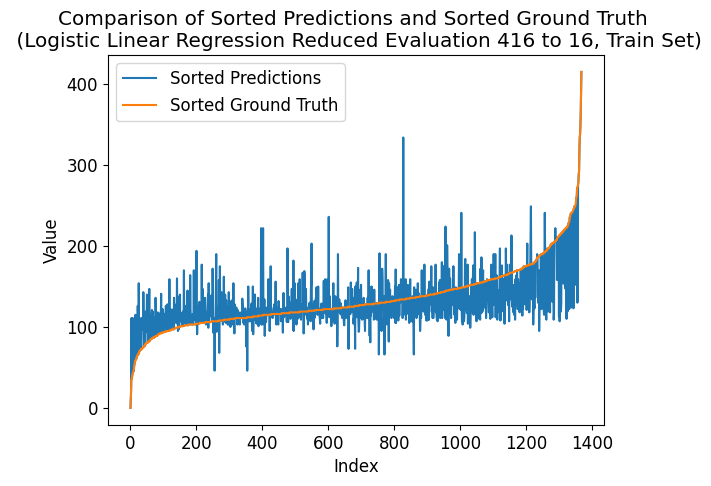

---- ---- ----
class_num = 432
Number of unique elements: 211
[  0.  27.  54.  81. 108. 135. 162. 189. 216. 243. 270. 297. 324. 351.
 378. 405. 432.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.6068630070466788
Coefficient of determination (R-squared score, R2 score): 0.23690383111806101
train eval:
Mean squared error: 1.2609649122807018
Correlation coefficient: 0.7269396462332522
Coefficient of determination (R-squared score, R2 score): 0.48967576310211747


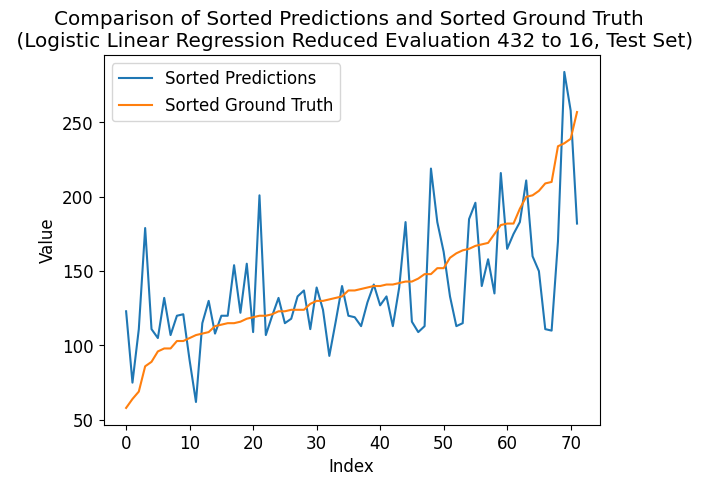

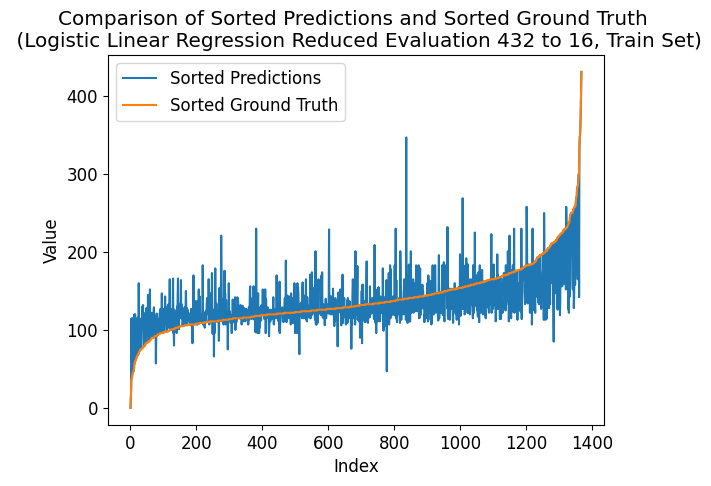

---- ---- ----
class_num = 448
Number of unique elements: 219
[  0.  28.  56.  84. 112. 140. 168. 196. 224. 252. 280. 308. 336. 364.
 392. 420. 448.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.5960607047068998
Coefficient of determination (R-squared score, R2 score): 0.22439405785770128
train eval:
Mean squared error: 1.2163742690058479
Correlation coefficient: 0.737384080721327
Coefficient of determination (R-squared score, R2 score): 0.5077220114793759


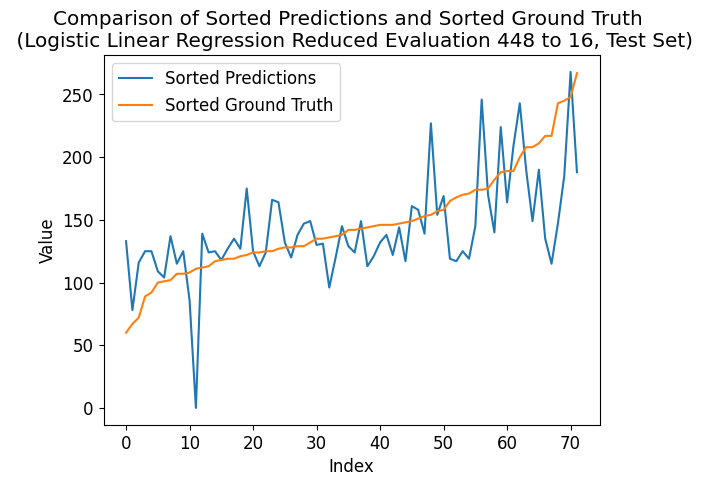

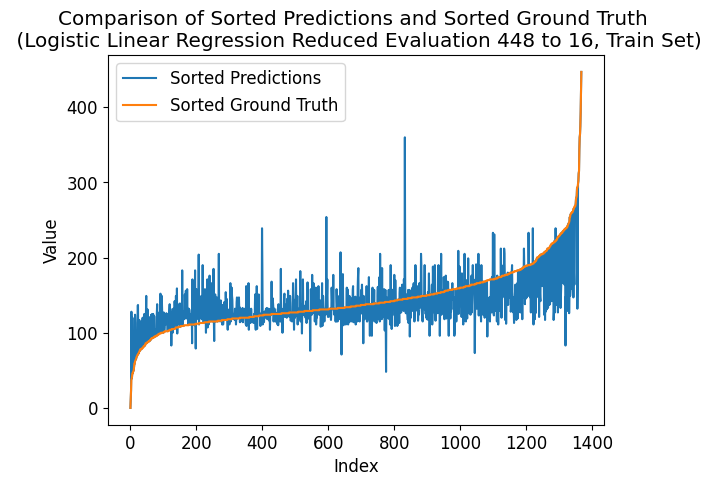

---- ---- ----
class_num = 464
Number of unique elements: 227
[  0.  29.  58.  87. 116. 145. 174. 203. 232. 261. 290. 319. 348. 377.
 406. 435. 464.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.6123232082419597
Coefficient of determination (R-squared score, R2 score): 0.29319781078967944
train eval:
Mean squared error: 1.2412280701754386
Correlation coefficient: 0.7346419505236406
Coefficient of determination (R-squared score, R2 score): 0.49766344681008434


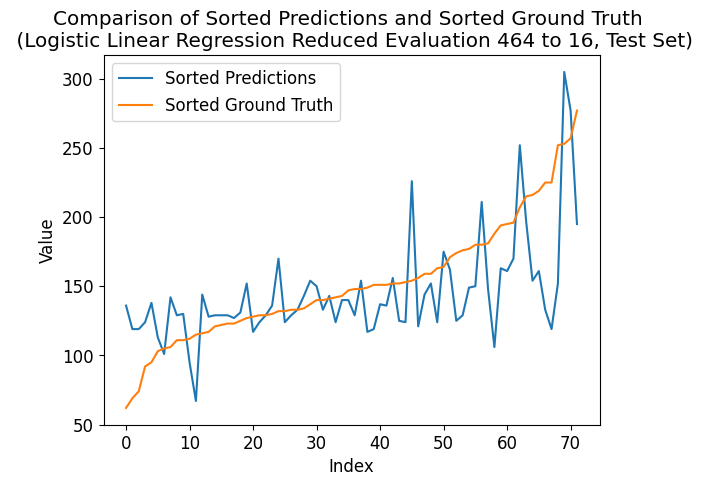

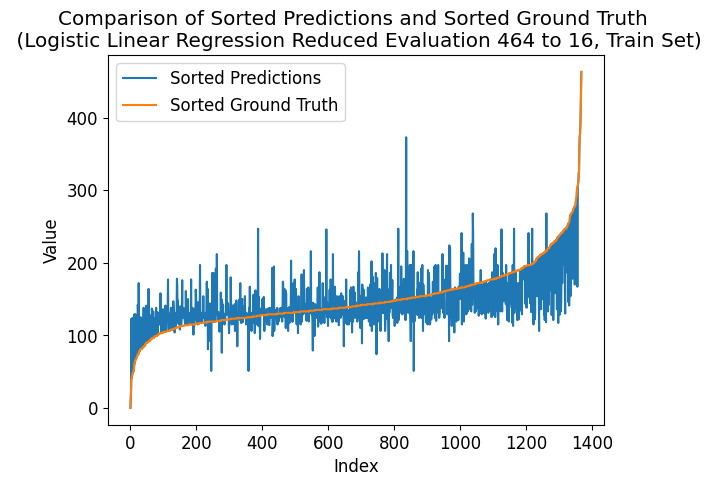

---- ---- ----
class_num = 480
Number of unique elements: 231
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.5468048167428698
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.2236842105263157
Correlation coefficient: 0.7345560276065263
Coefficient of determination (R-squared score, R2 score): 0.5047636101060549


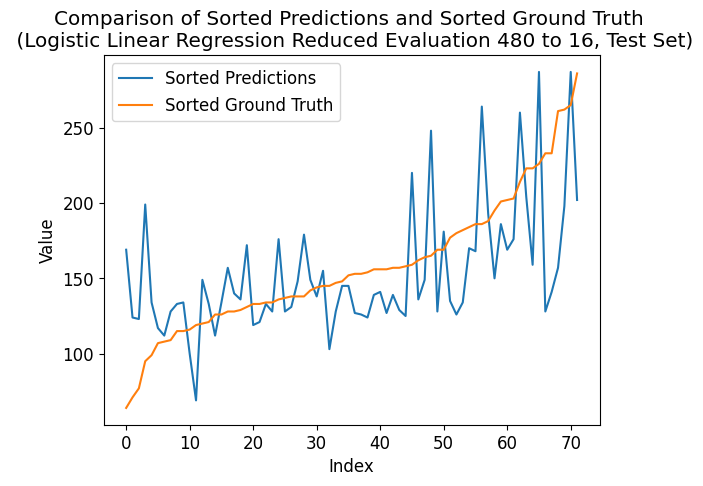

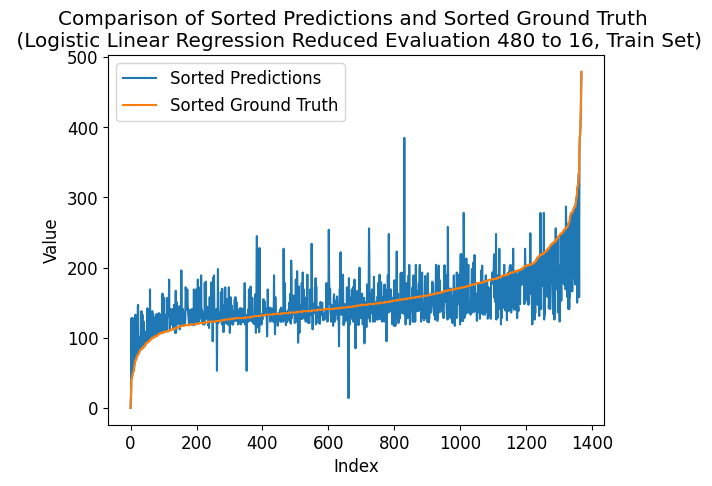

---- ---- ----
class_num = 496
Number of unique elements: 238
[  0.  31.  62.  93. 124. 155. 186. 217. 248. 279. 310. 341. 372. 403.
 434. 465. 496.]
test eval:
Mean squared error: 2.0972222222222223
Correlation coefficient: 0.5009358998090028
Coefficient of determination (R-squared score, R2 score): 0.055512118842846014
train eval:
Mean squared error: 1.1440058479532165
Correlation coefficient: 0.7555221958026961
Coefficient of determination (R-squared score, R2 score): 0.5370101850752544


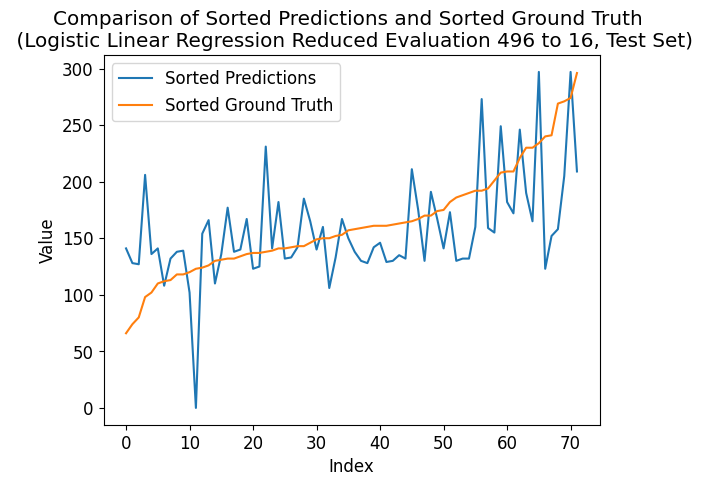

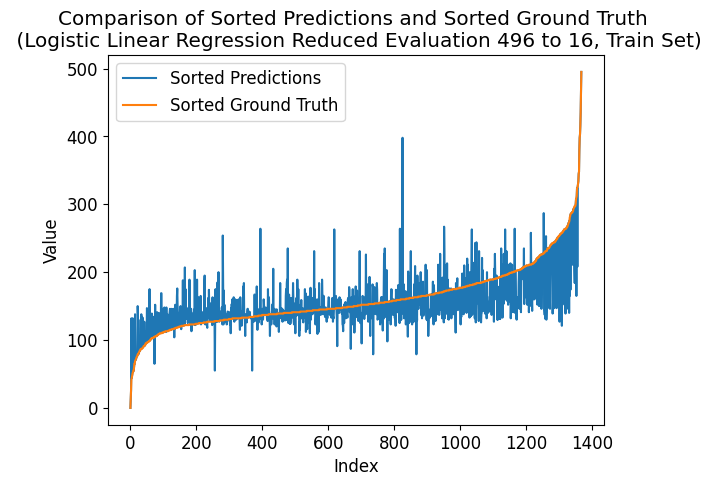

---- ---- ----
class_num = 512
Number of unique elements: 244
[  0.  32.  64.  96. 128. 160. 192. 224. 256. 288. 320. 352. 384. 416.
 448. 480. 512.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.5795923322580451
Coefficient of determination (R-squared score, R2 score): 0.21813917122752147
train eval:
Mean squared error: 1.1388888888888888
Correlation coefficient: 0.7550870168186988
Coefficient of determination (R-squared score, R2 score): 0.5390810660365791


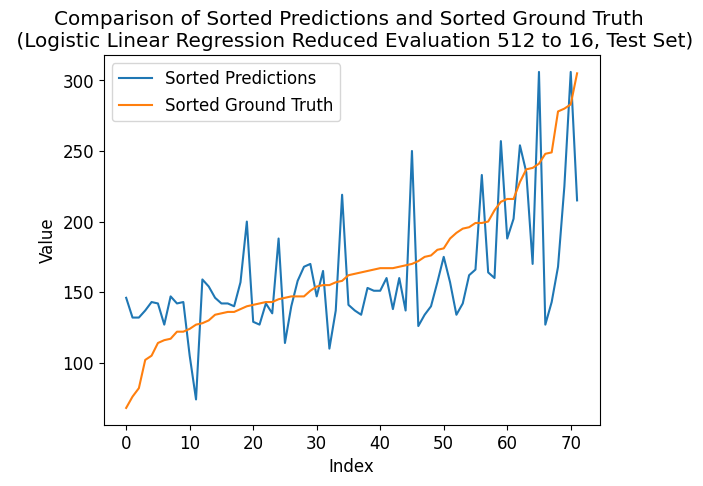

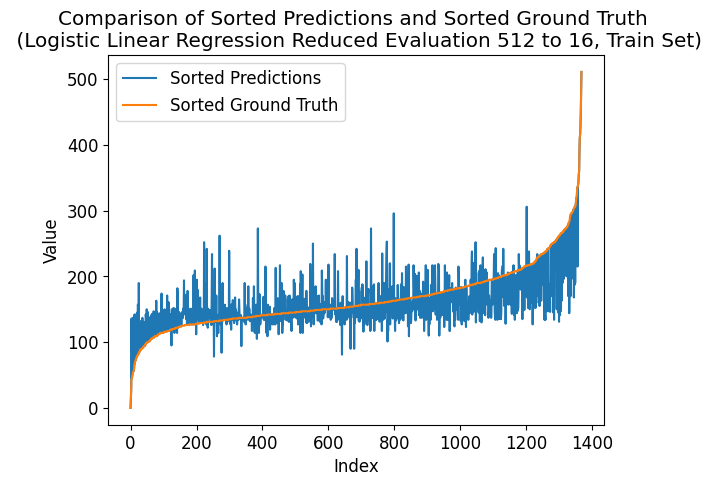

---- ---- ----
class_num = 528
Number of unique elements: 246
[  0.  33.  66.  99. 132. 165. 198. 231. 264. 297. 330. 363. 396. 429.
 462. 495. 528.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.5781791996993639
Coefficient of determination (R-squared score, R2 score): 0.23690383111806101
train eval:
Mean squared error: 1.1564327485380117
Correlation coefficient: 0.7541409520709854
Coefficient of determination (R-squared score, R2 score): 0.5319809027406086


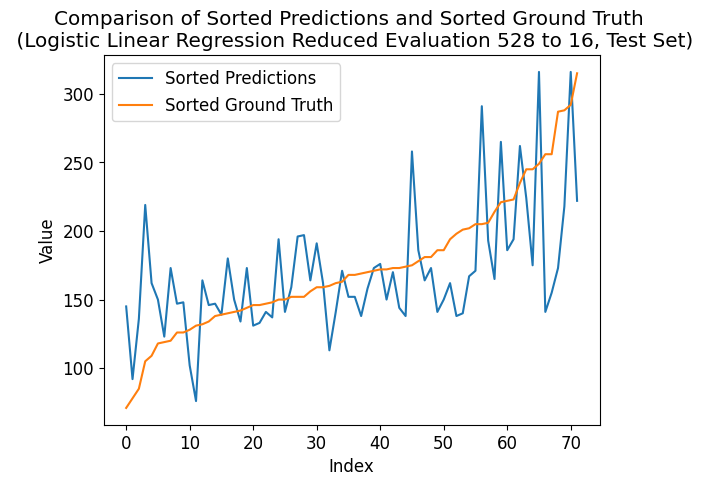

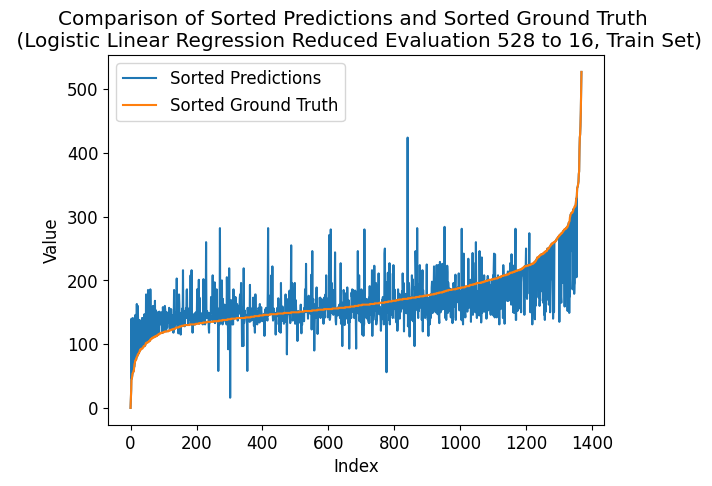

---- ---- ----
class_num = 544
Number of unique elements: 249
[  0.  34.  68. 102. 136. 170. 204. 238. 272. 306. 340. 374. 408. 442.
 476. 510. 544.]
test eval:
Mean squared error: 1.5
Correlation coefficient: 0.608224220921962
Coefficient of determination (R-squared score, R2 score): 0.3244722439405786
train eval:
Mean squared error: 1.1505847953216375
Correlation coefficient: 0.753195554607238
Coefficient of determination (R-squared score, R2 score): 0.5343476238392655


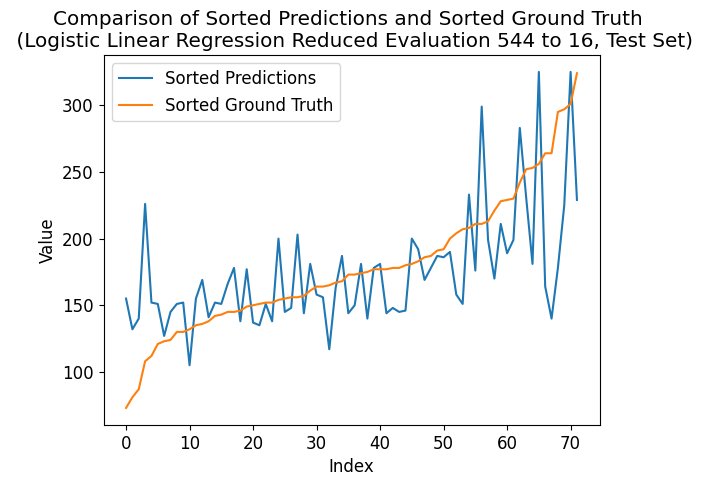

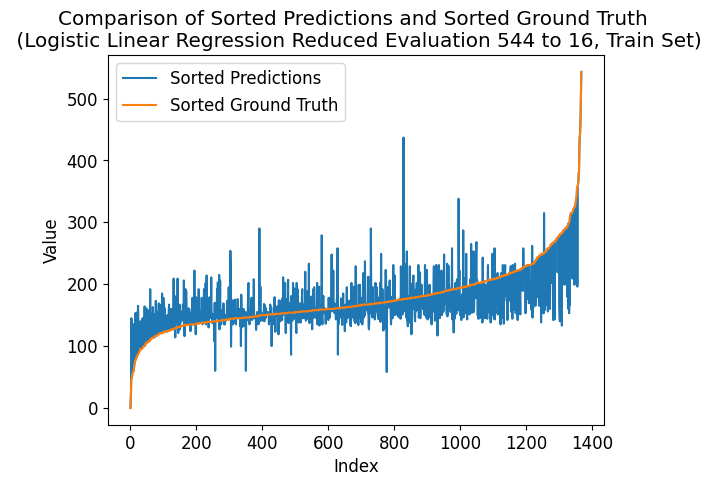

---- ---- ----
class_num = 560
Number of unique elements: 257
[  0.  35.  70. 105. 140. 175. 210. 245. 280. 315. 350. 385. 420. 455.
 490. 525. 560.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.5372327558658515
Coefficient of determination (R-squared score, R2 score): 0.12431587177482406
train eval:
Mean squared error: 1.1191520467836258
Correlation coefficient: 0.7625468138838462
Coefficient of determination (R-squared score, R2 score): 0.5470687497445459


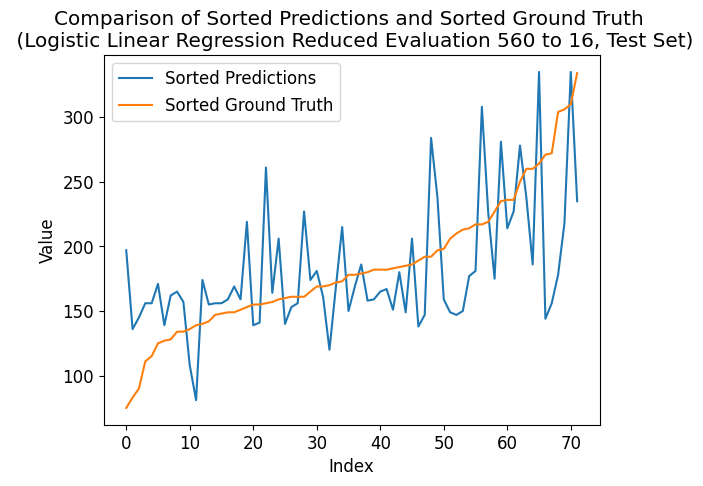

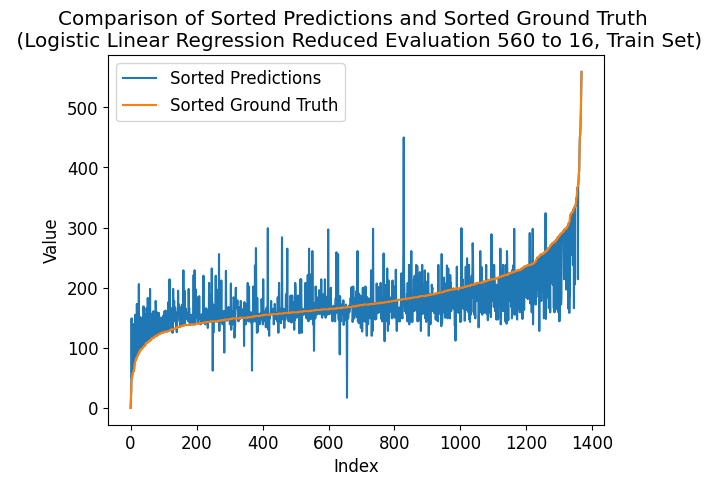

---- ---- ----
class_num = 576
Number of unique elements: 261
[  0.  36.  72. 108. 144. 180. 216. 252. 288. 324. 360. 396. 432. 468.
 504. 540. 576.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.4913072798683639
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.0964912280701755
Correlation coefficient: 0.7626217091742274
Coefficient of determination (R-squared score, R2 score): 0.5562397940018413


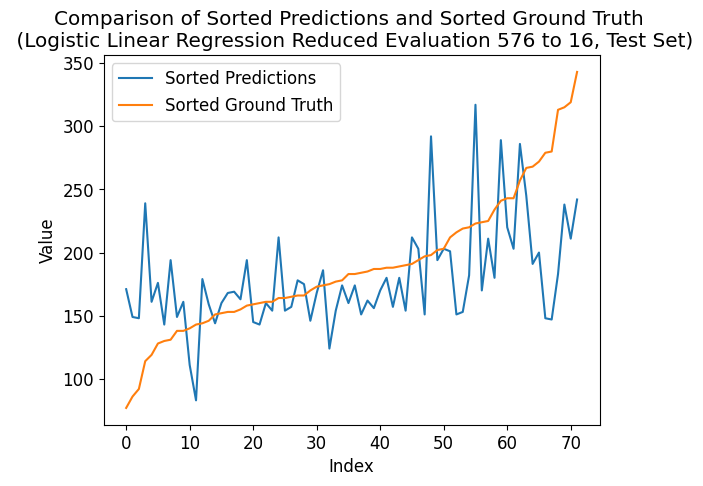

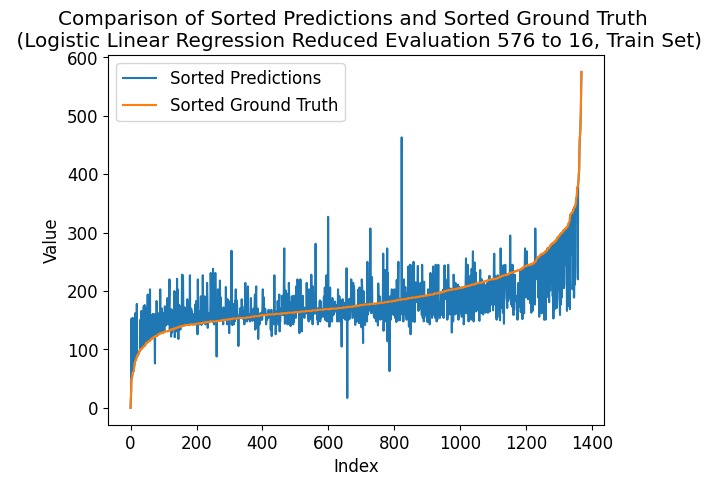

---- ---- ----
class_num = 592
Number of unique elements: 264
[  0.  37.  74. 111. 148. 185. 222. 259. 296. 333. 370. 407. 444. 481.
 518. 555. 592.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.5972011070782247
Coefficient of determination (R-squared score, R2 score): 0.19937451133698203
train eval:
Mean squared error: 1.1769005847953216
Correlation coefficient: 0.7477873329128645
Coefficient of determination (R-squared score, R2 score): 0.5236973788953097


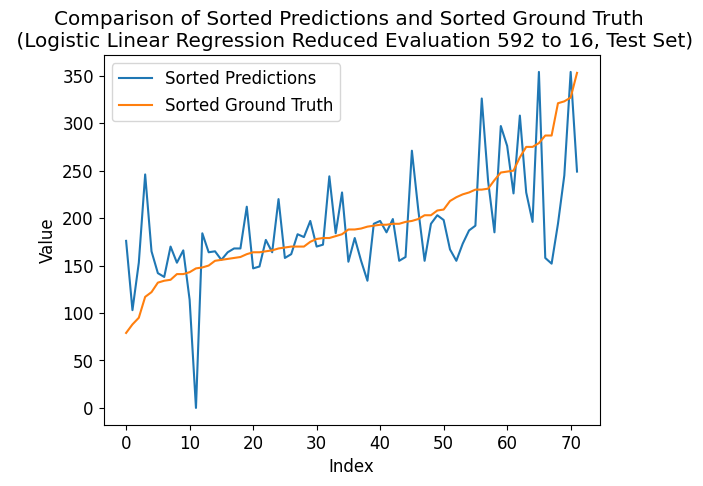

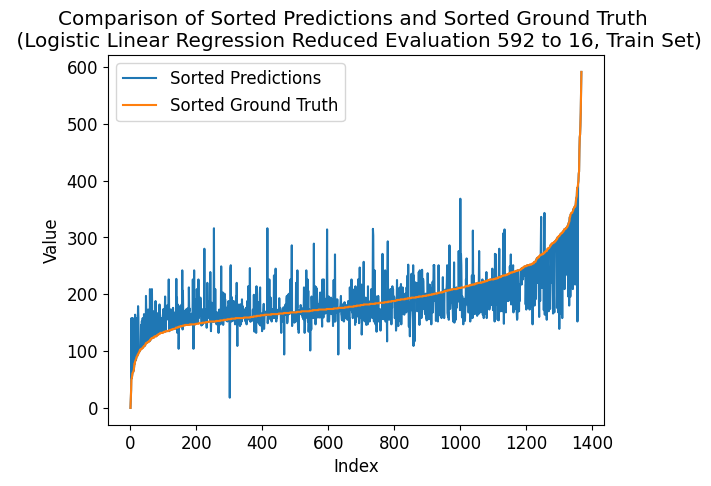

---- ---- ----
class_num = 608
Number of unique elements: 267
[  0.  38.  76. 114. 152. 190. 228. 266. 304. 342. 380. 418. 456. 494.
 532. 570. 608.]
test eval:
Mean squared error: 1.4305555555555556
Correlation coefficient: 0.6390245013207512
Coefficient of determination (R-squared score, R2 score): 0.35574667709147767
train eval:
Mean squared error: 1.1176900584795322
Correlation coefficient: 0.7644034209403937
Coefficient of determination (R-squared score, R2 score): 0.5476604300192102


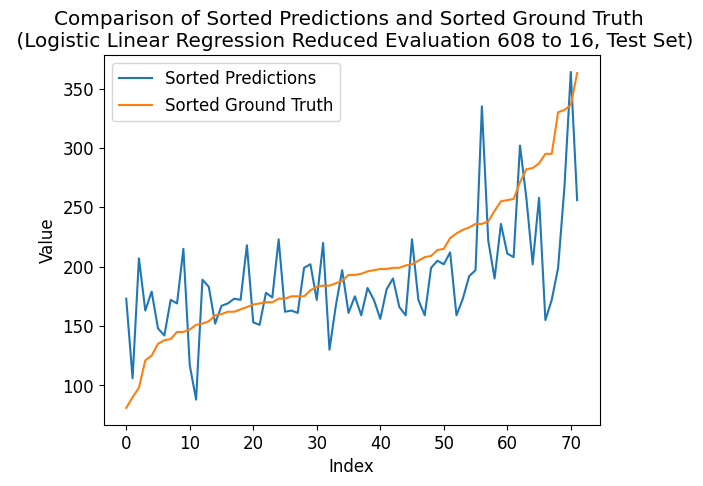

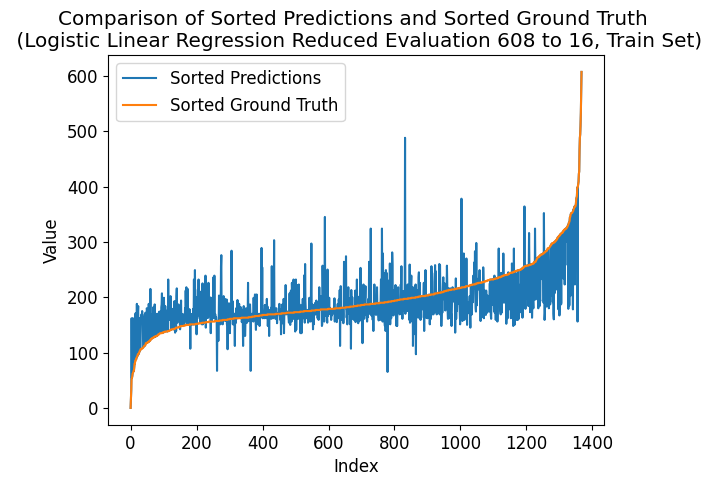

---- ---- ----
class_num = 624
Number of unique elements: 276
[  0.  39.  78. 117. 156. 195. 234. 273. 312. 351. 390. 429. 468. 507.
 546. 585. 624.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.605715126266002
Coefficient of determination (R-squared score, R2 score): 0.24941360437842064
train eval:
Mean squared error: 1.168859649122807
Correlation coefficient: 0.752828825635356
Coefficient of determination (R-squared score, R2 score): 0.5269516204059628


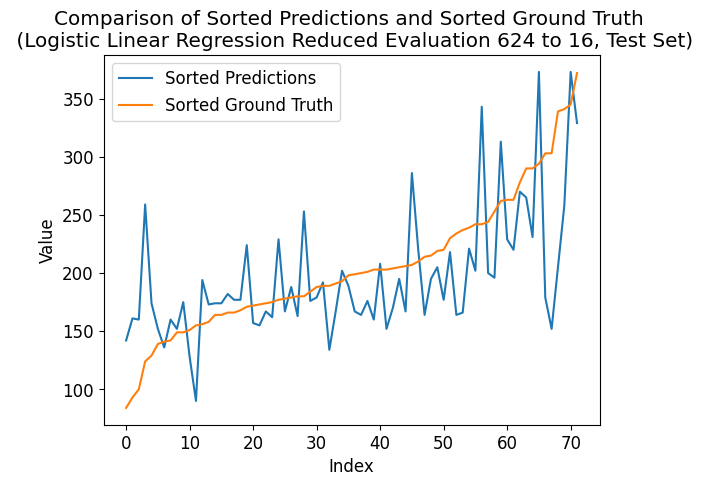

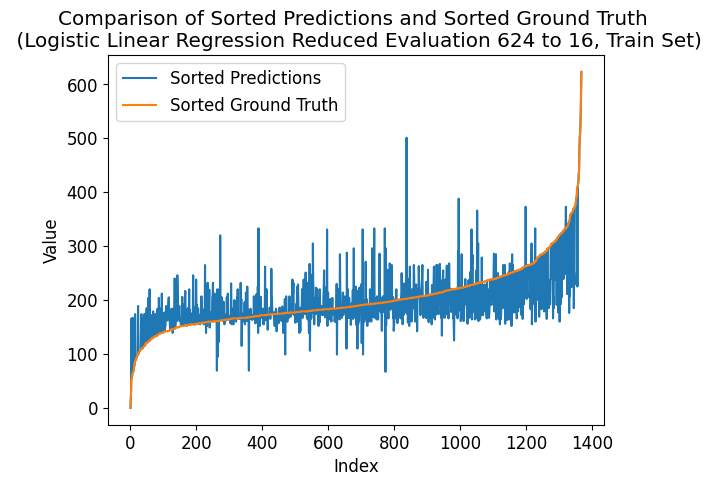

---- ---- ----
class_num = 640
Number of unique elements: 283
[  0.  40.  80. 120. 160. 200. 240. 280. 320. 360. 400. 440. 480. 520.
 560. 600. 640.]
test eval:
Mean squared error: 2.013888888888889
Correlation coefficient: 0.5152230779268484
Coefficient of determination (R-squared score, R2 score): 0.09304143862392489
train eval:
Mean squared error: 1.095029239766082
Correlation coefficient: 0.7688727272231125
Coefficient of determination (R-squared score, R2 score): 0.5568314742765055


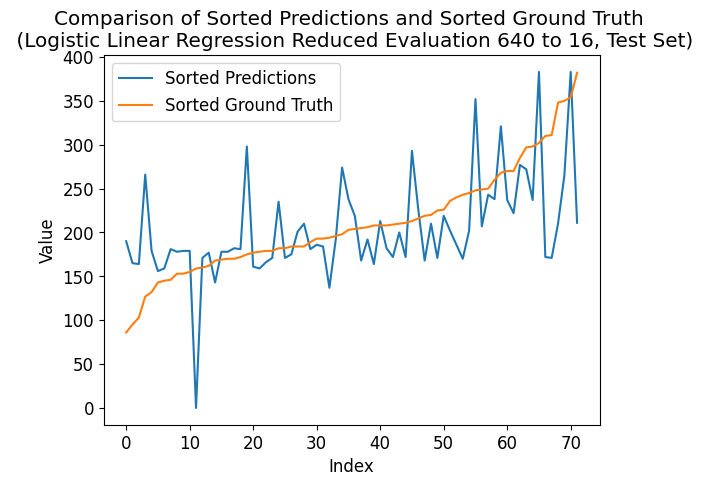

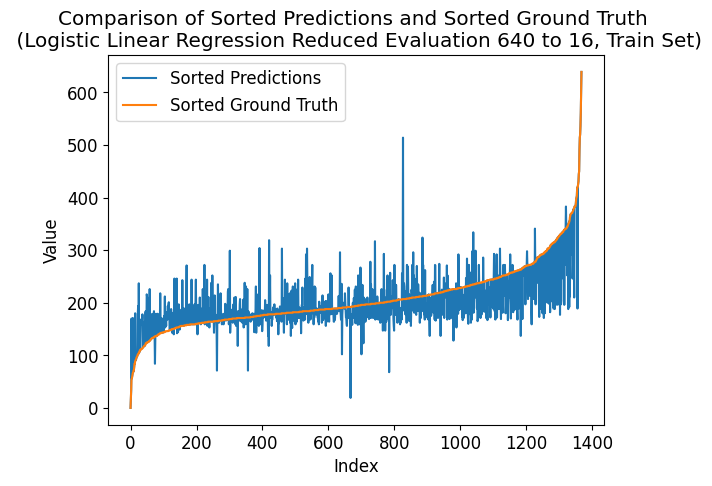

---- ---- ----
class_num = 656
Number of unique elements: 289
[  0.  41.  82. 123. 164. 205. 246. 287. 328. 369. 410. 451. 492. 533.
 574. 615. 656.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.5758583439448037
Coefficient of determination (R-squared score, R2 score): 0.20562939796716184
train eval:
Mean squared error: 1.1089181286549707
Correlation coefficient: 0.7668700958712914
Coefficient of determination (R-squared score, R2 score): 0.5512105116671955


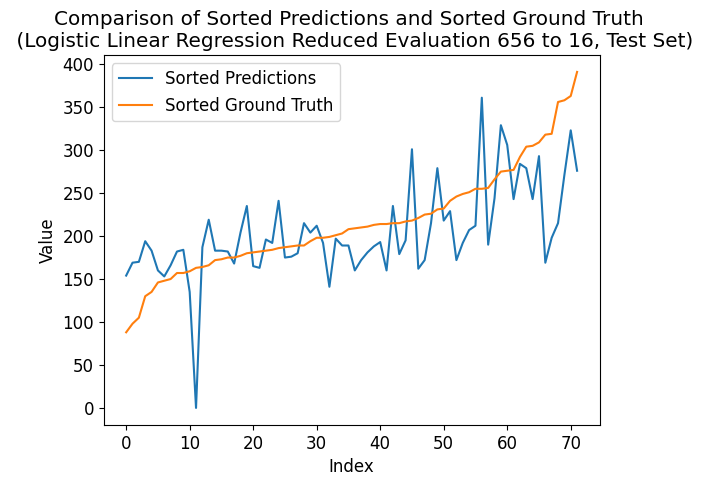

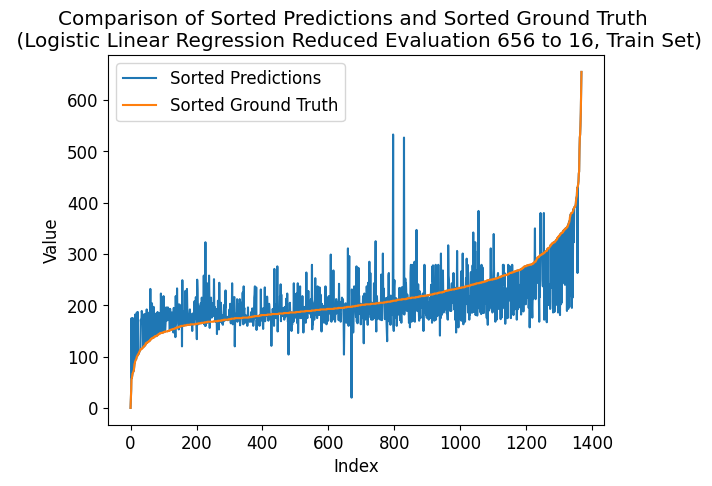

---- ---- ----
class_num = 672
Number of unique elements: 286
[  0.  42.  84. 126. 168. 210. 252. 294. 336. 378. 420. 462. 504. 546.
 588. 630. 672.]
test eval:
Mean squared error: 1.8472222222222223
Correlation coefficient: 0.5622223111571474
Coefficient of determination (R-squared score, R2 score): 0.16810007818608286
train eval:
Mean squared error: 1.148391812865497
Correlation coefficient: 0.7577207981136105
Coefficient of determination (R-squared score, R2 score): 0.5352351442512617


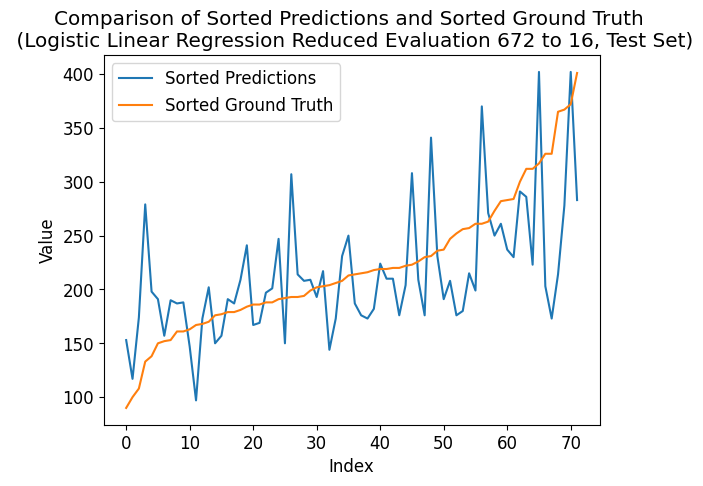

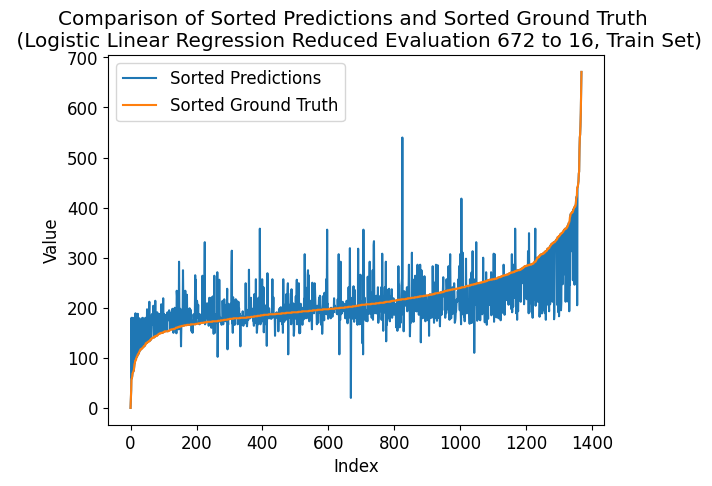

---- ---- ----
class_num = 688
Number of unique elements: 296
[  0.  43.  86. 129. 172. 215. 258. 301. 344. 387. 430. 473. 516. 559.
 602. 645. 688.]
test eval:
Mean squared error: 1.5138888888888888
Correlation coefficient: 0.6543168419105795
Coefficient of determination (R-squared score, R2 score): 0.3182173573103988
train eval:
Mean squared error: 1.0519005847953216
Correlation coefficient: 0.774640971154641
Coefficient of determination (R-squared score, R2 score): 0.5742860423790996


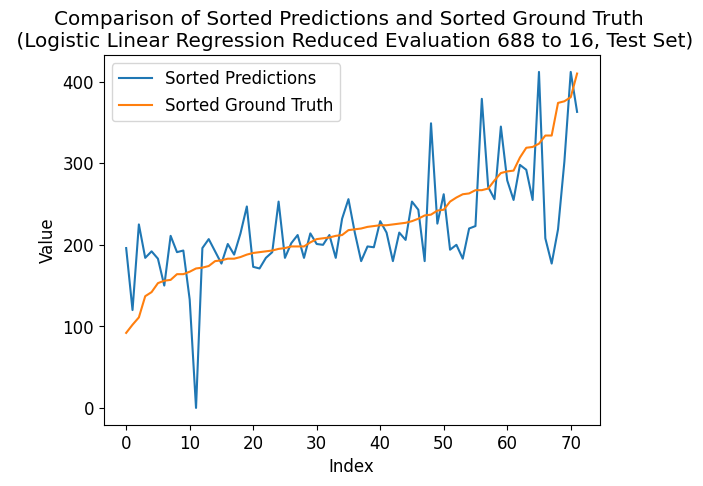

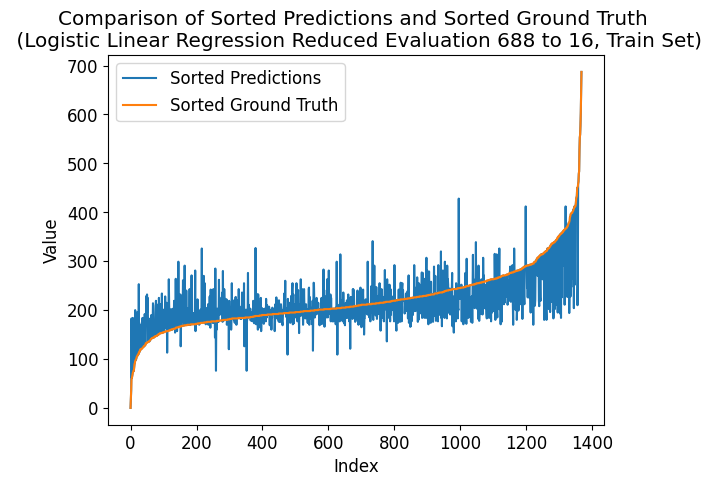

---- ---- ----
class_num = 704
Number of unique elements: 303
[  0.  44.  88. 132. 176. 220. 264. 308. 352. 396. 440. 484. 528. 572.
 616. 660. 704.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.5507636341654172
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.0935672514619883
Correlation coefficient: 0.7658620591427887
Coefficient of determination (R-squared score, R2 score): 0.5574231545511696


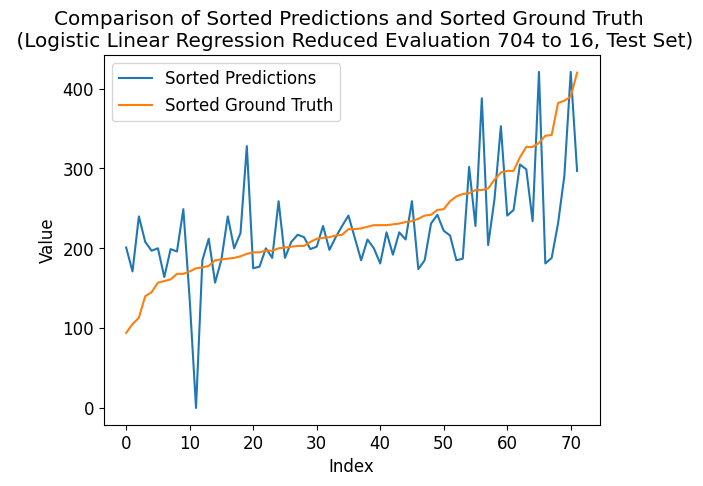

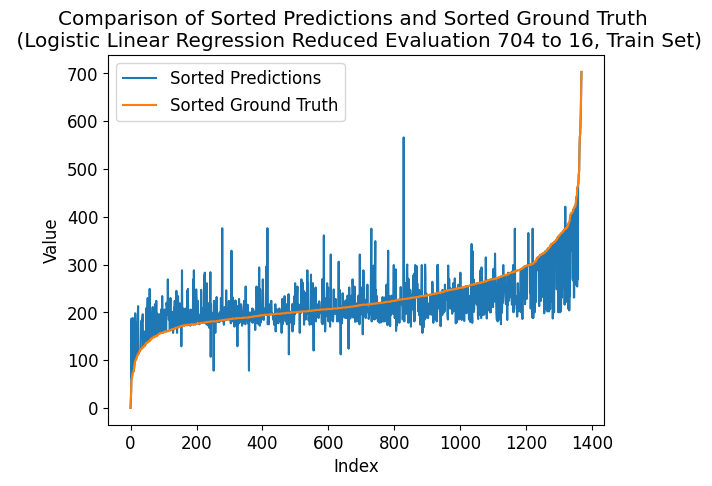

---- ---- ----
class_num = 720
Number of unique elements: 301
[  0.  45.  90. 135. 180. 225. 270. 315. 360. 405. 450. 495. 540. 585.
 630. 675. 720.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.5562256099161699
Coefficient of determination (R-squared score, R2 score): 0.21813917122752147
train eval:
Mean squared error: 1.003654970760234
Correlation coefficient: 0.7899021085590947
Coefficient of determination (R-squared score, R2 score): 0.5938114914430187


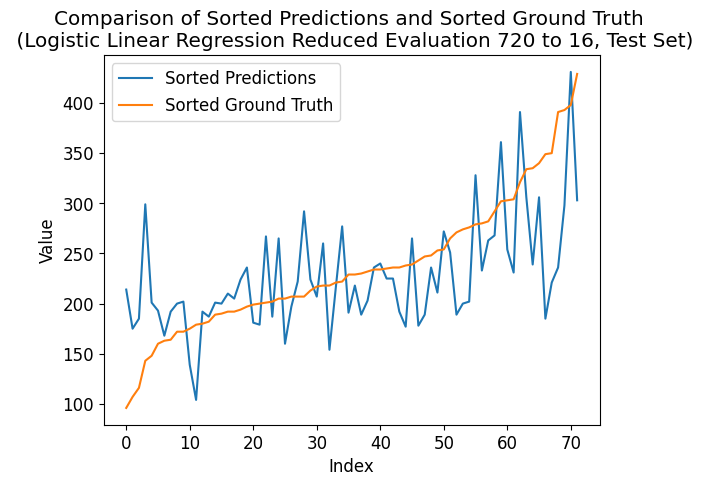

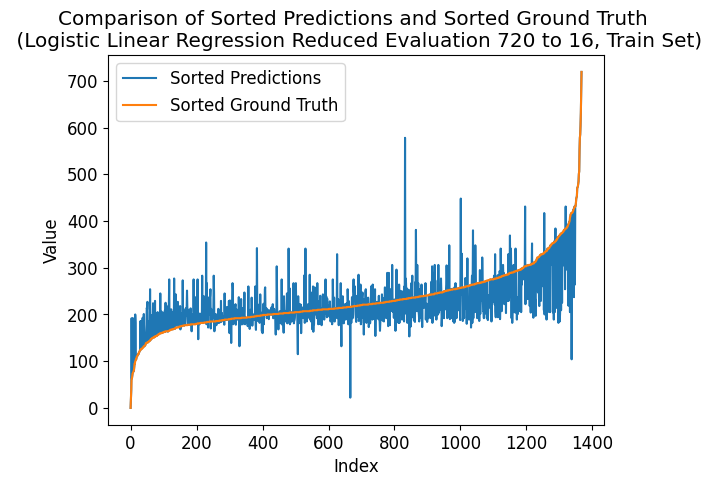

---- ---- ----
class_num = 736
Number of unique elements: 305
[  0.  46.  92. 138. 184. 230. 276. 322. 368. 414. 460. 506. 552. 598.
 644. 690. 736.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.5385508682619399
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.0277777777777777
Correlation coefficient: 0.7795211823175134
Coefficient of determination (R-squared score, R2 score): 0.5840487669110592


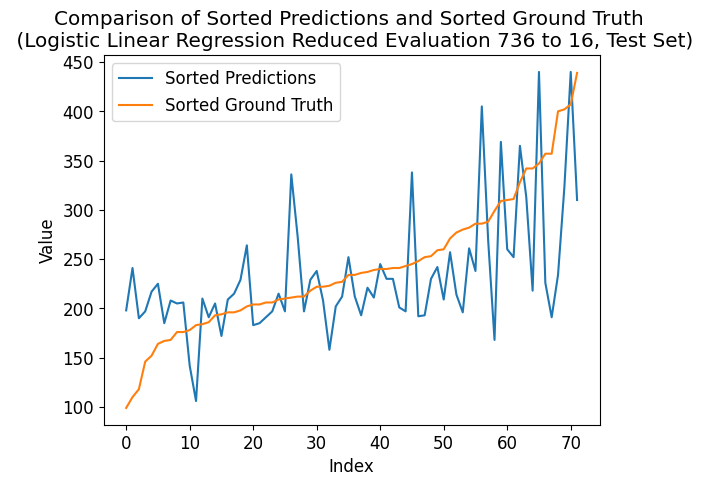

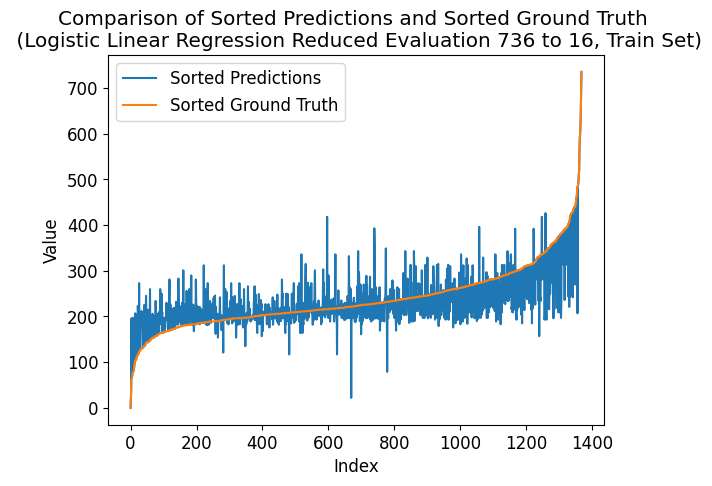

---- ---- ----
class_num = 752
Number of unique elements: 309
[  0.  47.  94. 141. 188. 235. 282. 329. 376. 423. 470. 517. 564. 611.
 658. 705. 752.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.5912650499218857
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
train eval:
Mean squared error: 0.9992690058479532
Correlation coefficient: 0.7890112567109867
Coefficient of determination (R-squared score, R2 score): 0.5955865322670113


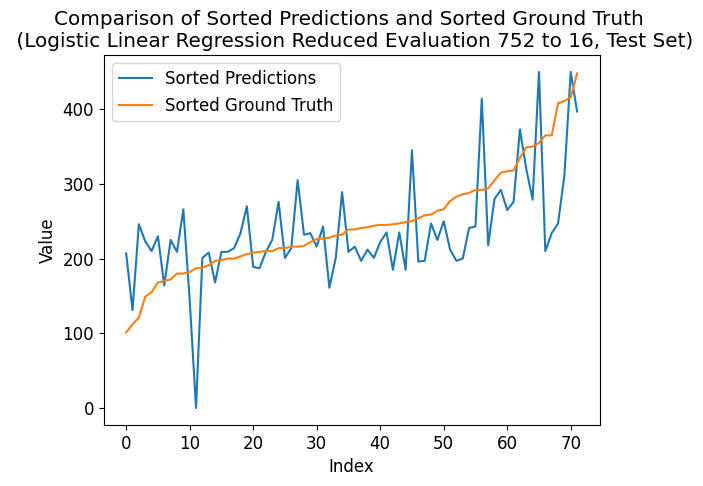

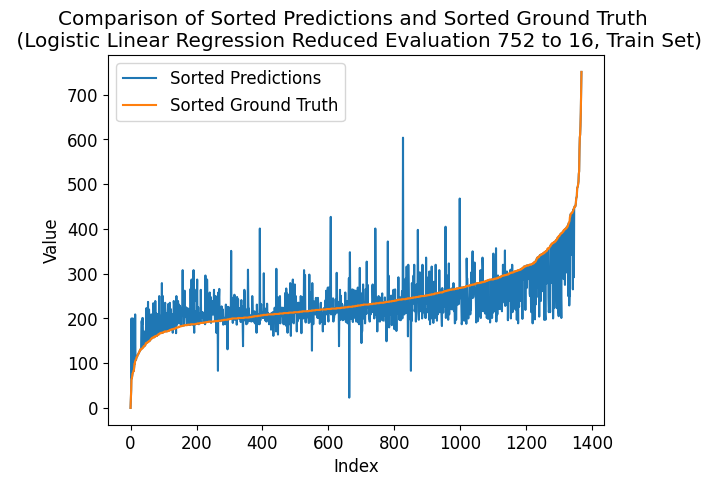

---- ---- ----
class_num = 768
Number of unique elements: 316
[  0.  48.  96. 144. 192. 240. 288. 336. 384. 432. 480. 528. 576. 624.
 672. 720. 768.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.5373204315502029
Coefficient of determination (R-squared score, R2 score): 0.17435496481626267
train eval:
Mean squared error: 1.0014619883040936
Correlation coefficient: 0.7892791172282241
Coefficient of determination (R-squared score, R2 score): 0.5946990118550151


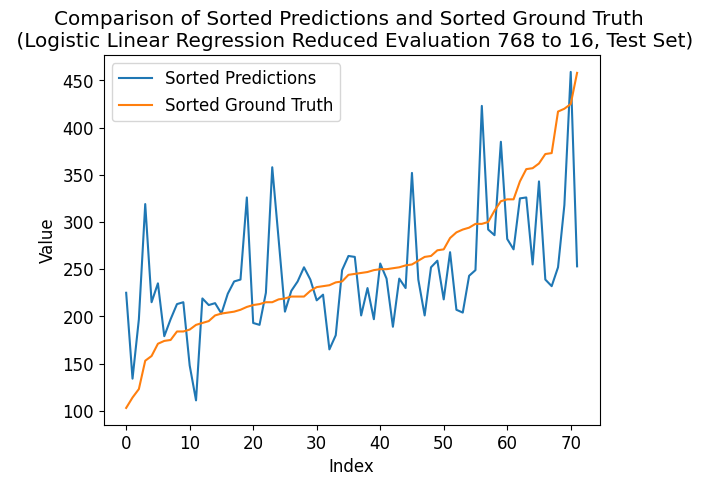

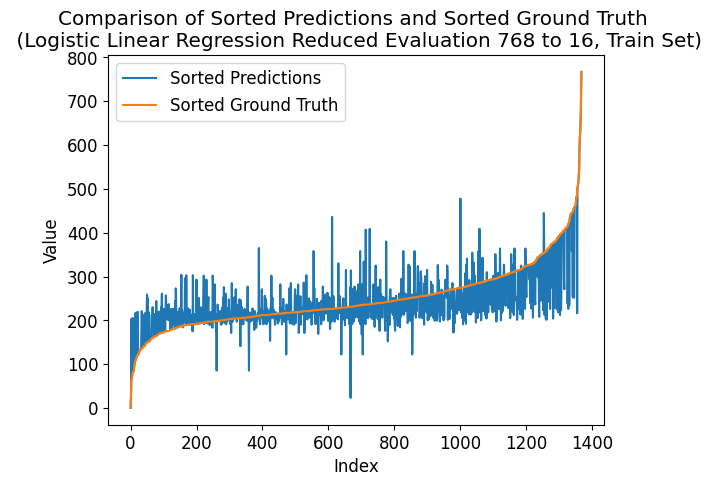

---- ---- ----
class_num = 784
Number of unique elements: 322
[  0.  49.  98. 147. 196. 245. 294. 343. 392. 441. 490. 539. 588. 637.
 686. 735. 784.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5522450448153107
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 1.0614035087719298
Correlation coefficient: 0.7778577416575584
Coefficient of determination (R-squared score, R2 score): 0.5704401205937824


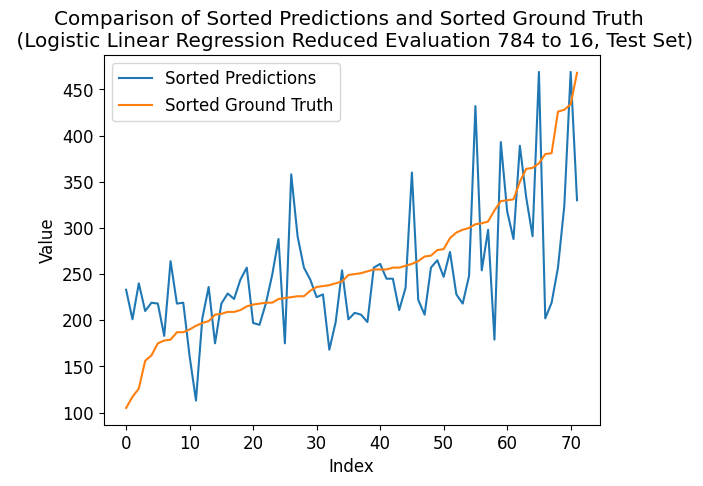

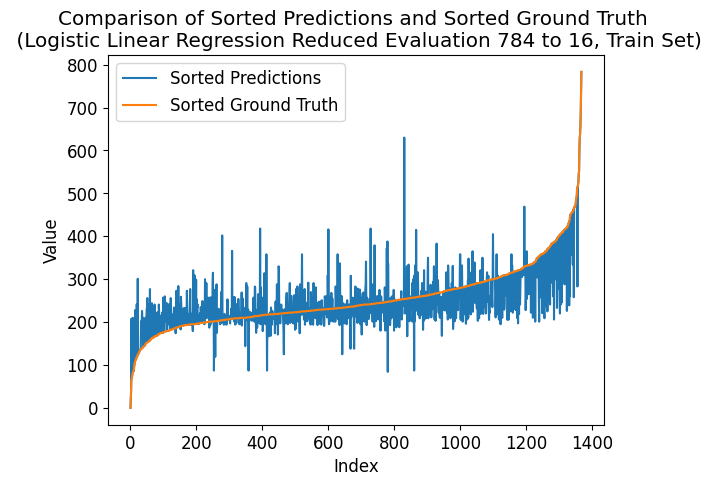

---- ---- ----
class_num = 800
Number of unique elements: 321
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600. 650.
 700. 750. 800.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.5856634598404964
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
train eval:
Mean squared error: 1.1074561403508771
Correlation coefficient: 0.7654800097441324
Coefficient of determination (R-squared score, R2 score): 0.5518021919418596


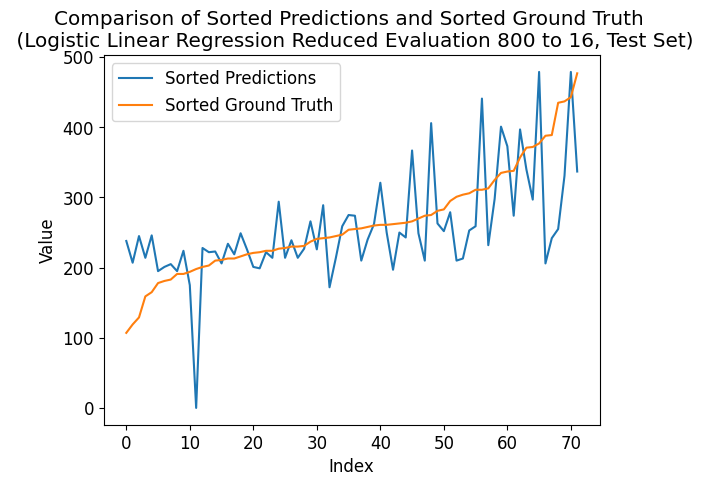

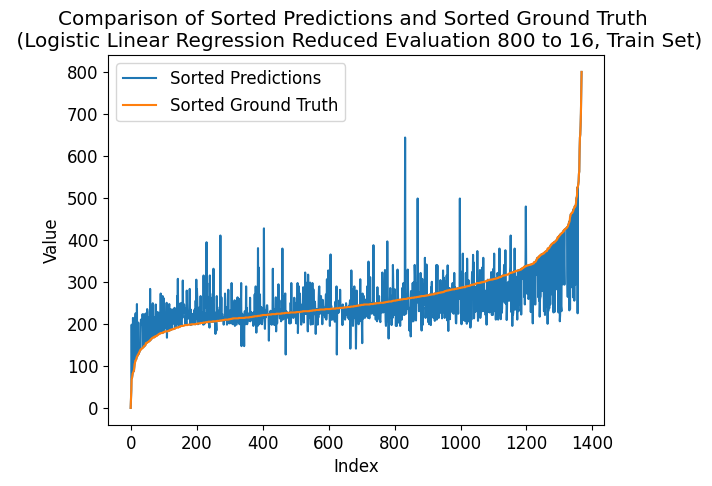

---- ---- ----
class_num = 816
Number of unique elements: 332
[  0.  51. 102. 153. 204. 255. 306. 357. 408. 459. 510. 561. 612. 663.
 714. 765. 816.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.5803955043136272
Coefficient of determination (R-squared score, R2 score): 0.11180609851446444
train eval:
Mean squared error: 1.0570175438596492
Correlation coefficient: 0.7763639046990334
Coefficient of determination (R-squared score, R2 score): 0.572215161417775


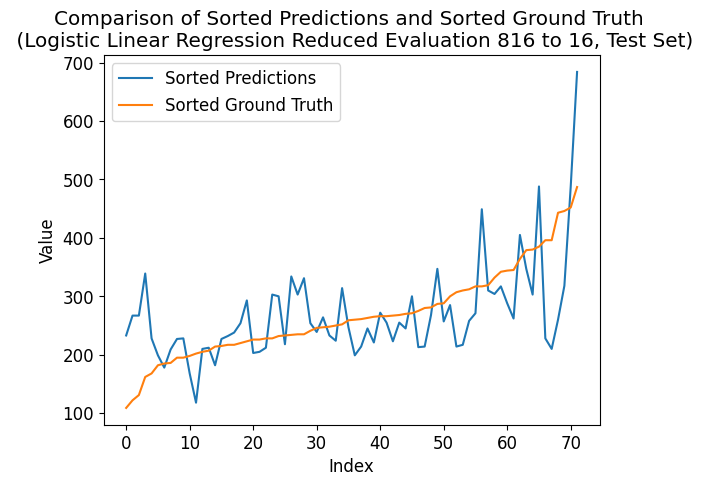

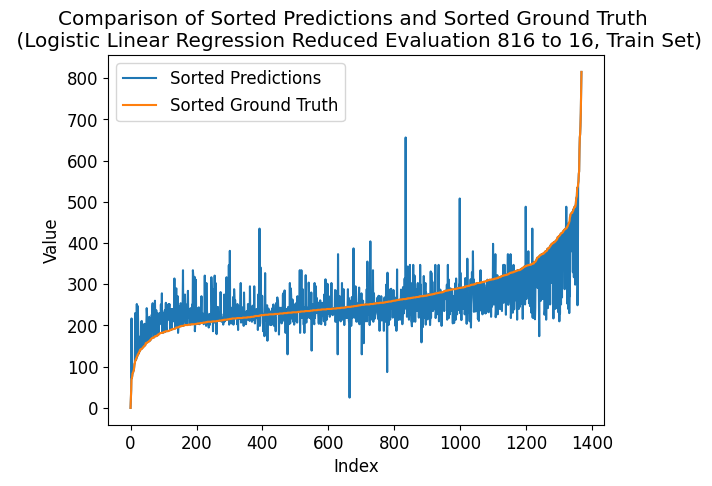

---- ---- ----
class_num = 832
Number of unique elements: 334
[  0.  52. 104. 156. 208. 260. 312. 364. 416. 468. 520. 572. 624. 676.
 728. 780. 832.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.5697395012717752
Coefficient of determination (R-squared score, R2 score): 0.21813917122752147
train eval:
Mean squared error: 1.0182748538011697
Correlation coefficient: 0.7838996235990243
Coefficient of determination (R-squared score, R2 score): 0.5878946886963765


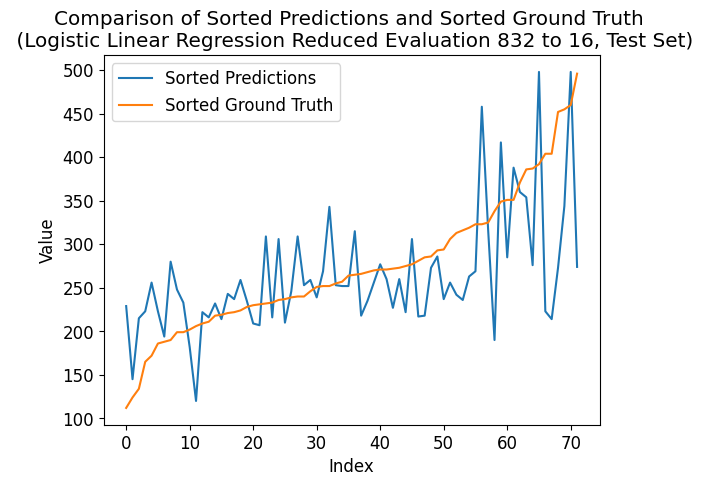

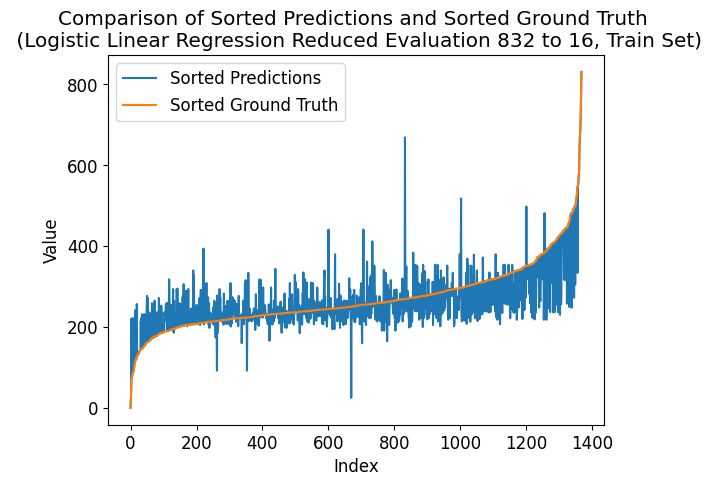

---- ---- ----
class_num = 848
Number of unique elements: 337
[  0.  53. 106. 159. 212. 265. 318. 371. 424. 477. 530. 583. 636. 689.
 742. 795. 848.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.5777008240165268
Coefficient of determination (R-squared score, R2 score): 0.26192337763878026
train eval:
Mean squared error: 0.9517543859649122
Correlation coefficient: 0.7979945685688701
Coefficient of determination (R-squared score, R2 score): 0.6148161411935982


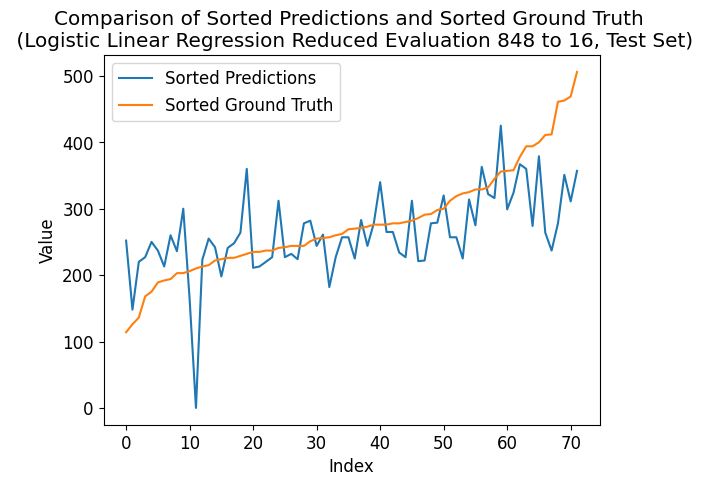

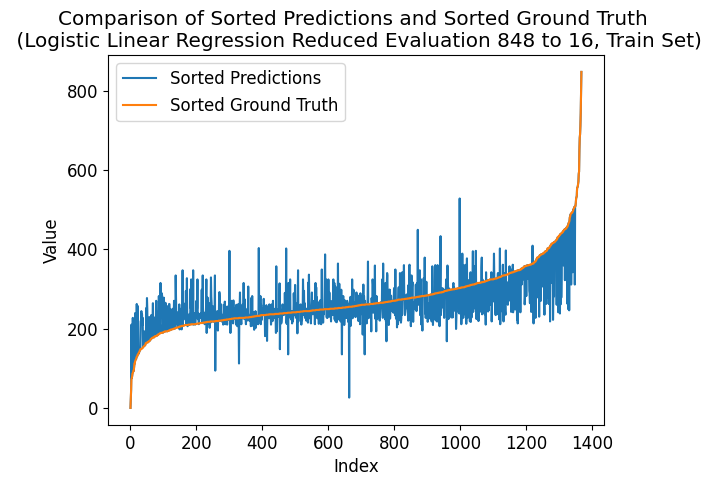

---- ---- ----
class_num = 864
Number of unique elements: 343
[  0.  54. 108. 162. 216. 270. 324. 378. 432. 486. 540. 594. 648. 702.
 756. 810. 864.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.503405687258811
Coefficient of determination (R-squared score, R2 score): 0.13682564503518369
train eval:
Mean squared error: 0.9605263157894737
Correlation coefficient: 0.7955984393906355
Coefficient of determination (R-squared score, R2 score): 0.611266059545613


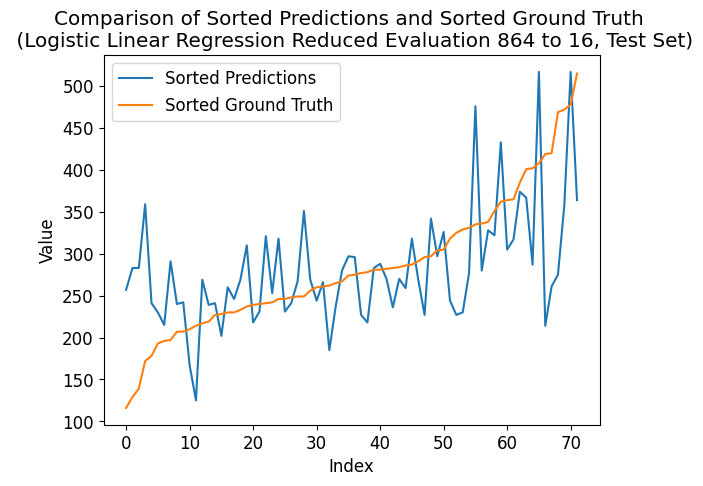

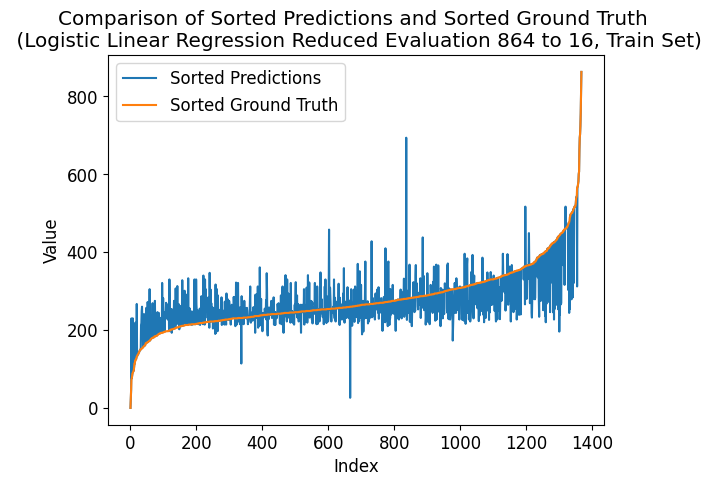

---- ---- ----
class_num = 880
Number of unique elements: 347
[  0.  55. 110. 165. 220. 275. 330. 385. 440. 495. 550. 605. 660. 715.
 770. 825. 880.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.5101192064706073
Coefficient of determination (R-squared score, R2 score): 0.13682564503518369
train eval:
Mean squared error: 0.9926900584795322
Correlation coefficient: 0.7896507262987414
Coefficient of determination (R-squared score, R2 score): 0.5982490935030003


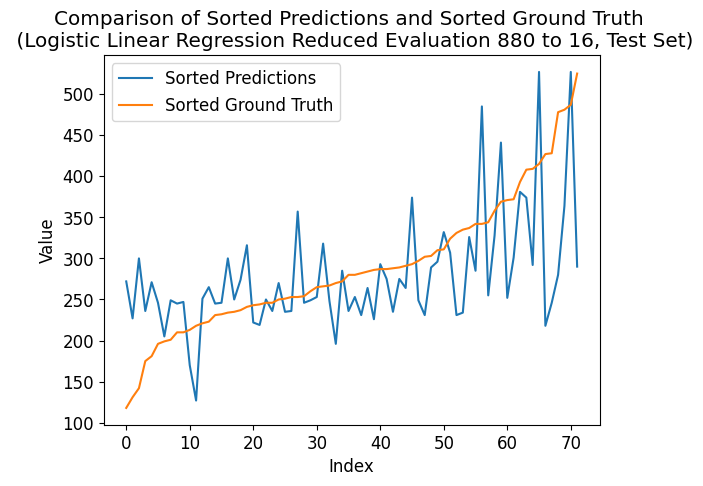

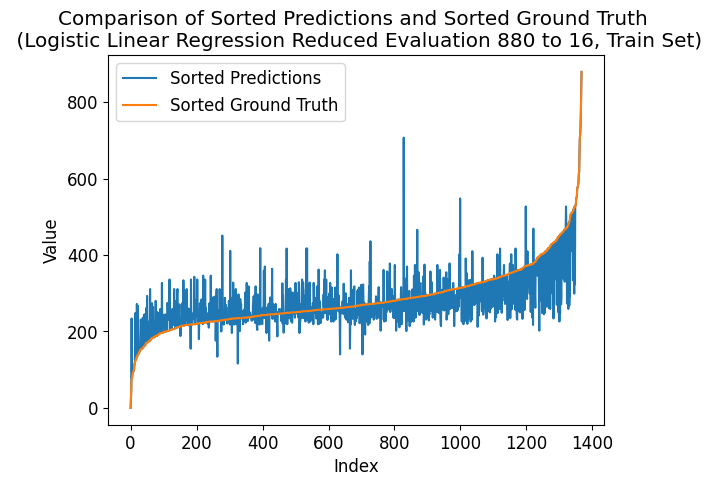

---- ---- ----
class_num = 896
Number of unique elements: 355
[  0.  56. 112. 168. 224. 280. 336. 392. 448. 504. 560. 616. 672. 728.
 784. 840. 896.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.53858461051637
Coefficient of determination (R-squared score, R2 score): 0.13682564503518369
train eval:
Mean squared error: 0.9510233918128655
Correlation coefficient: 0.7981827251869006
Coefficient of determination (R-squared score, R2 score): 0.6151119813309303


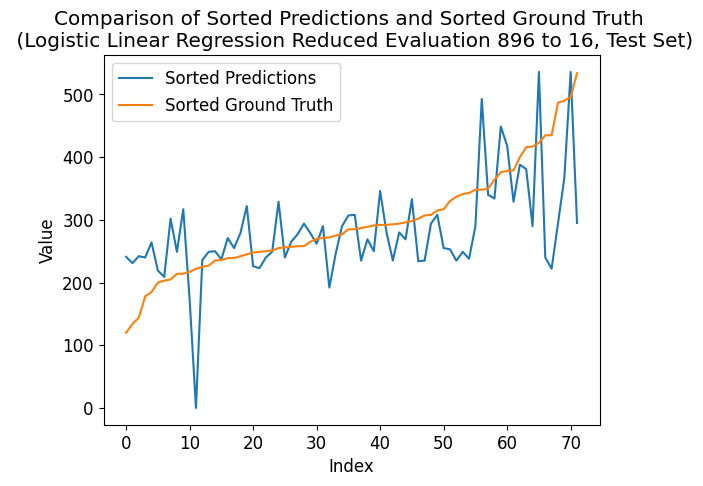

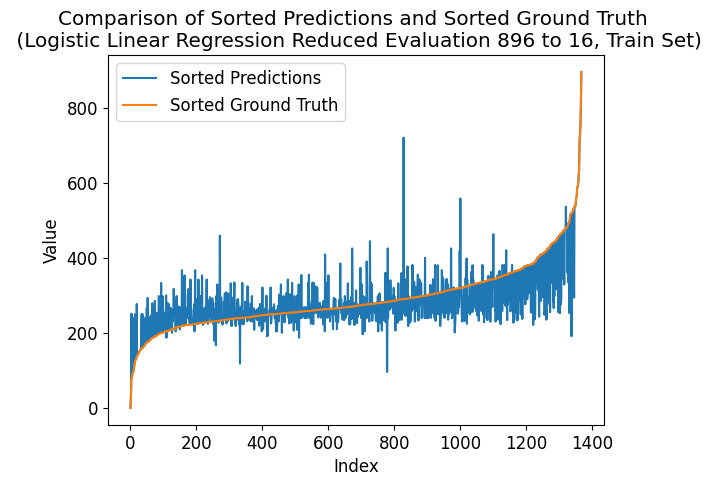

---- ---- ----
class_num = 912
Number of unique elements: 355
[  0.  57. 114. 171. 228. 285. 342. 399. 456. 513. 570. 627. 684. 741.
 798. 855. 912.]
test eval:
Mean squared error: 1.5277777777777777
Correlation coefficient: 0.6254626743124267
Coefficient of determination (R-squared score, R2 score): 0.3119624706802189
train eval:
Mean squared error: 0.9495614035087719
Correlation coefficient: 0.7990946853516803
Coefficient of determination (R-squared score, R2 score): 0.6157036616055945


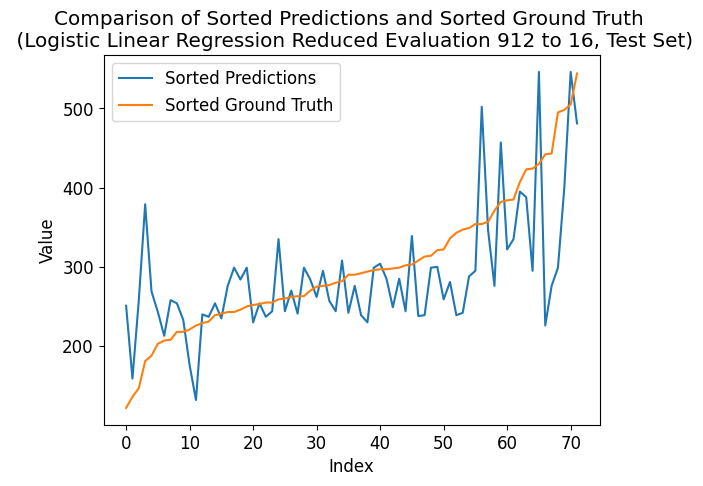

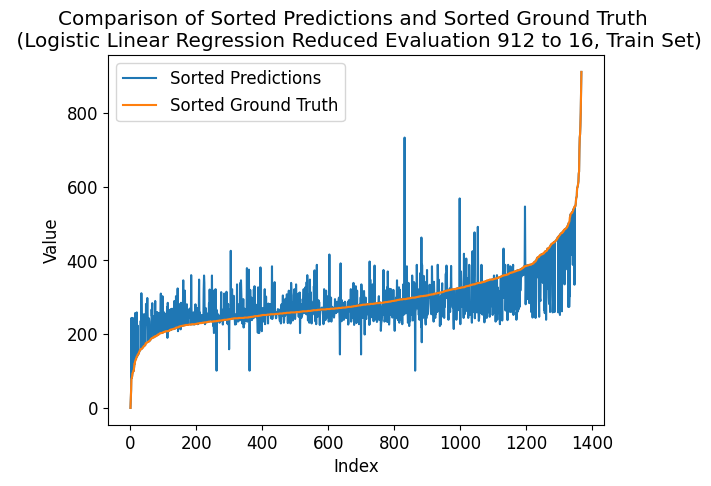

---- ---- ----
class_num = 928
Number of unique elements: 363
[  0.  58. 116. 174. 232. 290. 348. 406. 464. 522. 580. 638. 696. 754.
 812. 870. 928.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.5617973349460366
Coefficient of determination (R-squared score, R2 score): 0.25566849100860045
train eval:
Mean squared error: 0.9904970760233918
Correlation coefficient: 0.789534168505807
Coefficient of determination (R-squared score, R2 score): 0.5991366139149965


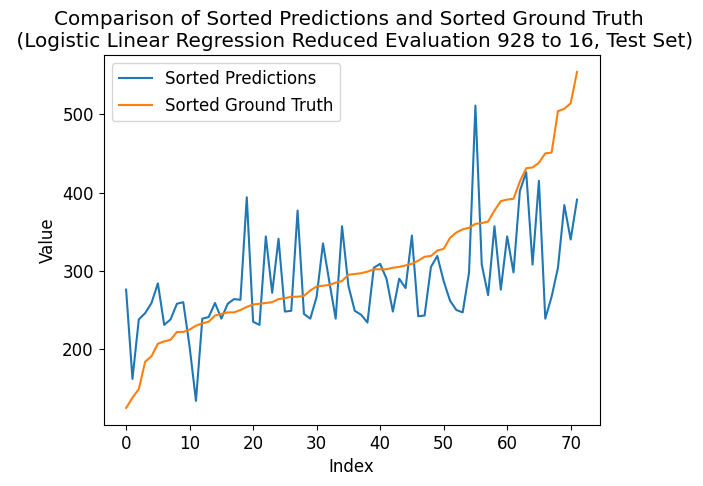

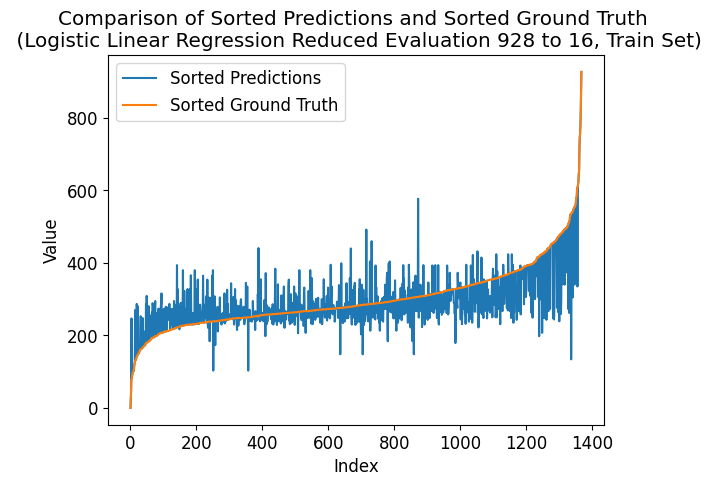

---- ---- ----
class_num = 944
Number of unique elements: 364
[  0.  59. 118. 177. 236. 295. 354. 413. 472. 531. 590. 649. 708. 767.
 826. 885. 944.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5657141036499427
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 0.9751461988304093
Correlation coefficient: 0.7942299254998936
Coefficient of determination (R-squared score, R2 score): 0.6053492567989709


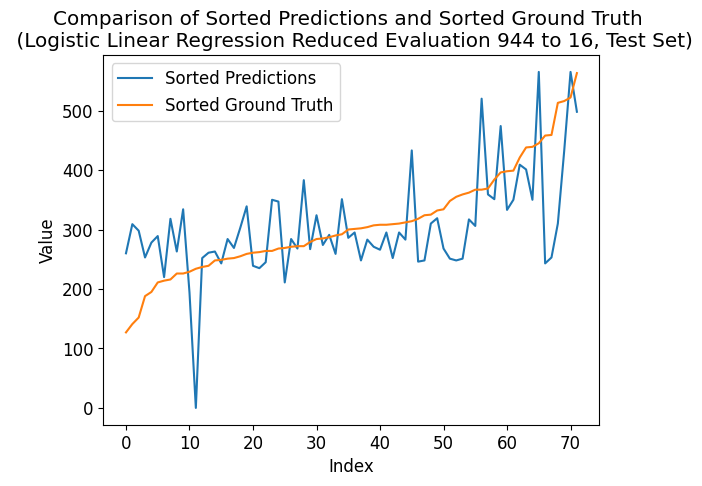

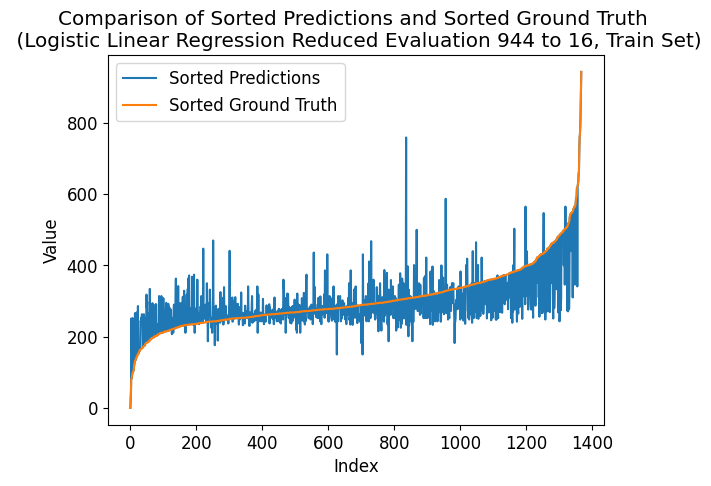

---- ---- ----
class_num = 960
Number of unique elements: 363
[  0.  60. 120. 180. 240. 300. 360. 420. 480. 540. 600. 660. 720. 780.
 840. 900. 960.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.612081789458155
Coefficient of determination (R-squared score, R2 score): 0.19937451133698203
train eval:
Mean squared error: 0.9627192982456141
Correlation coefficient: 0.7959525312964593
Coefficient of determination (R-squared score, R2 score): 0.6103785391336166


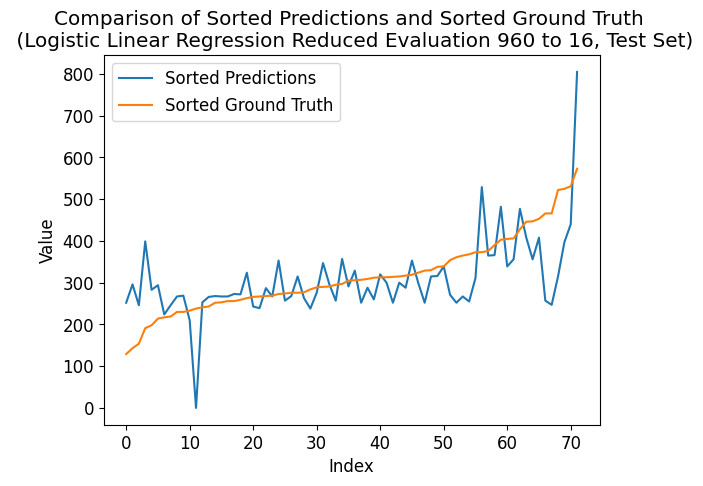

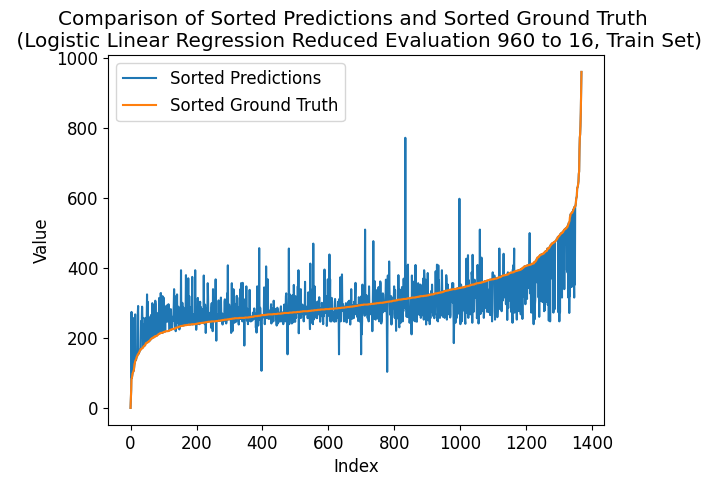

---- ---- ----
class_num = 976
Number of unique elements: 372
[  0.  61. 122. 183. 244. 305. 366. 427. 488. 549. 610. 671. 732. 793.
 854. 915. 976.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.5646217828666342
Coefficient of determination (R-squared score, R2 score): 0.23690383111806101
train eval:
Mean squared error: 1.0043859649122806
Correlation coefficient: 0.7893143510687056
Coefficient of determination (R-squared score, R2 score): 0.5935156513056865


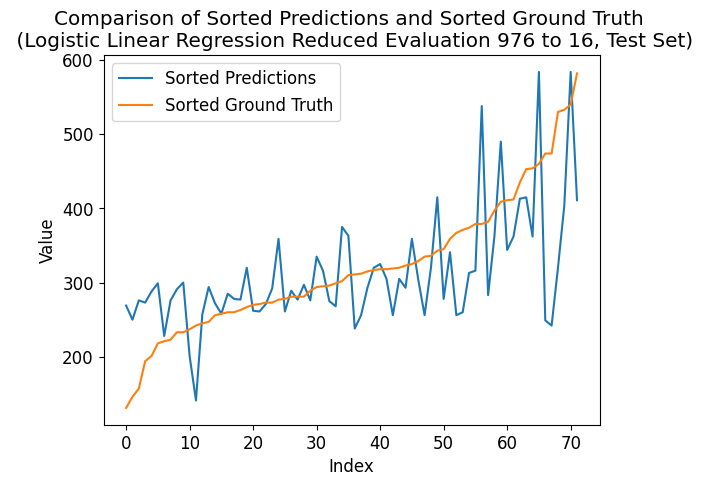

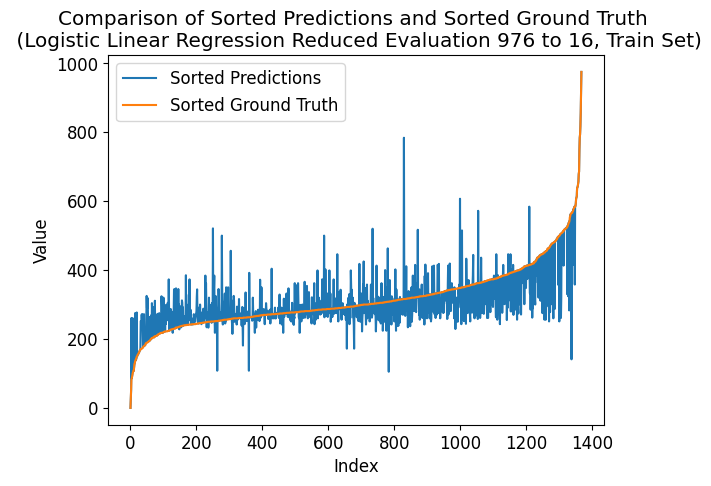

---- ---- ----
class_num = 992
Number of unique elements: 378
[  0.  62. 124. 186. 248. 310. 372. 434. 496. 558. 620. 682. 744. 806.
 868. 930. 992.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.5062644183135544
Coefficient of determination (R-squared score, R2 score): 0.13057075840500387
train eval:
Mean squared error: 0.9261695906432749
Correlation coefficient: 0.8083911188817217
Coefficient of determination (R-squared score, R2 score): 0.6251705460002219


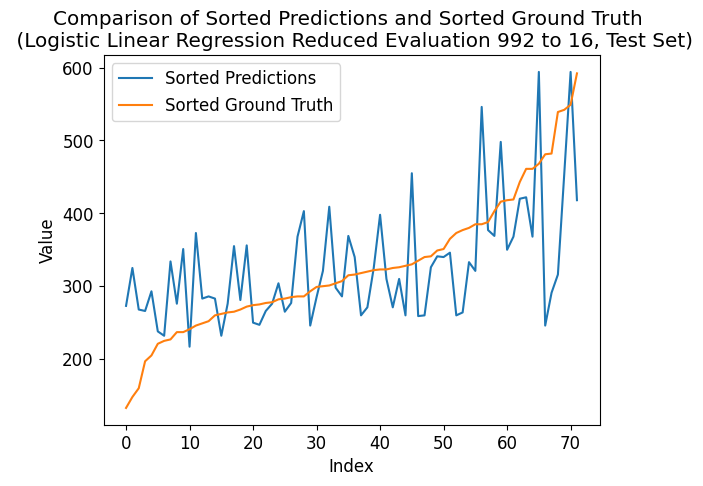

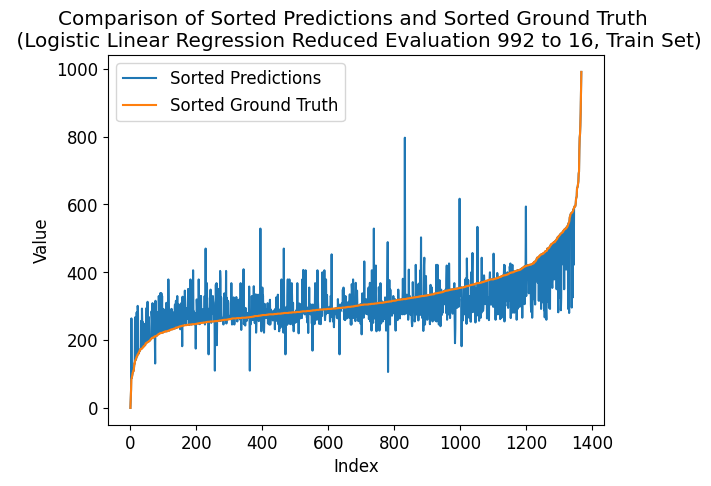

---- ---- ----
class_num = 1008
Number of unique elements: 376
[   0.   63.  126.  189.  252.  315.  378.  441.  504.  567.  630.  693.
  756.  819.  882.  945. 1008.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5227630322773065
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 0.9466374269005848
Correlation coefficient: 0.7978902018029274
Coefficient of determination (R-squared score, R2 score): 0.616887022154923


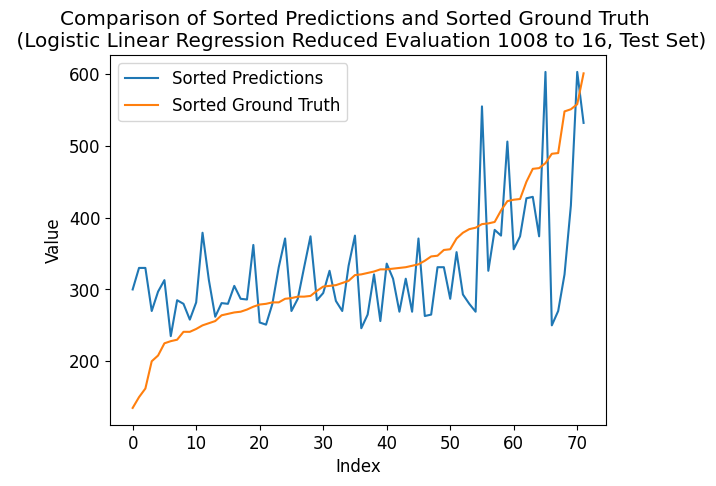

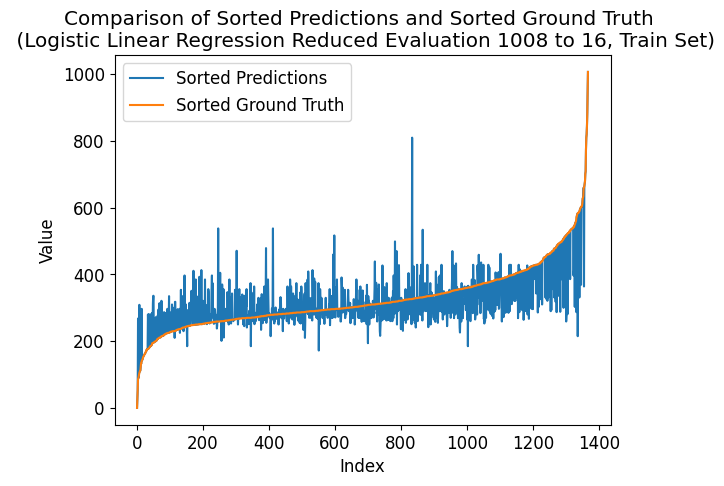

---- ---- ----
class_num = 1024
Number of unique elements: 380
[   0.   64.  128.  192.  256.  320.  384.  448.  512.  576.  640.  704.
  768.  832.  896.  960. 1024.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.6034432344026417
Coefficient of determination (R-squared score, R2 score): 0.13057075840500387
train eval:
Mean squared error: 0.9722222222222222
Correlation coefficient: 0.7953701020444294
Coefficient of determination (R-squared score, R2 score): 0.6065326173482992


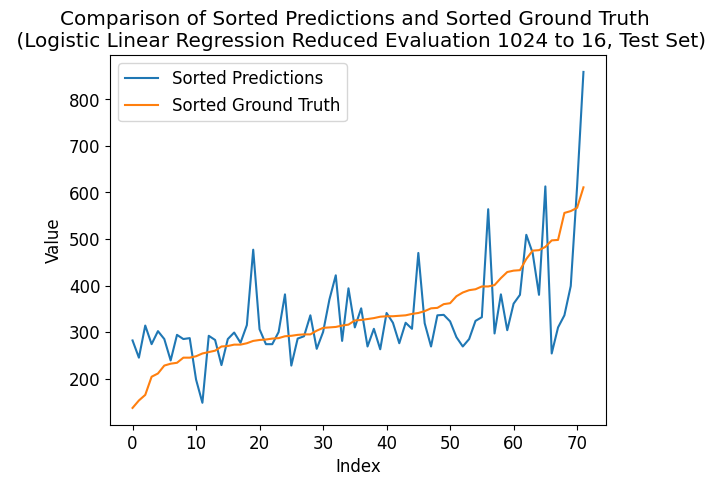

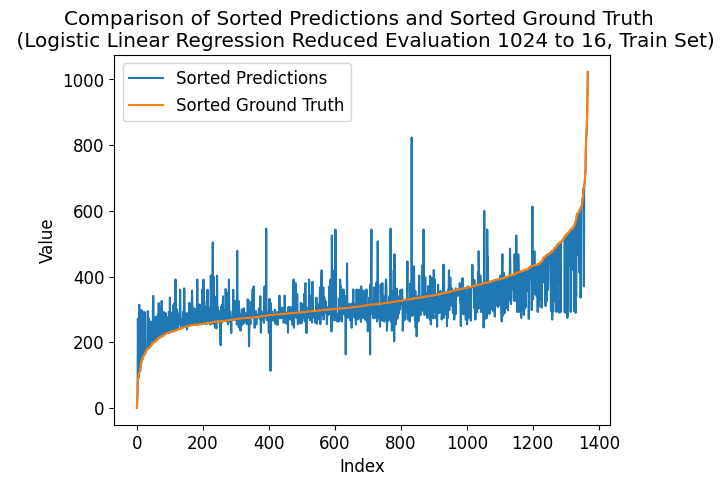

---- ---- ----
class_num = 1040
Number of unique elements: 385
[   0.   65.  130.  195.  260.  325.  390.  455.  520.  585.  650.  715.
  780.  845.  910.  975. 1040.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.4777504740932576
Coefficient of determination (R-squared score, R2 score): 0.16184519155590305
train eval:
Mean squared error: 0.9912280701754386
Correlation coefficient: 0.7907438728408758
Coefficient of determination (R-squared score, R2 score): 0.5988407737776644


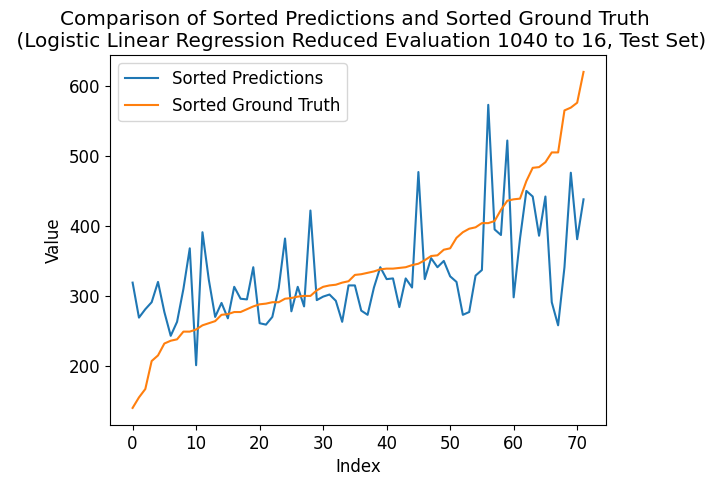

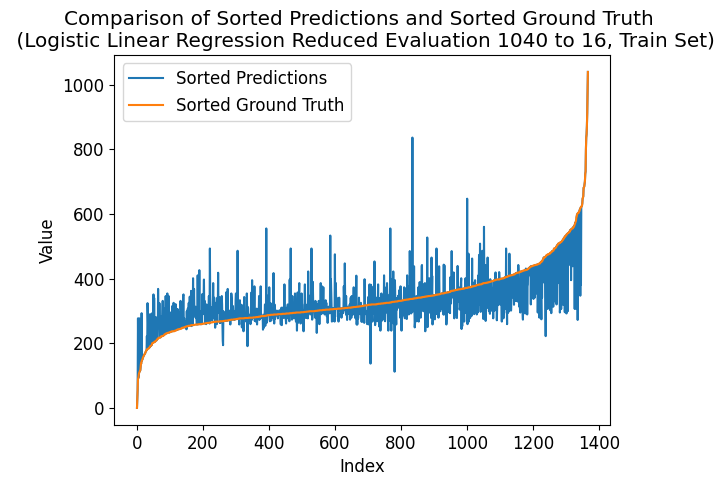

---- ---- ----
class_num = 1056
Number of unique elements: 391
[   0.   66.  132.  198.  264.  330.  396.  462.  528.  594.  660.  726.
  792.  858.  924.  990. 1056.]
test eval:
Mean squared error: 2.013888888888889
Correlation coefficient: 0.4729775848101929
Coefficient of determination (R-squared score, R2 score): 0.09304143862392489
train eval:
Mean squared error: 0.9627192982456141
Correlation coefficient: 0.799720624574081
Coefficient of determination (R-squared score, R2 score): 0.6103785391336166


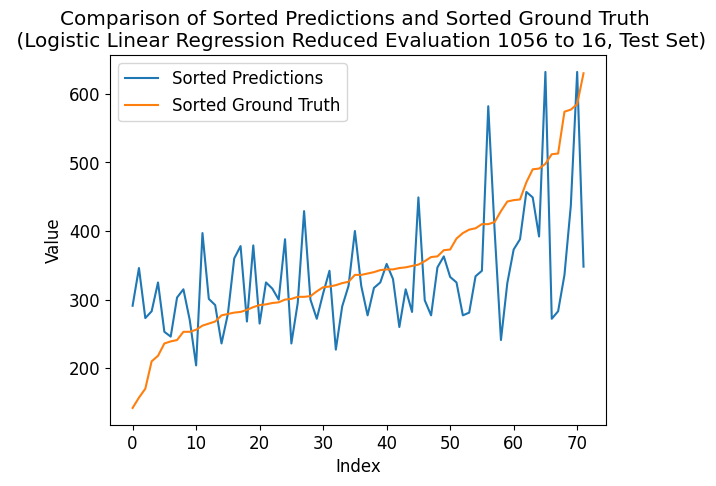

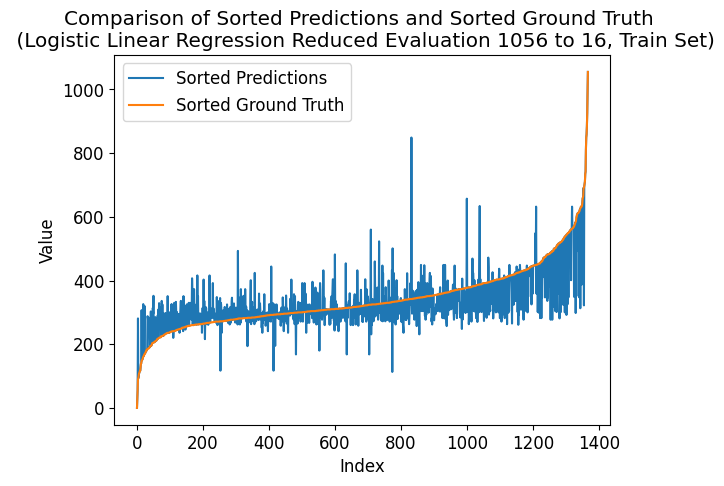

---- ---- ----
class_num = 1072
Number of unique elements: 394
[   0.   67.  134.  201.  268.  335.  402.  469.  536.  603.  670.  737.
  804.  871.  938. 1005. 1072.]
test eval:
Mean squared error: 2.0972222222222223
Correlation coefficient: 0.4724224860651146
Coefficient of determination (R-squared score, R2 score): 0.055512118842846014
train eval:
Mean squared error: 0.9407894736842105
Correlation coefficient: 0.8011915715023046
Coefficient of determination (R-squared score, R2 score): 0.6192537432535798


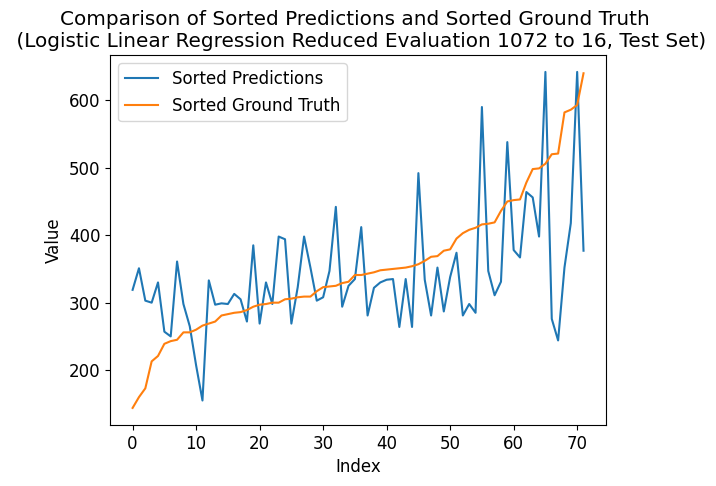

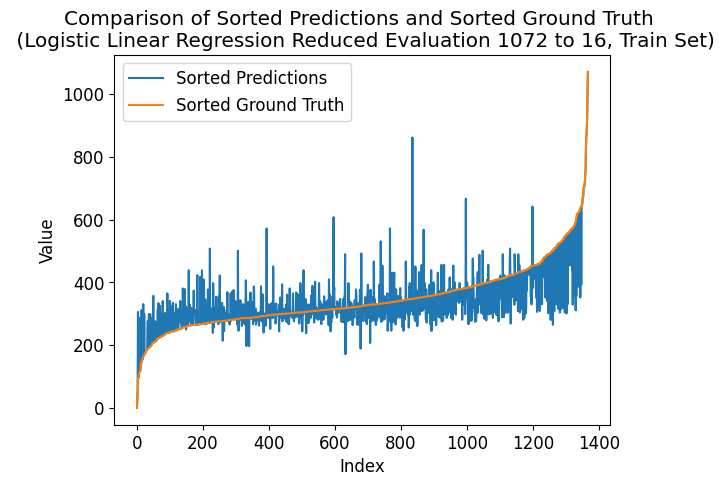

---- ---- ----
class_num = 1088
Number of unique elements: 395
[   0.   68.  136.  204.  272.  340.  408.  476.  544.  612.  680.  748.
  816.  884.  952. 1020. 1088.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.5872584045744017
Coefficient of determination (R-squared score, R2 score): 0.24941360437842064
train eval:
Mean squared error: 0.9941520467836257
Correlation coefficient: 0.7907098120400754
Coefficient of determination (R-squared score, R2 score): 0.5976574132283361


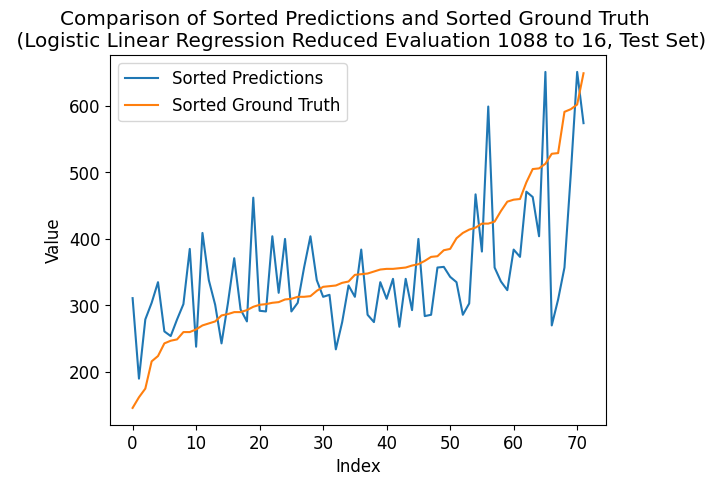

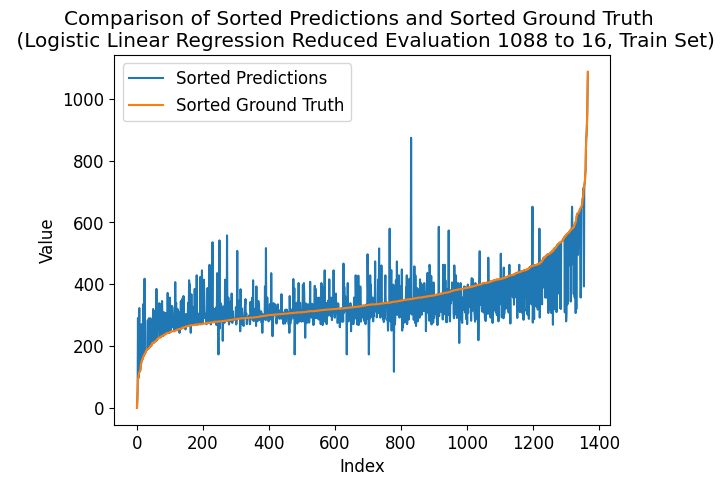

---- ---- ----
class_num = 1104
Number of unique elements: 406
[   0.   69.  138.  207.  276.  345.  414.  483.  552.  621.  690.  759.
  828.  897.  966. 1035. 1104.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.5177223648156686
Coefficient of determination (R-squared score, R2 score): 0.19311962470680222
train eval:
Mean squared error: 0.8340643274853801
Correlation coefficient: 0.8225369651885791
Coefficient of determination (R-squared score, R2 score): 0.6624464033040672


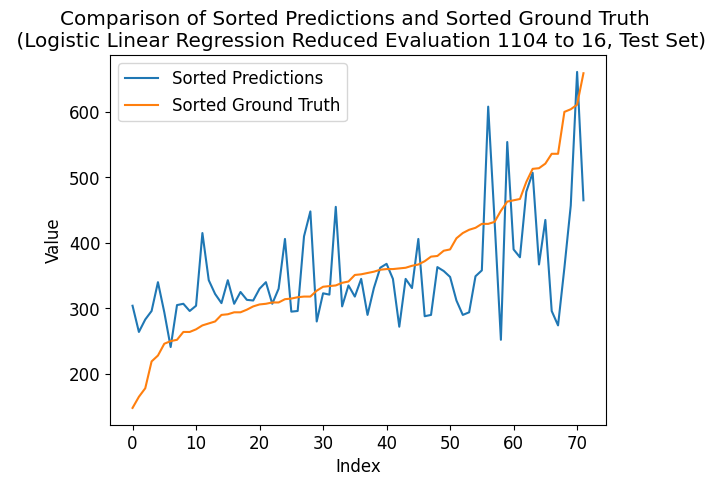

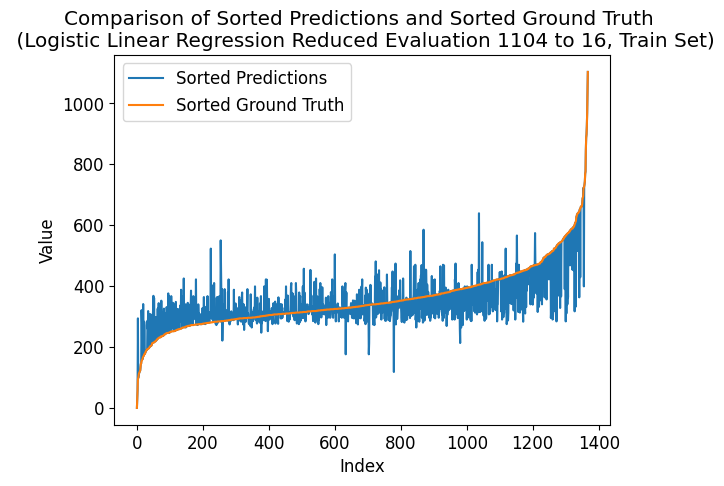

---- ---- ----
class_num = 1120
Number of unique elements: 410
[   0.   70.  140.  210.  280.  350.  420.  490.  560.  630.  700.  770.
  840.  910.  980. 1050. 1120.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.5629878225637979
Coefficient of determination (R-squared score, R2 score): 0.22439405785770128
train eval:
Mean squared error: 0.8662280701754386
Correlation coefficient: 0.8188381698634138
Coefficient of determination (R-squared score, R2 score): 0.6494294372614546


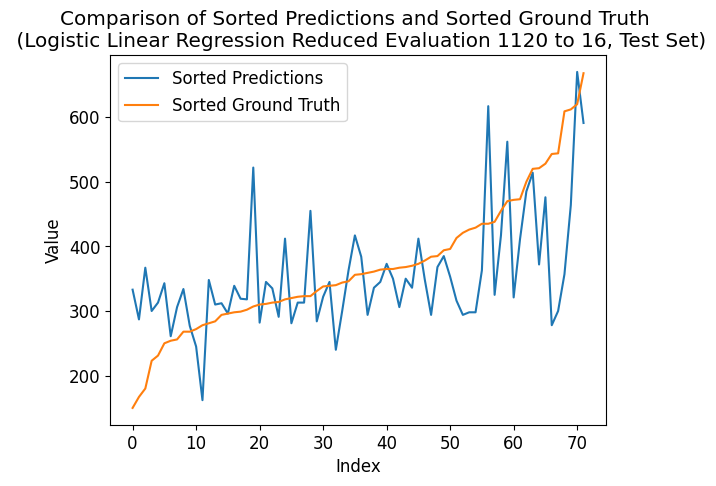

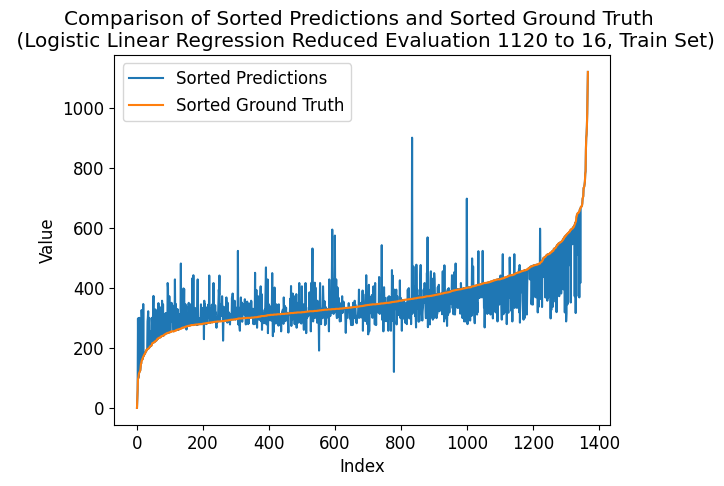

---- ---- ----
class_num = 1136
Number of unique elements: 405
[   0.   71.  142.  213.  284.  355.  426.  497.  568.  639.  710.  781.
  852.  923.  994. 1065. 1136.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.5782352604130944
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 0.935672514619883
Correlation coefficient: 0.8055165246943168
Coefficient of determination (R-squared score, R2 score): 0.6213246242149045


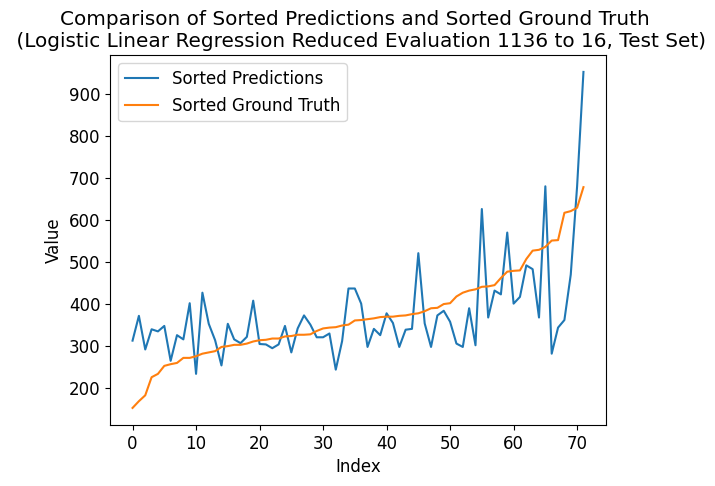

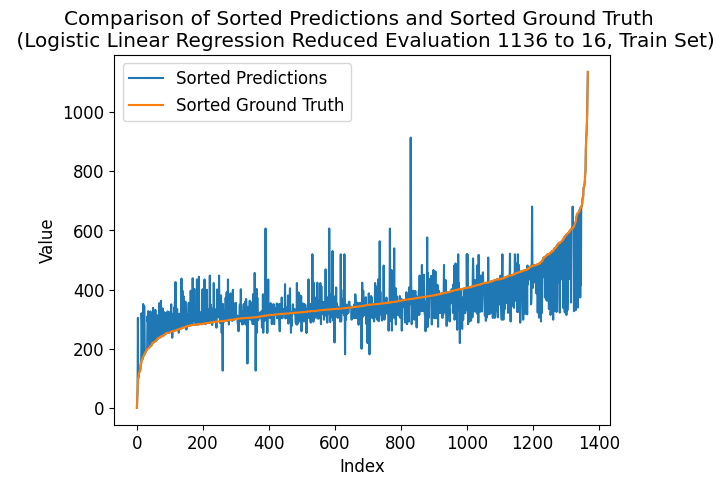

---- ---- ----
class_num = 1152
Number of unique elements: 416
[   0.   72.  144.  216.  288.  360.  432.  504.  576.  648.  720.  792.
  864.  936. 1008. 1080. 1152.]
test eval:
Mean squared error: 2.0
Correlation coefficient: 0.4501316211788759
Coefficient of determination (R-squared score, R2 score): 0.09929632525410481
train eval:
Mean squared error: 0.9400584795321637
Correlation coefficient: 0.8016108743905278
Coefficient of determination (R-squared score, R2 score): 0.6195495833909119


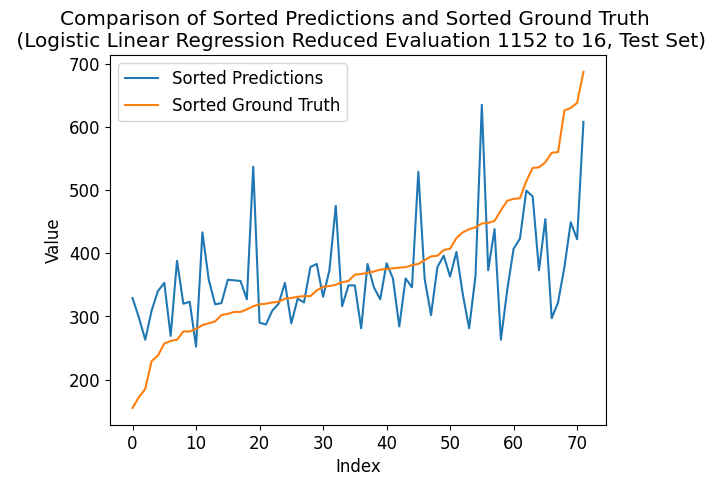

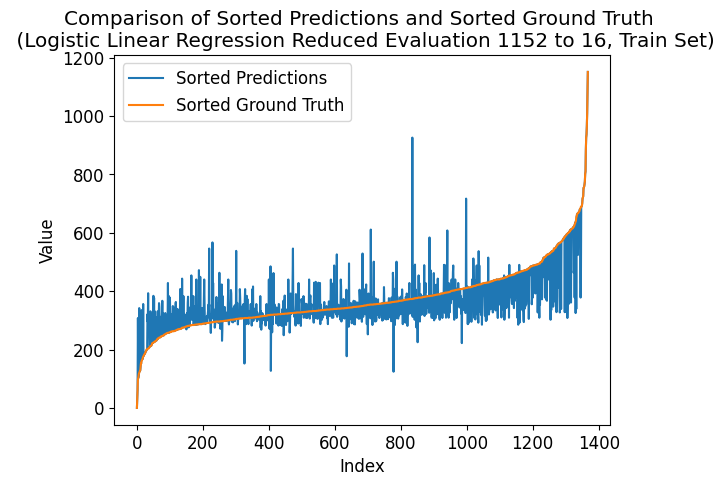

---- ---- ----
class_num = 1168
Number of unique elements: 412
[   0.   73.  146.  219.  292.  365.  438.  511.  584.  657.  730.  803.
  876.  949. 1022. 1095. 1168.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.6015981477928266
Coefficient of determination (R-squared score, R2 score): 0.2806880375293198
train eval:
Mean squared error: 0.8845029239766082
Correlation coefficient: 0.8141564353558398
Coefficient of determination (R-squared score, R2 score): 0.6420334338281519


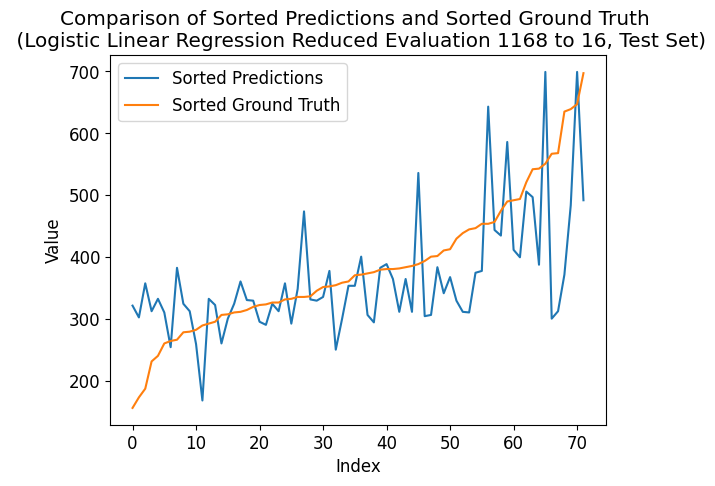

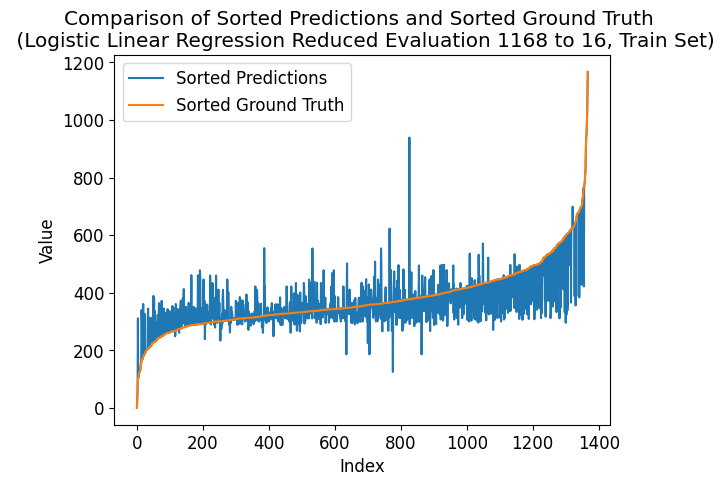

---- ---- ----
class_num = 1184
Number of unique elements: 419
[   0.   74.  148.  222.  296.  370.  444.  518.  592.  666.  740.  814.
  888.  962. 1036. 1110. 1184.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.5507686224313617
Coefficient of determination (R-squared score, R2 score): 0.20562939796716184
train eval:
Mean squared error: 0.9400584795321637
Correlation coefficient: 0.8009791464224506
Coefficient of determination (R-squared score, R2 score): 0.6195495833909119


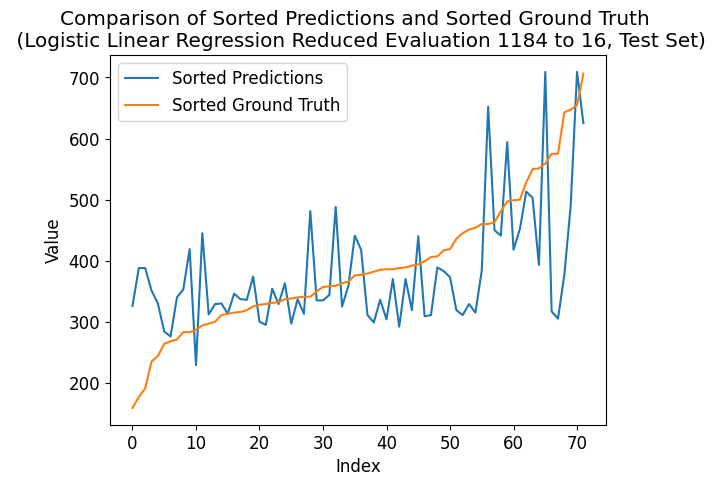

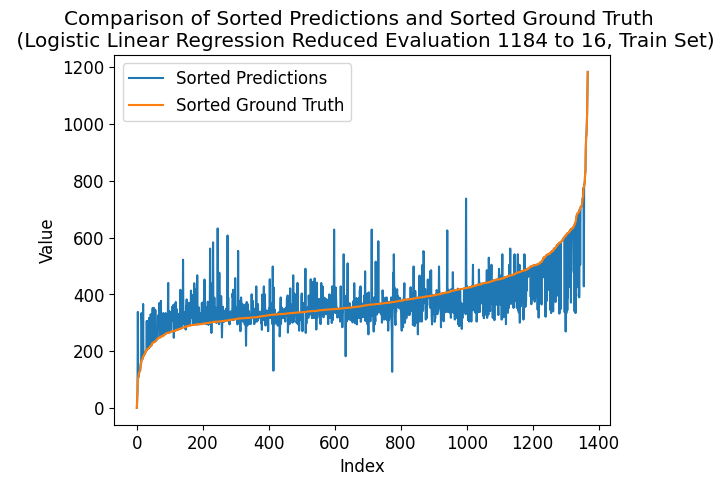

---- ---- ----
class_num = 1200
Number of unique elements: 421
[   0.   75.  150.  225.  300.  375.  450.  525.  600.  675.  750.  825.
  900.  975. 1050. 1125. 1200.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.5913279729700597
Coefficient of determination (R-squared score, R2 score): 0.16184519155590305
train eval:
Mean squared error: 0.9078947368421053
Correlation coefficient: 0.8078583814586204
Coefficient of determination (R-squared score, R2 score): 0.6325665494335245


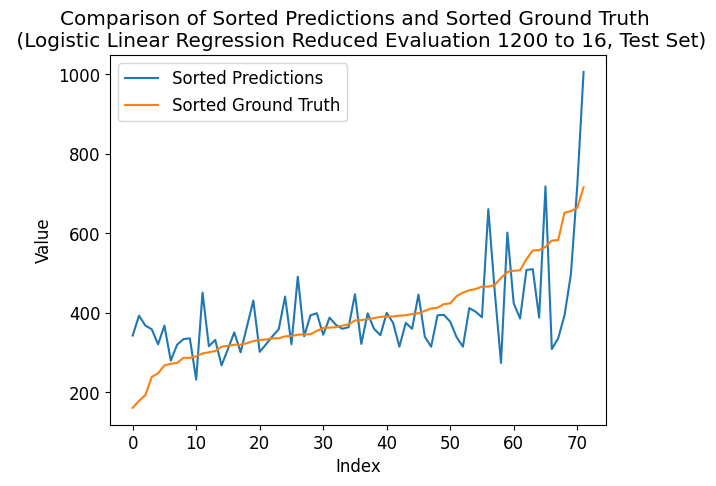

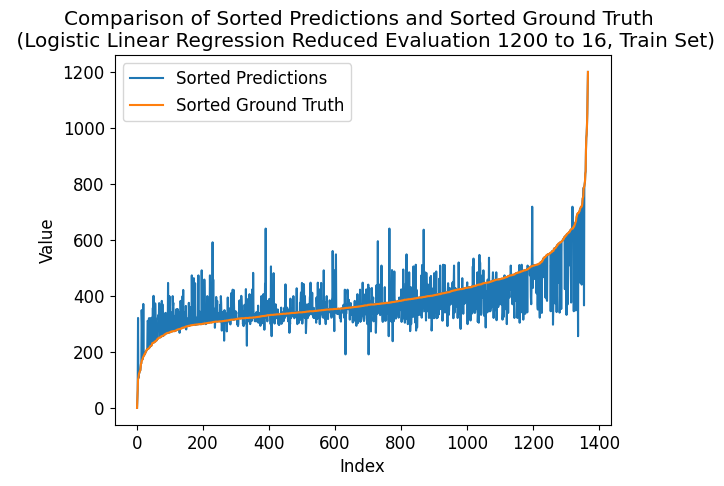

---- ---- ----
class_num = 1216
Number of unique elements: 424
[   0.   76.  152.  228.  304.  380.  456.  532.  608.  684.  760.  836.
  912.  988. 1064. 1140. 1216.]
test eval:
Mean squared error: 1.3472222222222223
Correlation coefficient: 0.669542708020618
Coefficient of determination (R-squared score, R2 score): 0.39327599687255665
train eval:
Mean squared error: 0.9590643274853801
Correlation coefficient: 0.7987977496504457
Coefficient of determination (R-squared score, R2 score): 0.6118577398202771


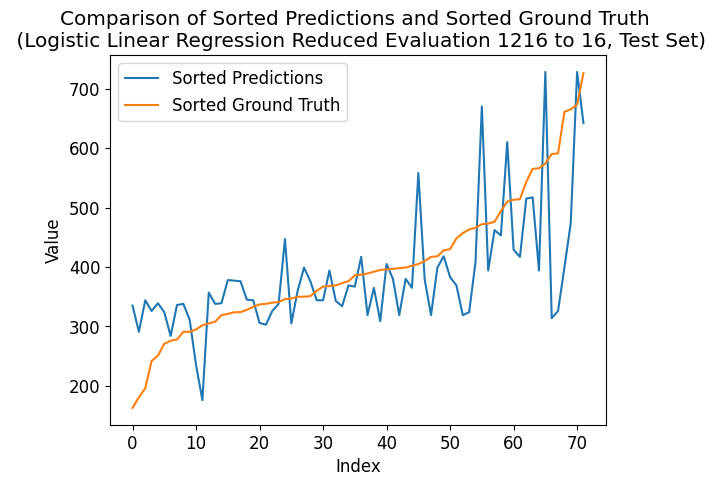

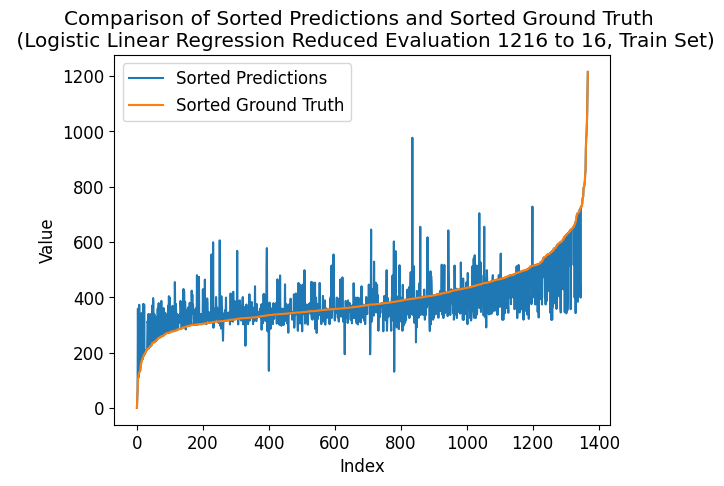

---- ---- ----
class_num = 1232
Number of unique elements: 429
[   0.   77.  154.  231.  308.  385.  462.  539.  616.  693.  770.  847.
  924. 1001. 1078. 1155. 1232.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.48368172171545154
Coefficient of determination (R-squared score, R2 score): 0.13682564503518369
train eval:
Mean squared error: 0.8662280701754386
Correlation coefficient: 0.8185604916713871
Coefficient of determination (R-squared score, R2 score): 0.6494294372614546


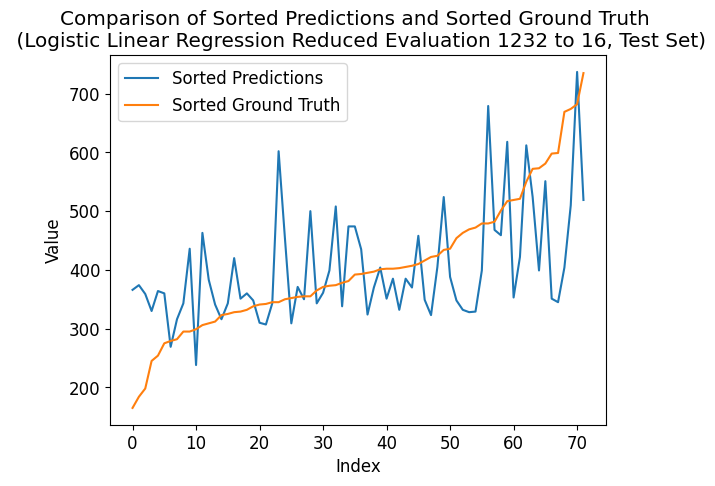

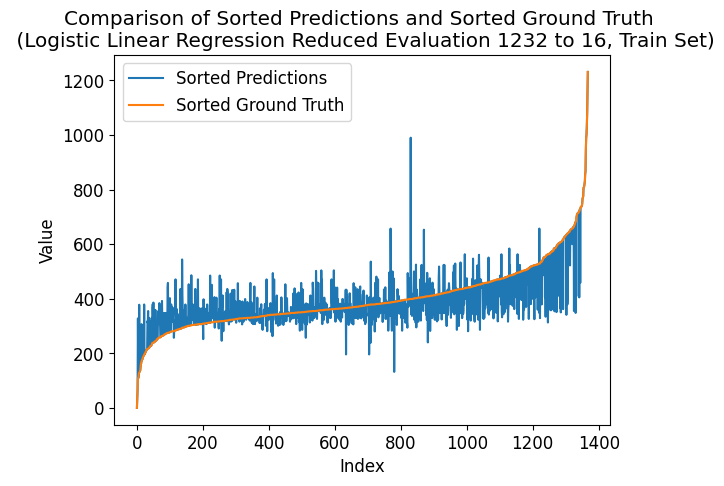

---- ---- ----
class_num = 1248
Number of unique elements: 435
[   0.   78.  156.  234.  312.  390.  468.  546.  624.  702.  780.  858.
  936. 1014. 1092. 1170. 1248.]
test eval:
Mean squared error: 2.013888888888889
Correlation coefficient: 0.4557447489096907
Coefficient of determination (R-squared score, R2 score): 0.09304143862392489
train eval:
Mean squared error: 0.9042397660818714
Correlation coefficient: 0.8105307096421316
Coefficient of determination (R-squared score, R2 score): 0.634045750120185


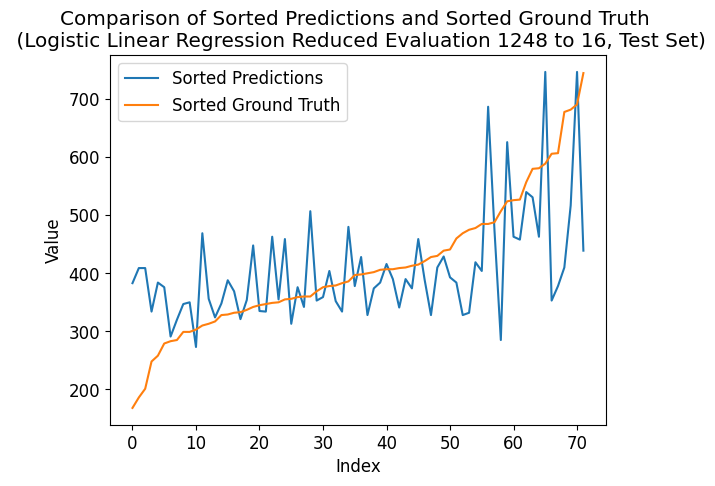

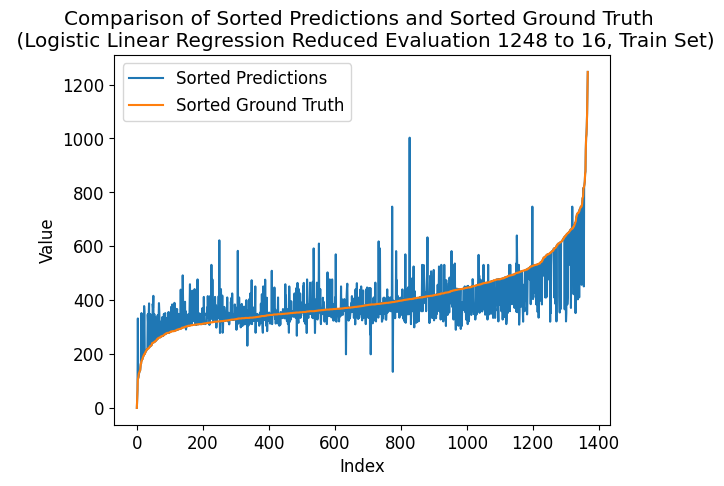

---- ---- ----
class_num = 1264
Number of unique elements: 437
[   0.   79.  158.  237.  316.  395.  474.  553.  632.  711.  790.  869.
  948. 1027. 1106. 1185. 1264.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.5905686286217978
Coefficient of determination (R-squared score, R2 score): 0.29945269741985925
train eval:
Mean squared error: 0.8421052631578947
Correlation coefficient: 0.8204105479241081
Coefficient of determination (R-squared score, R2 score): 0.659192161793414


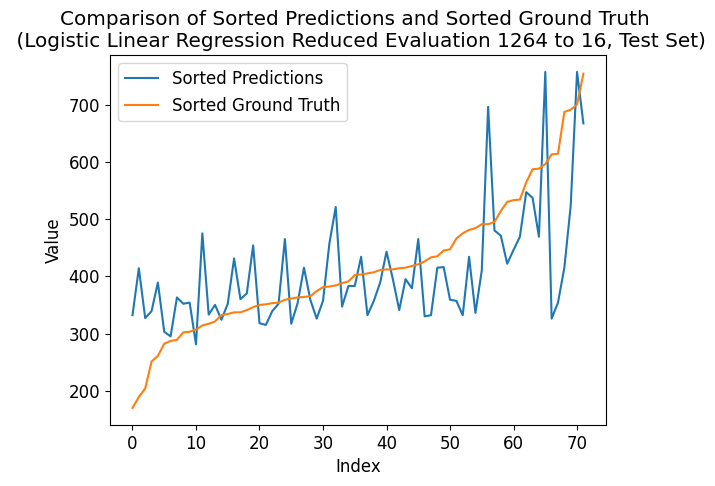

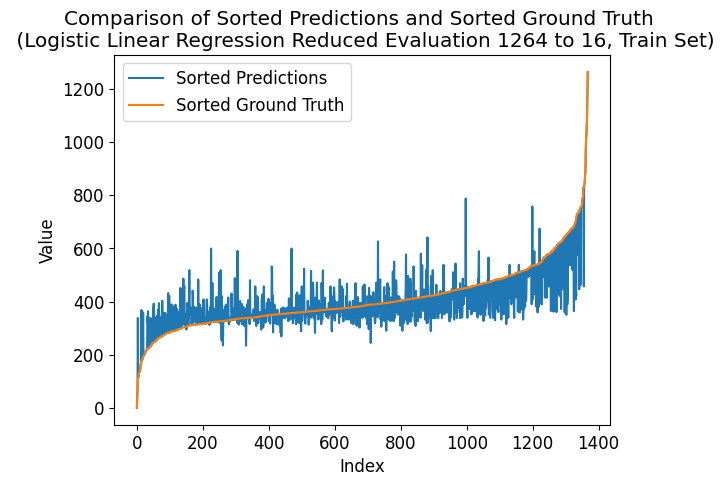

---- ---- ----
class_num = 1280
Number of unique elements: 434
[   0.   80.  160.  240.  320.  400.  480.  560.  640.  720.  800.  880.
  960. 1040. 1120. 1200. 1280.]
test eval:
Mean squared error: 2.1527777777777777
Correlation coefficient: 0.44392344147623386
Coefficient of determination (R-squared score, R2 score): 0.030492572322126654
train eval:
Mean squared error: 0.9071637426900585
Correlation coefficient: 0.8099260578664155
Coefficient of determination (R-squared score, R2 score): 0.6328623895708567


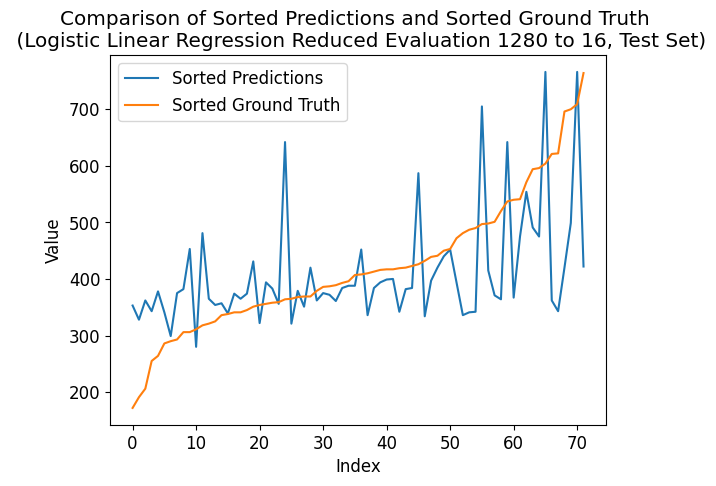

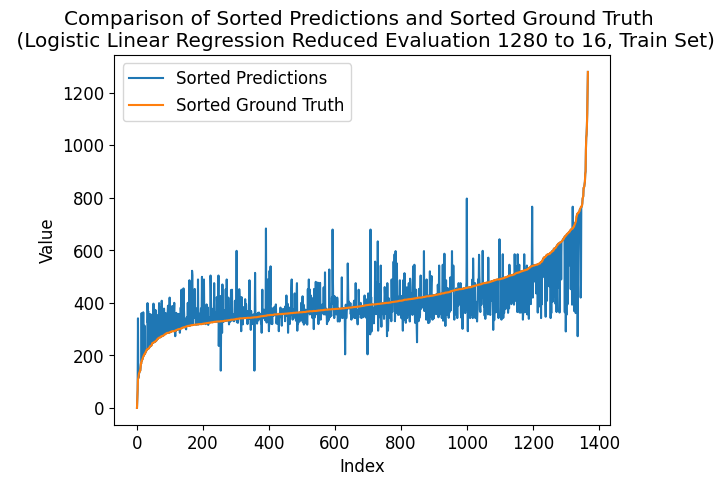

---- ---- ----
class_num = 1296
Number of unique elements: 444
[   0.   81.  162.  243.  324.  405.  486.  567.  648.  729.  810.  891.
  972. 1053. 1134. 1215. 1296.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.48982783064902174
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 0.8421052631578947
Correlation coefficient: 0.8231645480238202
Coefficient of determination (R-squared score, R2 score): 0.659192161793414


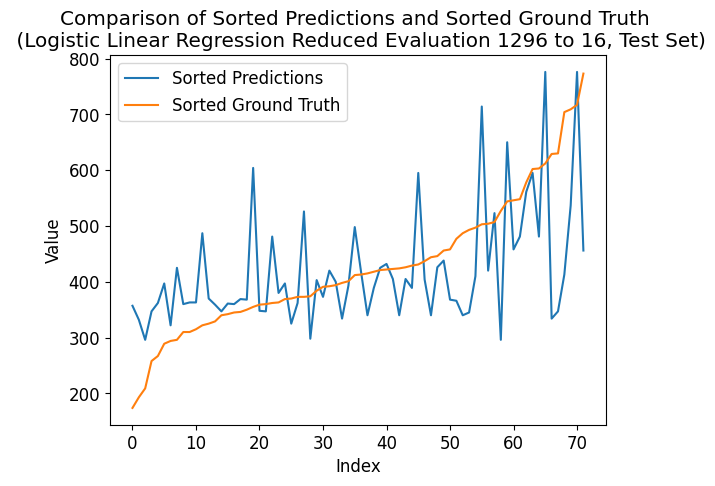

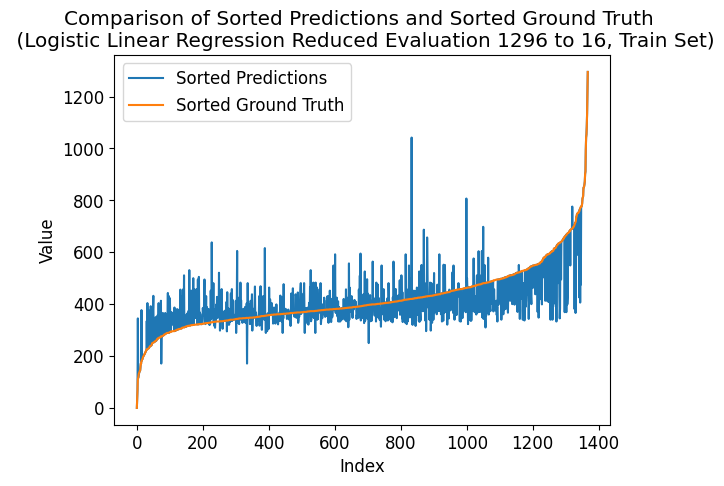

---- ---- ----
class_num = 1312
Number of unique elements: 448
[   0.   82.  164.  246.  328.  410.  492.  574.  656.  738.  820.  902.
  984. 1066. 1148. 1230. 1312.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.5250813203838989
Coefficient of determination (R-squared score, R2 score): 0.12431587177482406
train eval:
Mean squared error: 0.8837719298245614
Correlation coefficient: 0.8148117898872789
Coefficient of determination (R-squared score, R2 score): 0.642329273965484


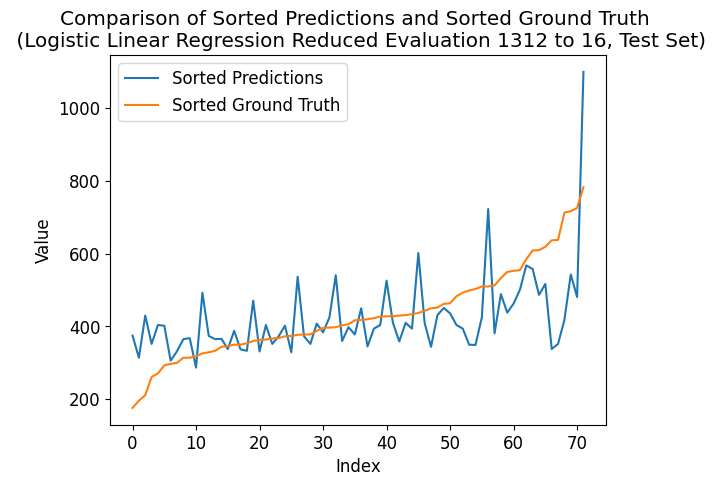

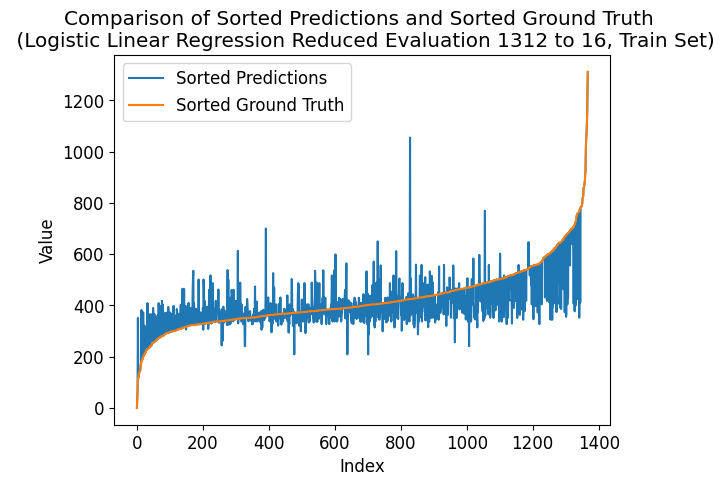

---- ---- ----
class_num = 1328
Number of unique elements: 444
[   0.   83.  166.  249.  332.  415.  498.  581.  664.  747.  830.  913.
  996. 1079. 1162. 1245. 1328.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.5584166445799046
Coefficient of determination (R-squared score, R2 score): 0.22439405785770128
train eval:
Mean squared error: 0.8538011695906432
Correlation coefficient: 0.820903224918121
Coefficient of determination (R-squared score, R2 score): 0.6544587195961004


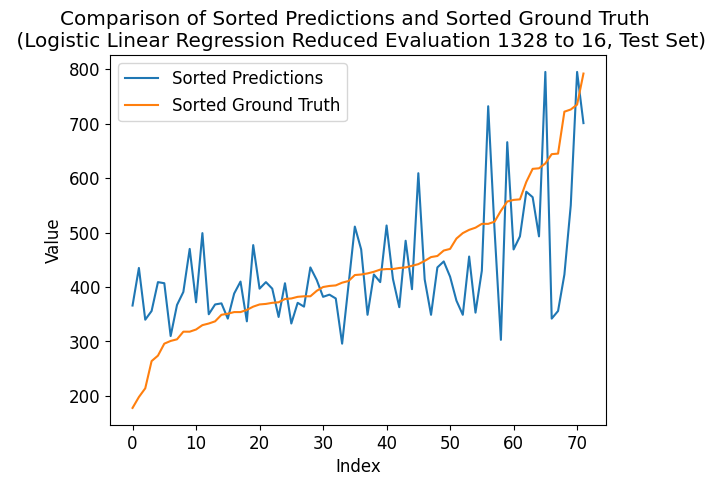

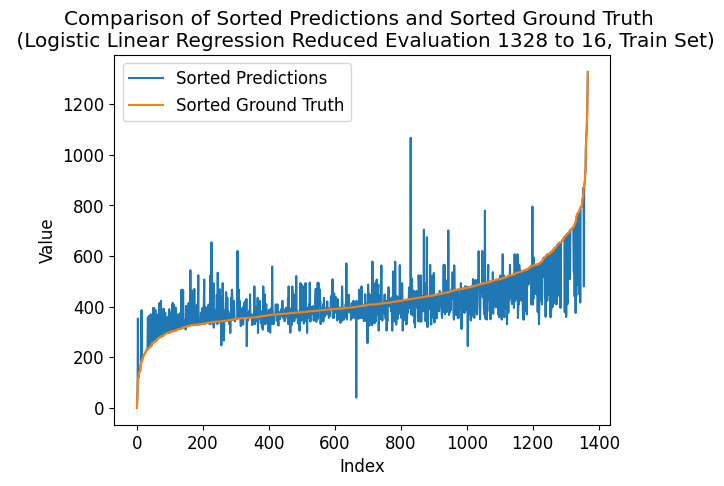

---- ---- ----
class_num = 1344
Number of unique elements: 449
[   0.   84.  168.  252.  336.  420.  504.  588.  672.  756.  840.  924.
 1008. 1092. 1176. 1260. 1344.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.5606924656749812
Coefficient of determination (R-squared score, R2 score): 0.2681782642689601
train eval:
Mean squared error: 0.8355263157894737
Correlation coefficient: 0.8276340394901459
Coefficient of determination (R-squared score, R2 score): 0.661854723029403


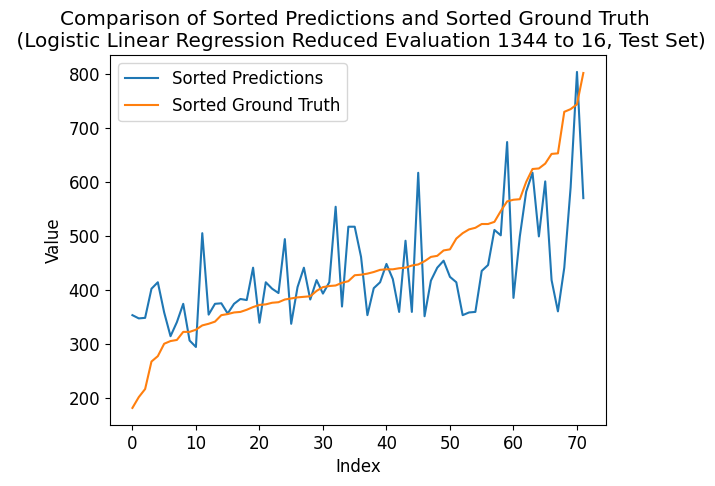

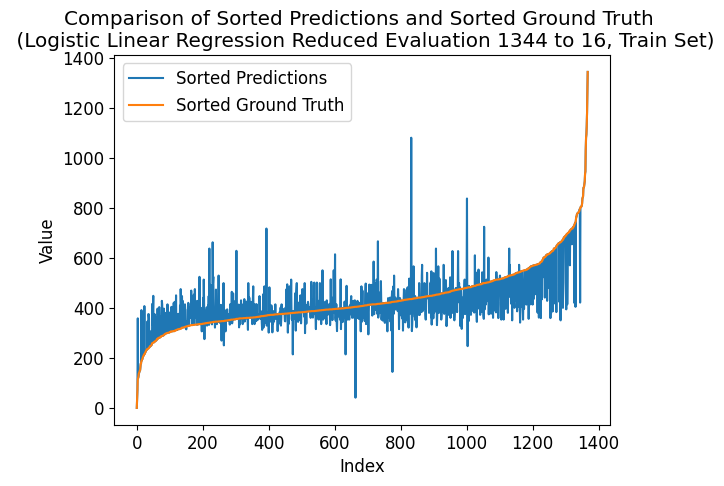

---- ---- ----
class_num = 1360
Number of unique elements: 451
[   0.   85.  170.  255.  340.  425.  510.  595.  680.  765.  850.  935.
 1020. 1105. 1190. 1275. 1360.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.5381346874139383
Coefficient of determination (R-squared score, R2 score): 0.2306489444878812
train eval:
Mean squared error: 0.8421052631578947
Correlation coefficient: 0.8216716185651252
Coefficient of determination (R-squared score, R2 score): 0.659192161793414


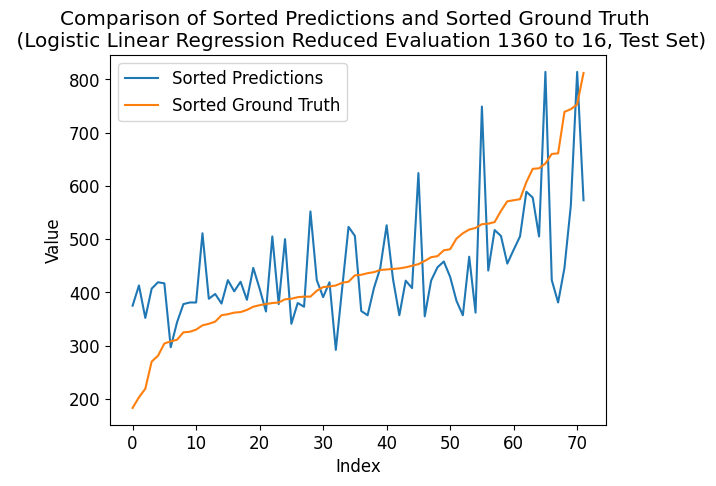

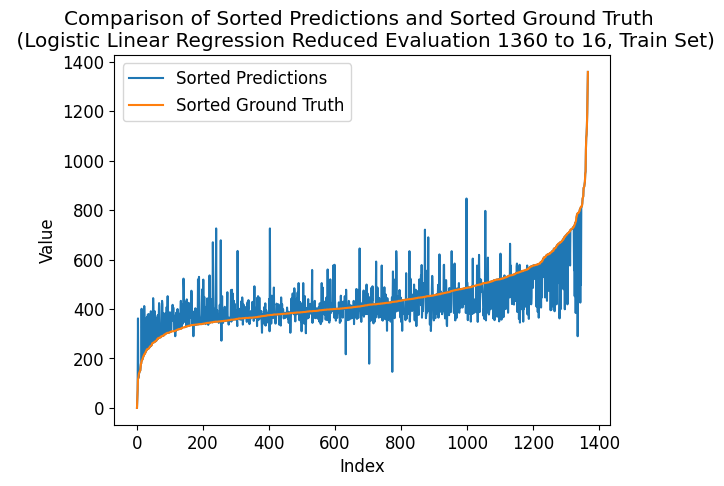

---- ---- ----
class_num = 1376
Number of unique elements: 458
[   0.   86.  172.  258.  344.  430.  516.  602.  688.  774.  860.  946.
 1032. 1118. 1204. 1290. 1376.]
test eval:
Mean squared error: 2.0
Correlation coefficient: 0.46444354588772147
Coefficient of determination (R-squared score, R2 score): 0.09929632525410481
train eval:
Mean squared error: 0.8603801169590644
Correlation coefficient: 0.8208085543215203
Coefficient of determination (R-squared score, R2 score): 0.6517961583601115


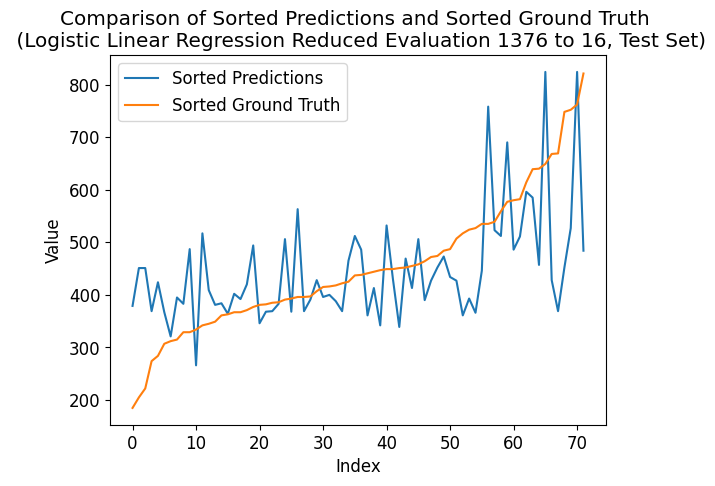

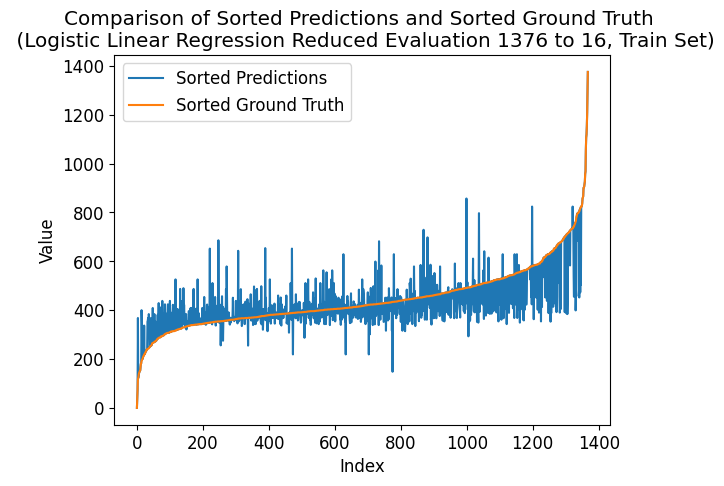

---- ---- ----
class_num = 1392
Number of unique elements: 464
[   0.   87.  174.  261.  348.  435.  522.  609.  696.  783.  870.  957.
 1044. 1131. 1218. 1305. 1392.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5468769310036775
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 0.8618421052631579
Correlation coefficient: 0.8181412115013
Coefficient of determination (R-squared score, R2 score): 0.6512044780854472


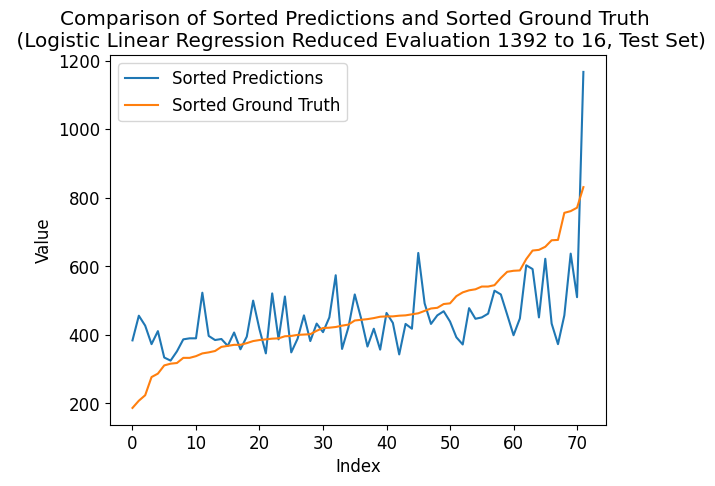

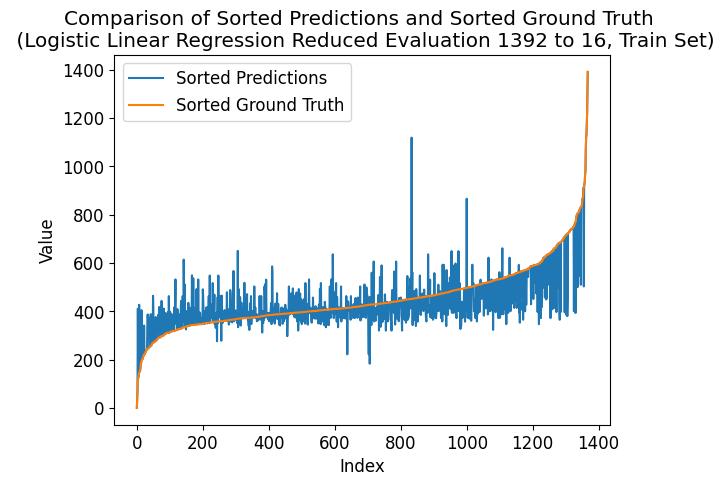

---- ---- ----
class_num = 1408
Number of unique elements: 472
[   0.   88.  176.  264.  352.  440.  528.  616.  704.  792.  880.  968.
 1056. 1144. 1232. 1320. 1408.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.6047750529736998
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 0.8062865497076024
Correlation coefficient: 0.8310027631497194
Coefficient of determination (R-squared score, R2 score): 0.6736883285226873


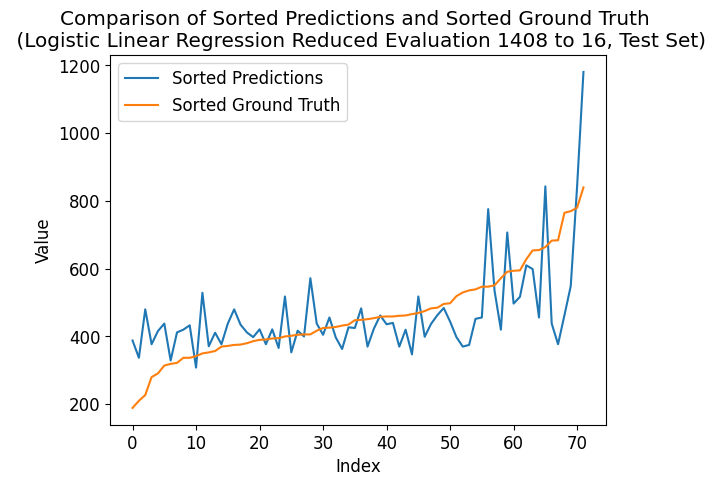

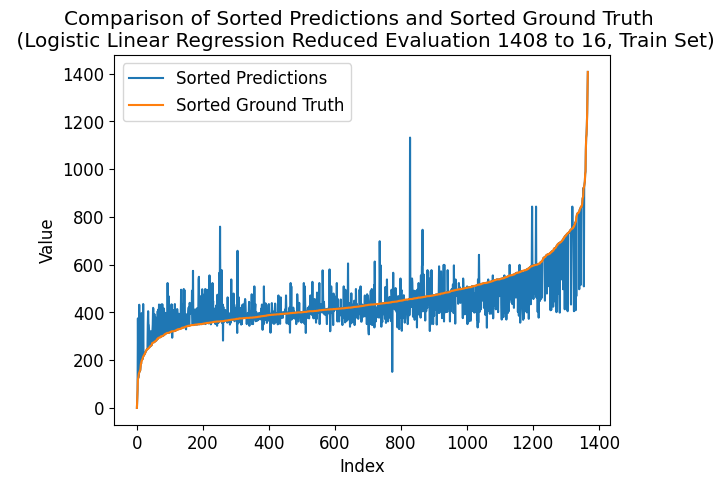

---- ---- ----
class_num = 1424
Number of unique elements: 467
[   0.   89.  178.  267.  356.  445.  534.  623.  712.  801.  890.  979.
 1068. 1157. 1246. 1335. 1424.]
test eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.5334568495196507
Coefficient of determination (R-squared score, R2 score): 0.14933541829554342
train eval:
Mean squared error: 0.8596491228070176
Correlation coefficient: 0.8203348413259055
Coefficient of determination (R-squared score, R2 score): 0.6520919984974436


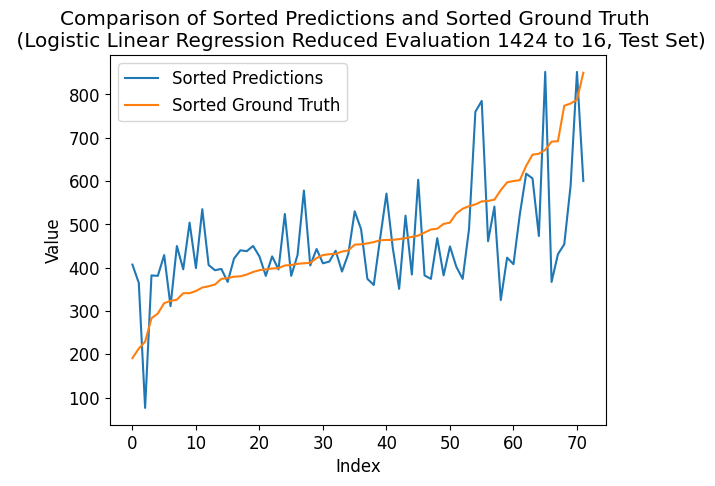

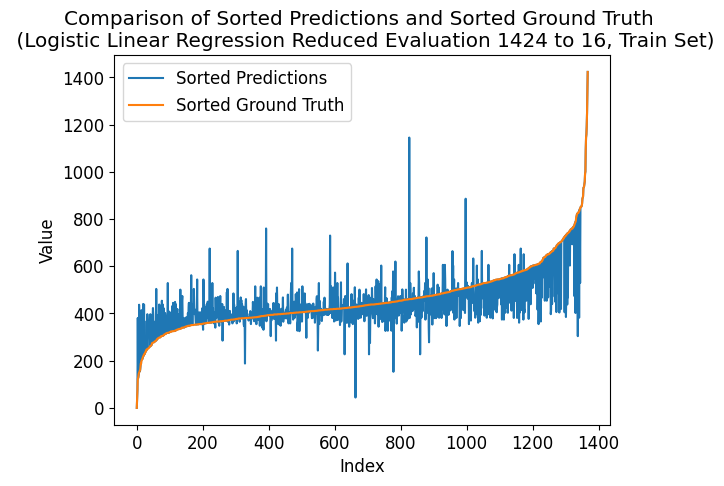

---- ---- ----
class_num = 1440
Number of unique elements: 474
[   0.   90.  180.  270.  360.  450.  540.  630.  720.  810.  900.  990.
 1080. 1170. 1260. 1350. 1440.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.49911767696909115
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 0.7587719298245614
Correlation coefficient: 0.8412324893539133
Coefficient of determination (R-squared score, R2 score): 0.6929179374492742


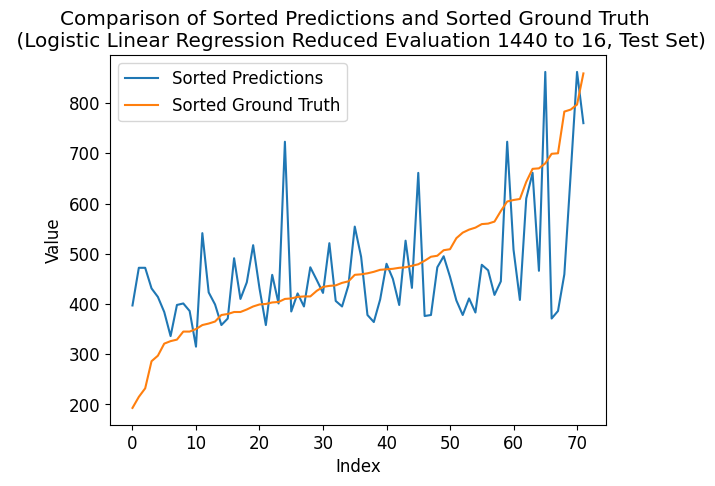

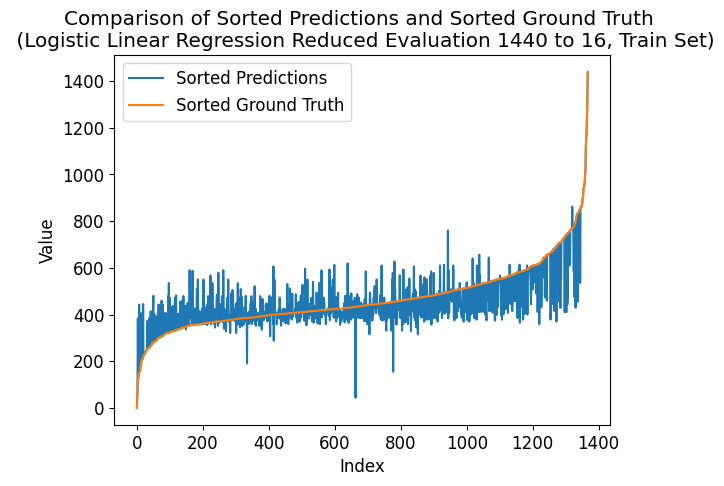

---- ---- ----
class_num = 1456
Number of unique elements: 475
[   0.   91.  182.  273.  364.  455.  546.  637.  728.  819.  910. 1001.
 1092. 1183. 1274. 1365. 1456.]
test eval:
Mean squared error: 2.1666666666666665
Correlation coefficient: 0.4361714693569455
Coefficient of determination (R-squared score, R2 score): 0.024237685691946842
train eval:
Mean squared error: 0.7711988304093568
Correlation coefficient: 0.8384061120584101
Coefficient of determination (R-squared score, R2 score): 0.6878886551146284


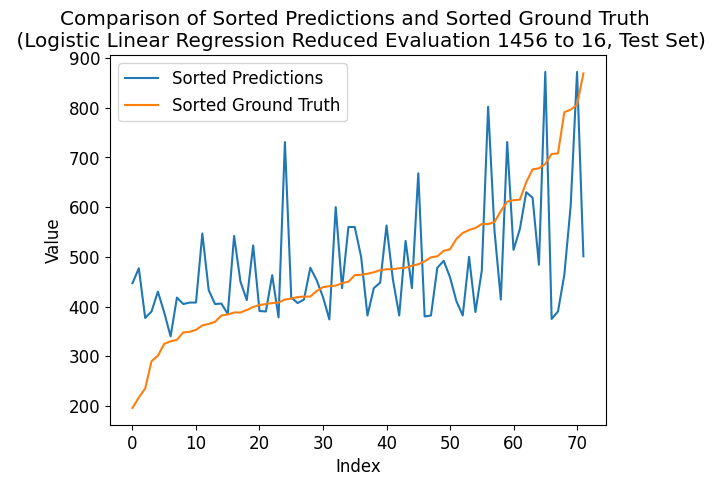

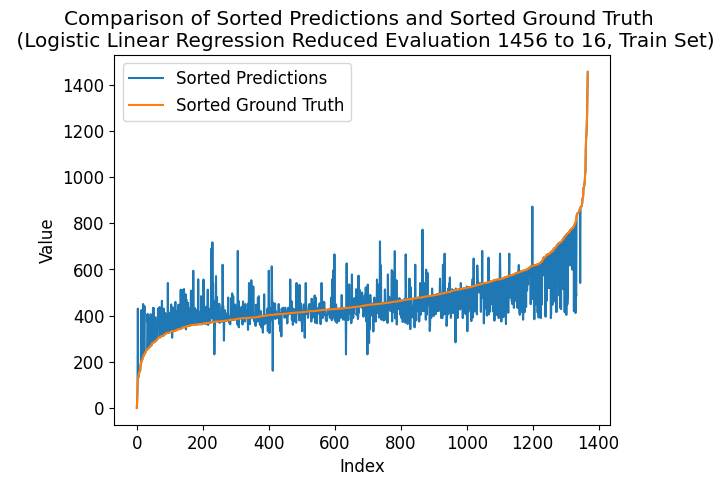

---- ---- ----
class_num = 1472
Number of unique elements: 478
[   0.   92.  184.  276.  368.  460.  552.  644.  736.  828.  920. 1012.
 1104. 1196. 1288. 1380. 1472.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.5926197799254607
Coefficient of determination (R-squared score, R2 score): 0.23690383111806101
train eval:
Mean squared error: 0.8852339181286549
Correlation coefficient: 0.8149085392477671
Coefficient of determination (R-squared score, R2 score): 0.6417375936908198


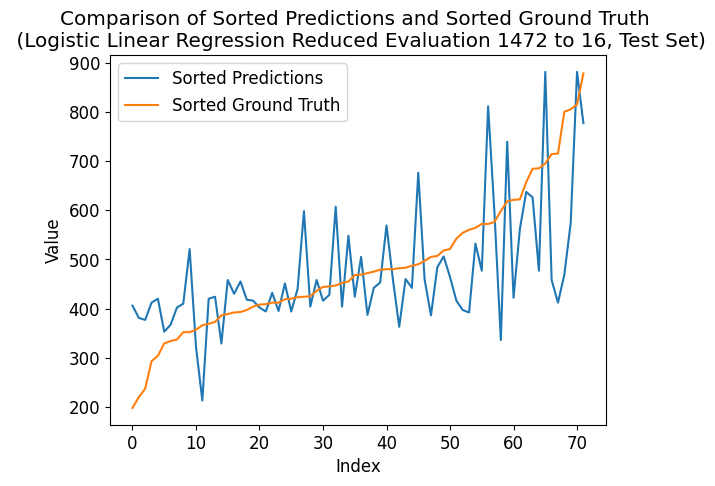

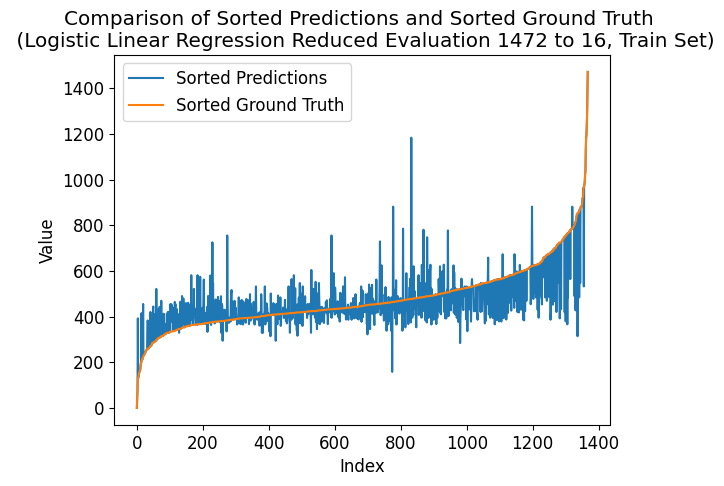

---- ---- ----
class_num = 1488
Number of unique elements: 475
[   0.   93.  186.  279.  372.  465.  558.  651.  744.  837.  930. 1023.
 1116. 1209. 1302. 1395. 1488.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.5627267851838628
Coefficient of determination (R-squared score, R2 score): 0.2681782642689601
train eval:
Mean squared error: 0.8976608187134503
Correlation coefficient: 0.8109854042277836
Coefficient of determination (R-squared score, R2 score): 0.636708311356174


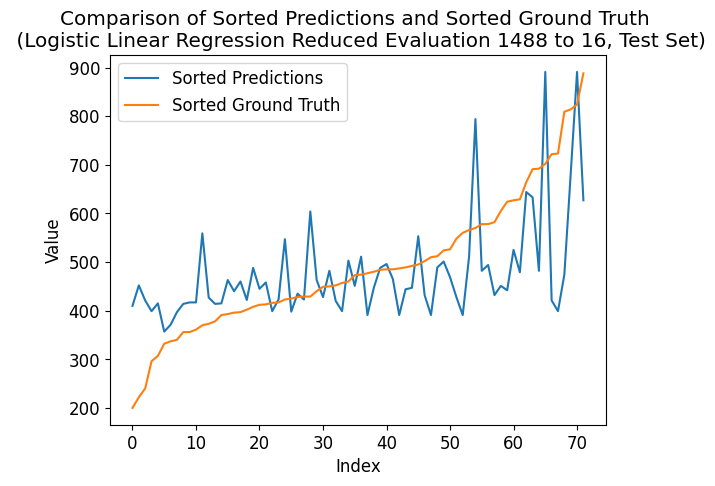

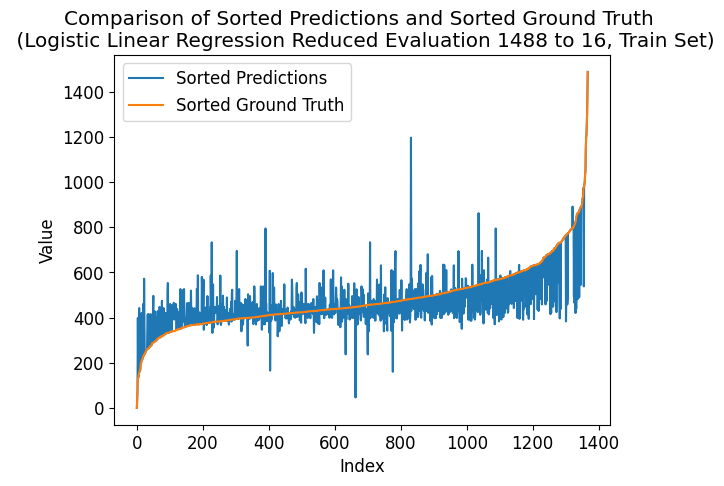

---- ---- ----
class_num = 1504
Number of unique elements: 480
[   0.   94.  188.  282.  376.  470.  564.  658.  752.  846.  940. 1034.
 1128. 1222. 1316. 1410. 1504.]
test eval:
Mean squared error: 2.013888888888889
Correlation coefficient: 0.41379069083170134
Coefficient of determination (R-squared score, R2 score): 0.09304143862392489
train eval:
Mean squared error: 0.8786549707602339
Correlation coefficient: 0.8154825401959905
Coefficient of determination (R-squared score, R2 score): 0.6444001549268088


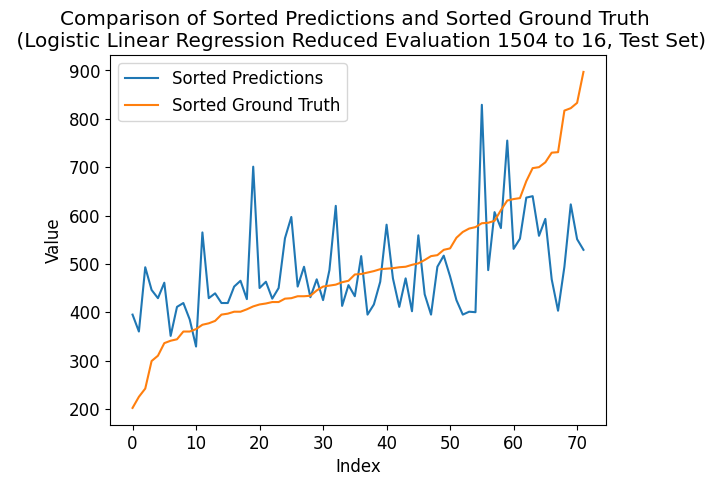

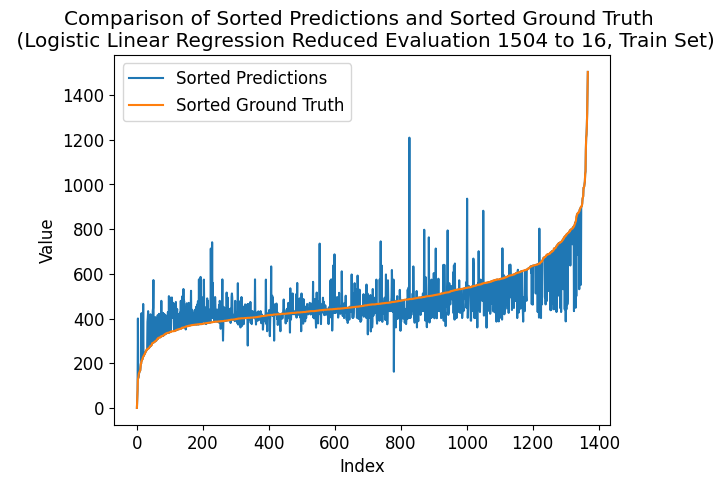

---- ---- ----
class_num = 1520
Number of unique elements: 485
[   0.   95.  190.  285.  380.  475.  570.  665.  760.  855.  950. 1045.
 1140. 1235. 1330. 1425. 1520.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.5414615497442512
Coefficient of determination (R-squared score, R2 score): 0.19311962470680222
train eval:
Mean squared error: 0.7902046783625731
Correlation coefficient: 0.8375790360851034
Coefficient of determination (R-squared score, R2 score): 0.6801968115439936


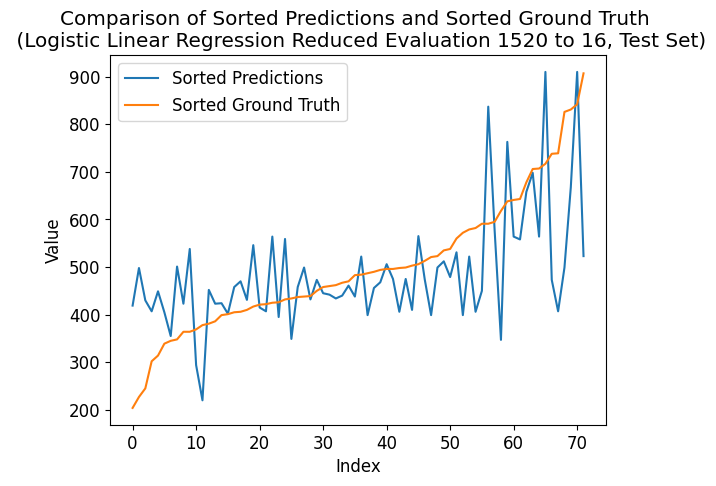

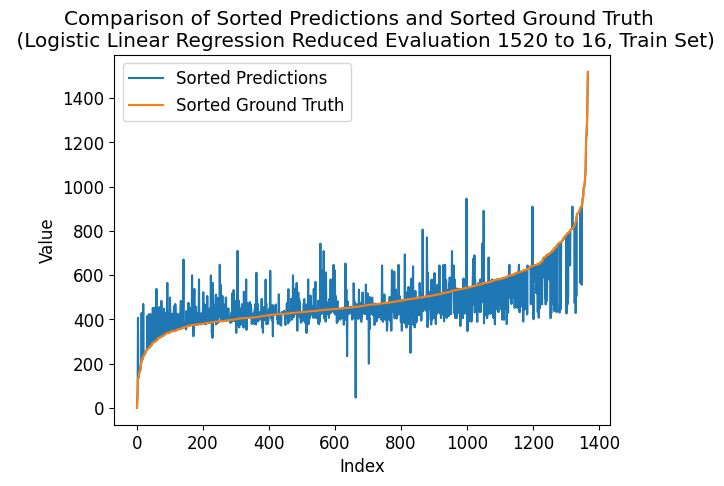

---- ---- ----
class_num = 1536
Number of unique elements: 488
[   0.   96.  192.  288.  384.  480.  576.  672.  768.  864.  960. 1056.
 1152. 1248. 1344. 1440. 1536.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.577963737647716
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
train eval:
Mean squared error: 0.7814327485380117
Correlation coefficient: 0.8377500314894535
Coefficient of determination (R-squared score, R2 score): 0.6837468931919788


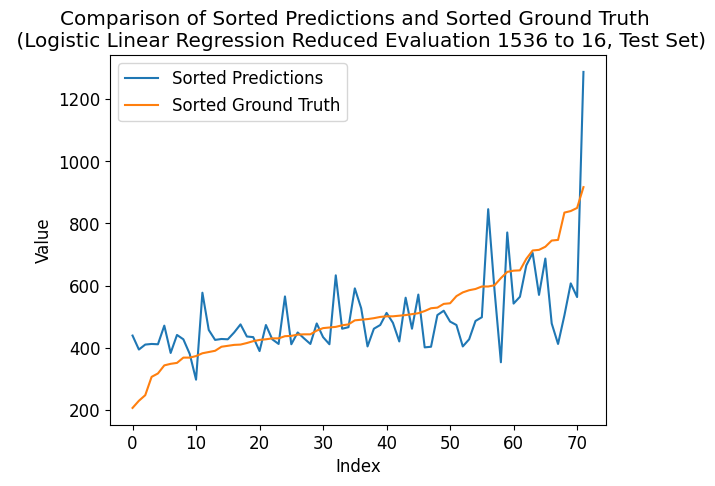

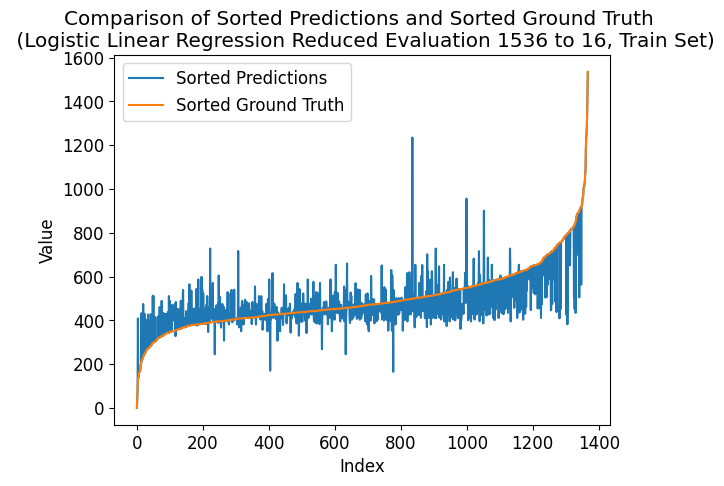

---- ---- ----
class_num = 1552
Number of unique elements: 493
[   0.   97.  194.  291.  388.  485.  582.  679.  776.  873.  970. 1067.
 1164. 1261. 1358. 1455. 1552.]
test eval:
Mean squared error: 1.9583333333333333
Correlation coefficient: 0.4747985675175252
Coefficient of determination (R-squared score, R2 score): 0.11806098514464425
train eval:
Mean squared error: 0.7865497076023392
Correlation coefficient: 0.834620938763541
Coefficient of determination (R-squared score, R2 score): 0.6816760122306541


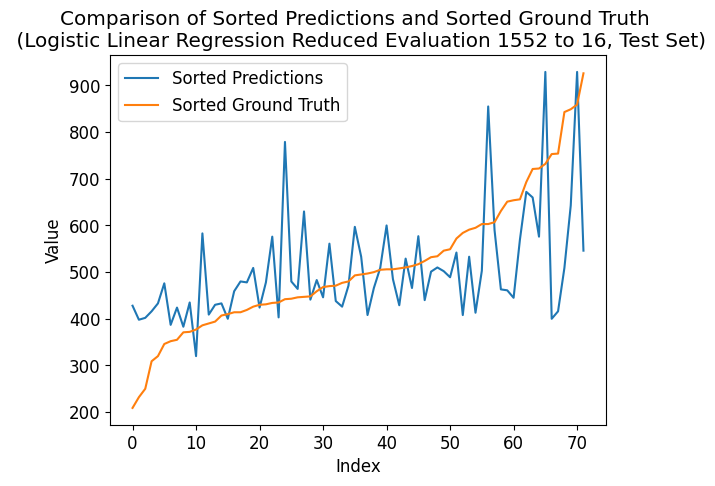

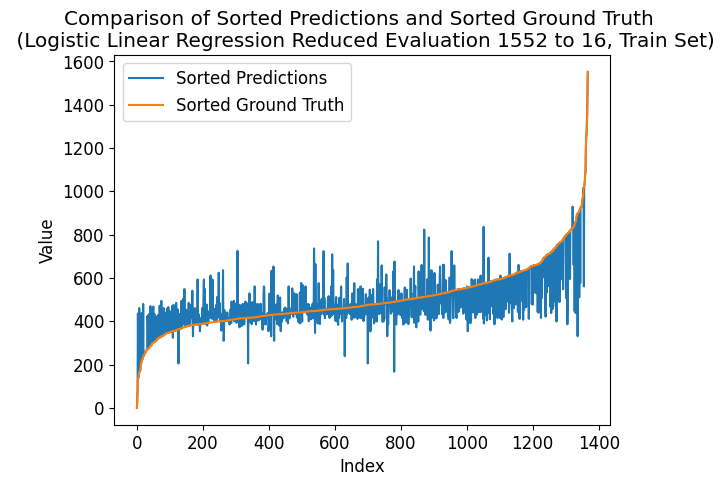

---- ---- ----
class_num = 1568
Number of unique elements: 487
[   0.   98.  196.  294.  392.  490.  588.  686.  784.  882.  980. 1078.
 1176. 1274. 1372. 1470. 1568.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.4989222142274535
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 0.8128654970760234
Correlation coefficient: 0.8302331146793394
Coefficient of determination (R-squared score, R2 score): 0.6710257672866984


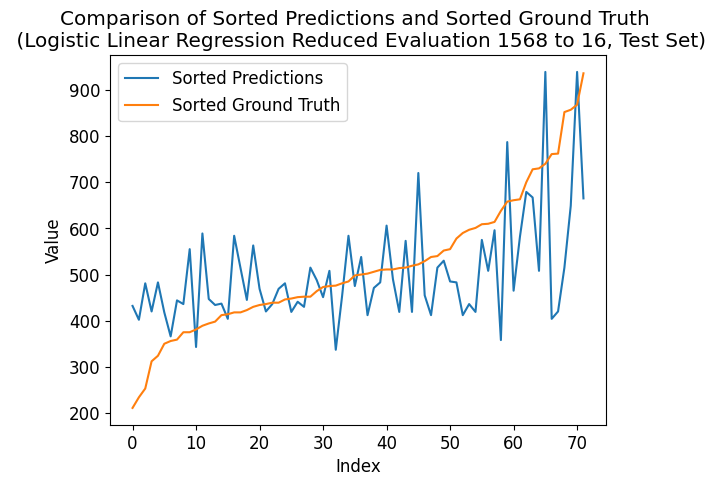

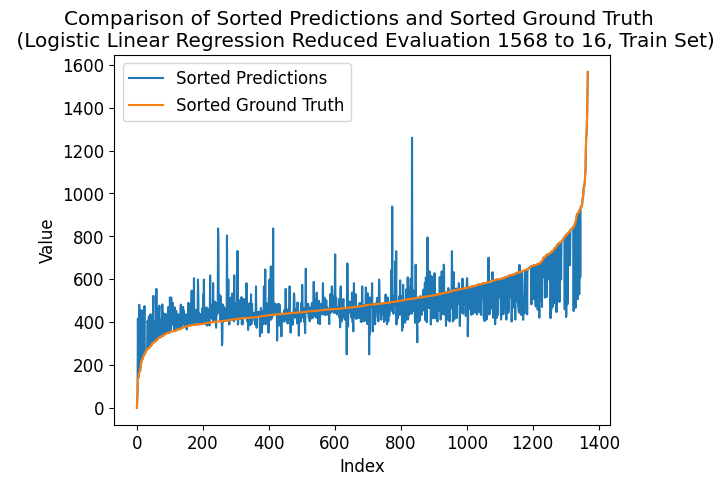

---- ---- ----
class_num = 1584
Number of unique elements: 499
[   0.   99.  198.  297.  396.  495.  594.  693.  792.  891.  990. 1089.
 1188. 1287. 1386. 1485. 1584.]
test eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.4555607155822026
Coefficient of determination (R-squared score, R2 score): 0.14933541829554342
train eval:
Mean squared error: 0.7346491228070176
Correlation coefficient: 0.8478658544097621
Coefficient of determination (R-squared score, R2 score): 0.7026806619812336


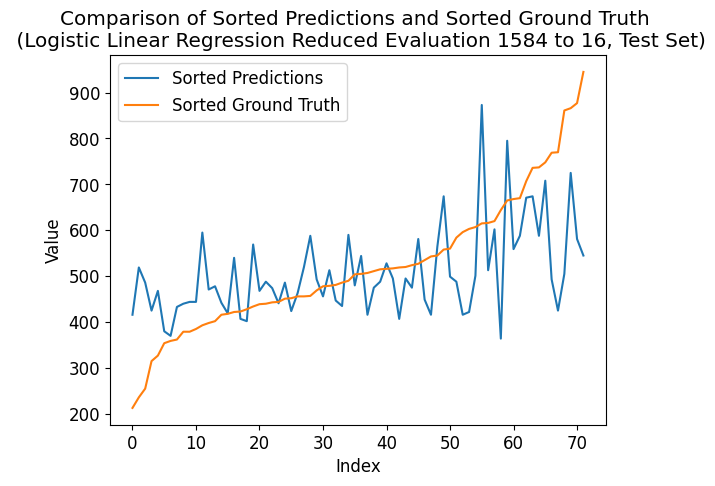

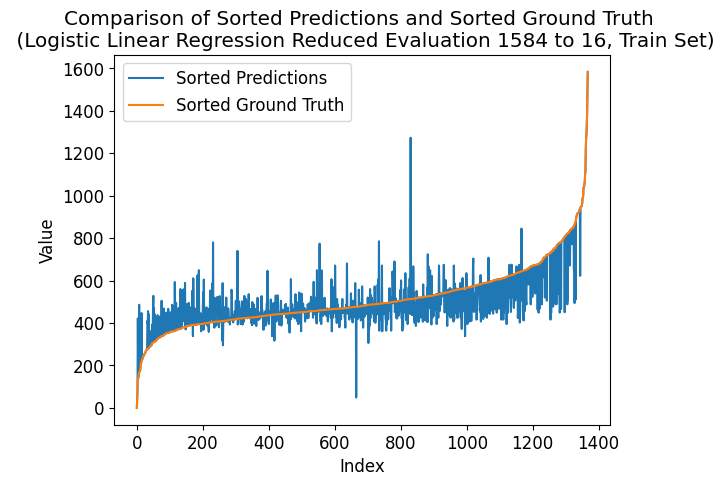

---- ---- ----
class_num = 1600
Number of unique elements: 502
[   0.  100.  200.  300.  400.  500.  600.  700.  800.  900. 1000. 1100.
 1200. 1300. 1400. 1500. 1600.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.5291764003009256
Coefficient of determination (R-squared score, R2 score): 0.17435496481626267
train eval:
Mean squared error: 0.7785087719298246
Correlation coefficient: 0.8367332380315787
Coefficient of determination (R-squared score, R2 score): 0.6849302537413073


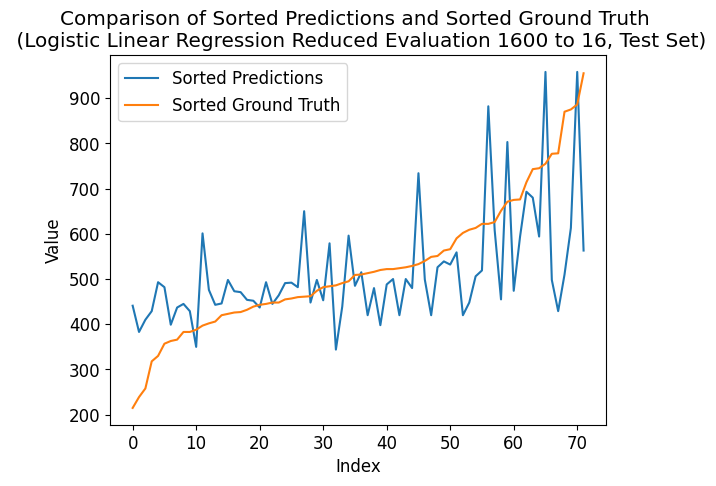

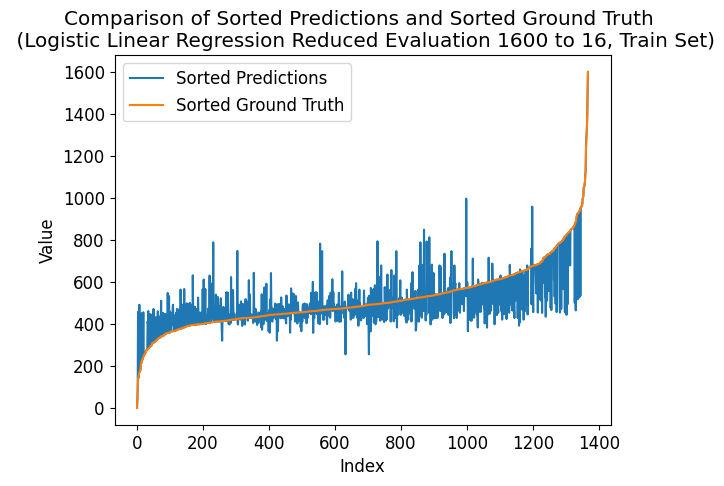

In [44]:
# independent data
x = group_satcked_green
# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max

print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

reduced_class_num = 16
class_num_array = np.arange(reduced_class_num, reduced_class_num * 100 + 1, reduced_class_num)
# class_num_array = np.arange(reduced_class_num * 5, reduced_class_num * 40 + 1, reduced_class_num)
mse_test_list = []
correlation_test_list = []
r_squared_test_list = []
mse_train_list = []
correlation_train_list = []
r_squared_train_list = []

for class_num in class_num_array:
    print('---- ---- ----')
    print(f'class_num = {class_num}')

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)

    # Generate class_num+1 evenly spaced intervals
    intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
    # print(intervals)
    # Digitize the array to get the indices of the intervals
    y_train = np.digitize(y_train, intervals) - 1
    y_test = np.digitize(y_test, intervals) - 1

    # to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
    unique_elements = np.unique(y_train)
    # print("Unique elements:", unique_elements)
    print("Number of unique elements:", len(unique_elements))

    model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
    fit_result = model.fit(x_train, y_train)

    y_pred = model.predict(x_test)
    y_pred_ = model.predict(x_train)

    # Define the boundaries for digitization
    intervals = np.arange(0, class_num+1, class_num/16)
    print(intervals)

    y_train_digital = np.digitize(y_train, intervals) - 1
    y_test_digital = np.digitize(y_test, intervals) - 1
    y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
    y_pred_test_digital = np.digitize(y_pred, intervals) - 1
    # print(y_pred)
    # print(y_pred_test_digital)
    print("test eval:")
    mse = mean_squared_error(y_test_digital, y_pred_test_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_test_digital, y_pred_test_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_test_list.append(mse)
    correlation_test_list.append(correlation)
    r_squared_test_list.append(r_squared)

    print("train eval:")
    mse = mean_squared_error(y_train_digital, y_pred_train_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_train_digital, y_pred_train_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_train_list.append(mse)
    correlation_train_list.append(correlation)
    r_squared_train_list.append(r_squared)

    plot_comparison(y_test, y_pred, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Test Set')
    plot_comparison(y_train, y_pred_, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Train Set')



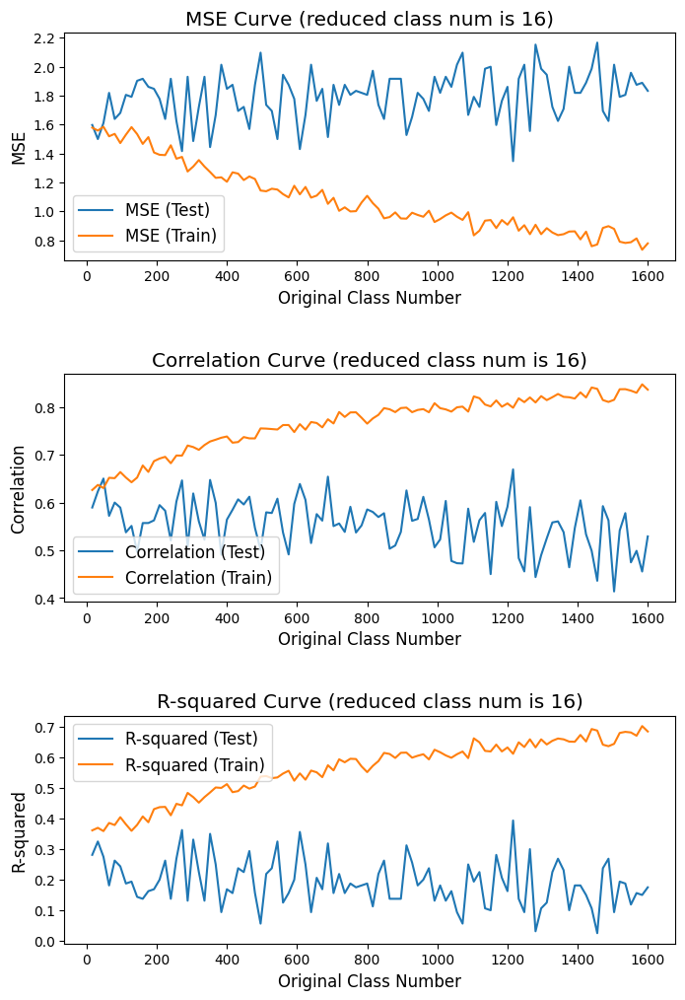

Max Index: 75
Max Original Class Num: 1216


In [45]:
# plot the trend figures of mse, correlation, and r2

# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 12))

# Plot MSE
ax1.plot(class_num_array, mse_test_list, label='MSE (Test)')
ax1.plot(class_num_array, mse_train_list, label='MSE (Train)')
ax1.set_ylabel('MSE')
ax1.set_xlabel('Original Class Number')
ax1.set_title(f'MSE Curve (reduced class num is {reduced_class_num})')
ax1.legend()

# Plot Correlation
ax2.plot(class_num_array, correlation_test_list, label='Correlation (Test)')
ax2.plot(class_num_array, correlation_train_list, label='Correlation (Train)')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Original Class Number')
ax2.set_title(f'Correlation Curve (reduced class num is {reduced_class_num})')
ax2.legend()

# Plot R-squared
ax3.plot(class_num_array, r_squared_test_list, label='R-squared (Test)')
ax3.plot(class_num_array, r_squared_train_list, label='R-squared (Train)')
ax3.set_ylabel('R-squared')
ax3.set_xlabel('Original Class Number')
ax3.set_title(f'R-squared Curve (reduced class num is {reduced_class_num})')
ax3.legend()

# Increase the vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Adjust tick, label, title, and legend font sizes
plt.rcParams.update({'font.size': 12})
ax1.tick_params(labelsize=10)
ax2.tick_params(labelsize=10)
ax3.tick_params(labelsize=10)

# Save the figure
plt.savefig(f'mse_correlation_r2_trend_curve_reduced_eval_reduced_class_num_{reduced_class_num}.png', bbox_inches='tight')

# Show the figure
plt.show()

# Convert r_squared_test_list to a NumPy array
r_squared_test_array = np.array(r_squared_test_list)
# Find the index of the maximum value
max_index = np.argmax(r_squared_test_array)
# Get the corresponding class_num value
max_class_num = class_num_array[max_index]

# Print the index and corresponding class_num
print("Max Index:", max_index)
print("Max Original Class Num:", max_class_num)

In [46]:
# calculate the mean value for the metrics in all situations
mse_test_array = np.array(mse_test_list)
r_squared_test_array = np.array(r_squared_test_list)
mse_train_array = np.array(mse_train_list)
r_squared_train_array = np.array(r_squared_train_list)
mse_test_mean = np.mean(mse_test_array)
r_squared_test_mean = np.mean(r_squared_test_array)
mse_train_mean = np.mean(mse_train_array)
r_squared_train_mean = np.mean(r_squared_train_array)

# Print the index and corresponding class_num
print("mean of mse test:", mse_test_mean)
print("mean of r2 score test:", r_squared_test_mean)
print("mean of mse train:", mse_train_mean)
print("mean of r2 score train:", r_squared_train_mean)


mean of mse test: 1.7948611111111115
mean of r2 score test: 0.19168100078186082
mean of mse train: 1.0848976608187133
mean of r2 score train: 0.5609318185799285
